# Getting started with `substrata`

This tutorial will walk you through the basics of using the `substrata` Python package for working with 3D point clouds and geometric transformations. You'll learn how to load point cloud data, apply transformations, and visualize results.


In [2]:
%load_ext autoreload
%autoreload 2

from substrata import *

# Set up logging to be verbose (INFO)
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger('unicorn')

/Users/pbongaerts/miniconda3/envs/unicorn_sam/lib/python3.10/site-packages/tqdm_joblib/__init__.py:4: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Loading a pointcloud 

INFO:substrata.pointclouds:Loading in pointcloud ../../example_data/cur_sna_20m_20230414/cur_sna_20m_20230414_dec1M.ply...
INFO:substrata.logging:Decimating point cloud from 1000000 to 50000 points


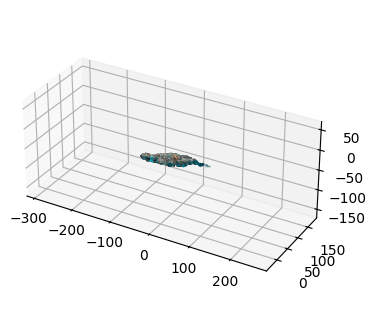

In [ ]:
pcd = PointCloud("../../example_data/cur_sna_20m_20230414/cur_sna_20m_20230414_dec1M.ply")
fig = pcd.plot()
scale_factor=0.10554
up_vector= [-0.69460111, 0.19638898, 0.60582374]
depth_offset= 19.68003823503938
#visualizations.show_vector_in_pcd(pcd, up_vector, [0,0,0], 100)

INFO:substrata.pointclouds:Loading in pointcloud ../../example_data/cur_sna_20m_20230414/cur_sna_20m_20230414_dec1M.ply...


INFO:substrata.pointclouds:Applied transform:
[[0.10554 0.      0.      0.     ]
 [0.      0.10554 0.      0.     ]
 [0.      0.      0.10554 0.     ]
 [0.      0.      0.      1.     ]]
INFO:substrata.logging:Decimating point cloud from 1000000 to 50000 points
INFO:substrata.pointclouds:Applied transform:
[[ 0.66930778  0.09349871  0.73707876  0.        ]
 [ 0.09349871  0.97356452 -0.20839895  0.        ]
 [-0.73707876  0.20839895  0.64287229  0.        ]
 [ 0.          0.          0.          1.        ]]
INFO:substrata.logging:Decimating point cloud from 1000000 to 50000 points
INFO:substrata.pointclouds:Applied transform:
[[  1.           0.           0.           0.        ]
 [  0.           1.           0.           0.        ]
 [  0.           0.           1.         -19.68003824]
 [  0.           0.           0.           1.        ]]
INFO:substrata.logging:Decimating point cloud from 1000000 to 50000 points
INFO:substrata.pointclouds:Applied transform:
[[ 0.37901128 -0.9253920

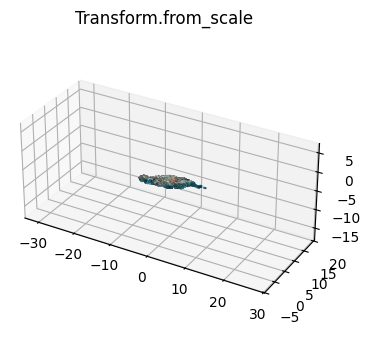

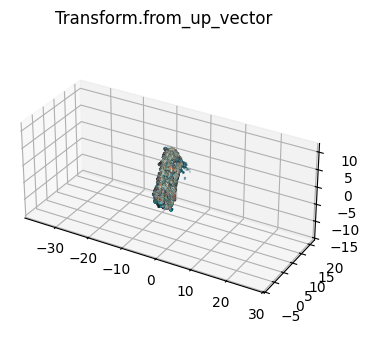

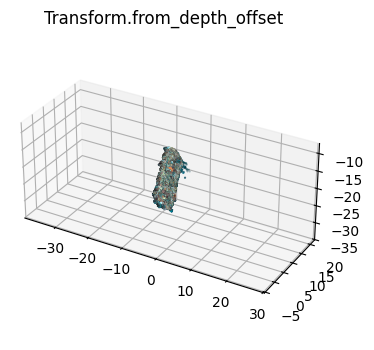

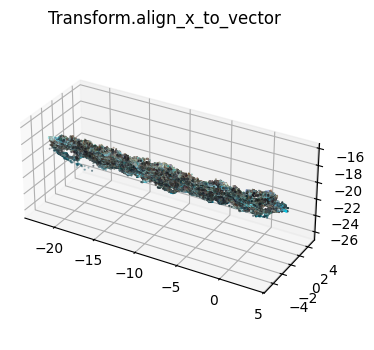

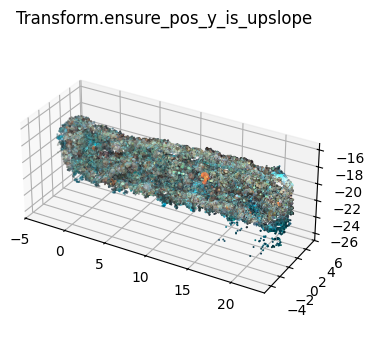

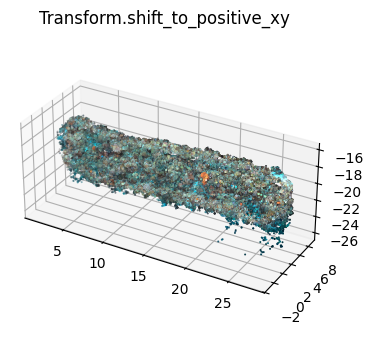

In [3]:
pcd = PointCloud("../../example_data/cur_sna_20m_20230414/cur_sna_20m_20230414_dec1M.ply")
pcd.apply_orientation_transforms(scale_factor, up_vector, depth_offset, plot=True)

INFO:substrata.logging:Decimating point cloud from 1000000 to 50000 points


INFO:substrata.logging:Decimating point cloud from 1000000 to 50000 points
INFO:substrata.logging:Decimating point cloud from 1000000 to 50000 points
INFO:substrata.logging:Decimating point cloud from 1000000 to 50000 points


'test_plot.pdf'

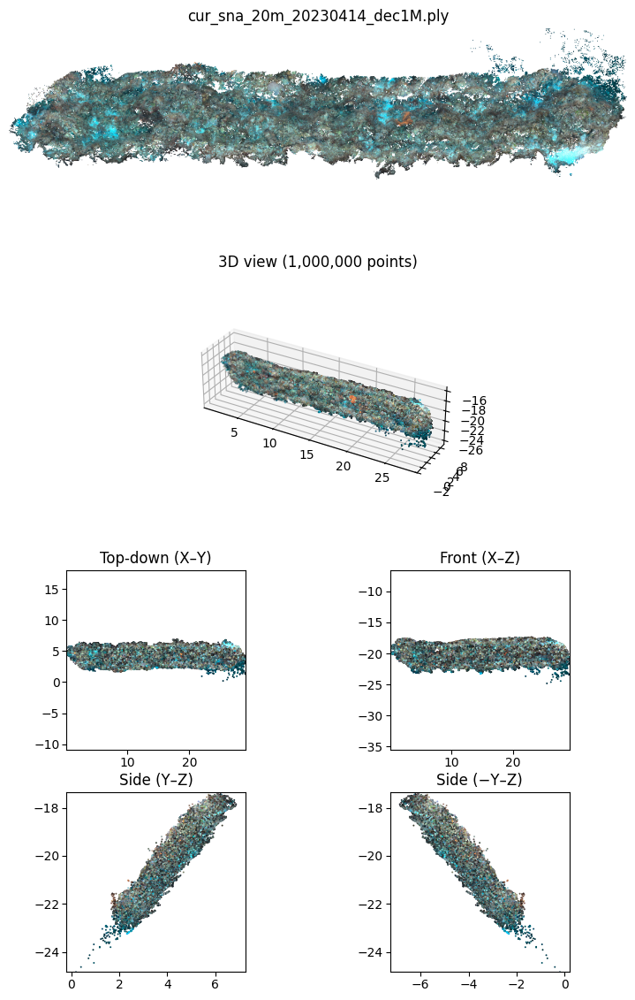

In [4]:
visualizations.plot_views(pcd)
pcd.save_pdf('test_plot.pdf')

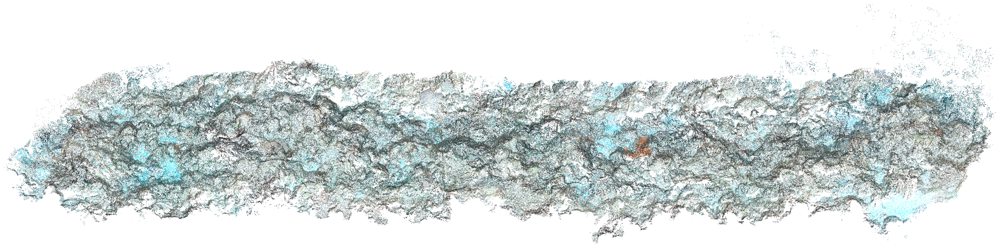

In [34]:
fig = visualizations.plot_2d_ortho(pcd, resolution=0.01)

In [ ]:
cams
anns = Annotations('../../example_data/cur_sna_20m_20230414/cur_sna_20m_20230414_markers.csv')
anns.apply_transform(pcd.world_transform)

AttributeError: module 'open3d.cpu.pybind.geometry' has no attribute 'transform_coords'

In [28]:
for ann in anns.subset(5):
    match = ann.get_first_image_match(cams)
    if match is not None:
        print(match.filepath)
        match.show()
    else:
        print("No match found: ", ann.coords)

/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04454.JPG
Image match for camera 506 at 8682, 3358
Depth: 108.9436353664052, Relevance: 4.980943322312305
No obstruction check performed


ValueError: Crop area falls outside image bounds: center=(8682, 3358), size=(1000x1000), image=/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04454.JPG

In [27]:
pcd = PointCloud('/Users/pbongaerts/Github/unicorn/examples/cur_sna/cur_sna_20m/cur_sna_20m_20200303/cur_sna_20m_20200303_dec7M.ply')
cams = Cameras('/Users/pbongaerts/Github/unicorn/examples/cur_sna/cur_sna_20m/cur_sna_20m_20200303/cur_sna_20m_20200303.meta.json',
               '/Users/pbongaerts/Github/unicorn/examples/cur_sna/cur_sna_20m/cur_sna_20m_20200303/cur_sna_20m_20200303.cams.xml')
#pcd.apply_transform(world_transform)
#cams.apply_transform(world_transform)
cams.set_filepath_replace('/home/deepcat/mounts/coral3d/focal_plots/cur_sna/cur_sna_20m/cur_sna_20m_20200303/cur_sna_20m_20200303.raw/', '/Users/pbongaerts/Github/unicorn/examples/cur_sna/cur_sna_20m/cur_sna_20m_20200303/cur_sna_20m_20200303.photos/')

anns = Annotations('/Users/pbongaerts/Github/unicorn/examples/cur_sna/cur_sna_20m/cur_sna_20m_20200303/cur_sna_20m_20200303_ann.csv', header=False)

INFO:substrata.pointclouds:Loading in pointcloud /Users/pbongaerts/Github/unicorn/examples/cur_sna/cur_sna_20m/cur_sna_20m_20200303/cur_sna_20m_20200303_dec7M.ply...
INFO:substrata.pointclouds:Applied transform:
[[-3.75205861e-04 -2.11005752e-01  3.98466962e-02  1.62435295e+01]
 [ 1.75381757e-01 -2.32932058e-02 -1.21696317e-01  4.42951957e+00]
 [ 1.23904908e-01  3.23315100e-02  1.72376260e-01  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


INFO:substrata.pointclouds:Loading in pointcloud /Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008_dec7M.ply...
INFO:substrata.pointclouds:Applied transform:
[[-3.75205861e-04 -2.11005752e-01  3.98466962e-02  1.62435295e+01]
 [ 1.75381757e-01 -2.32932058e-02 -1.21696317e-01  4.42951957e+00]
 [ 1.23904908e-01  3.23315100e-02  1.72376260e-01  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
INFO:substrata.logging:Decimating point cloud from 7000000 to 50000 points
INFO:substrata.logging:Decimating point cloud from 7000000 to 50000 points


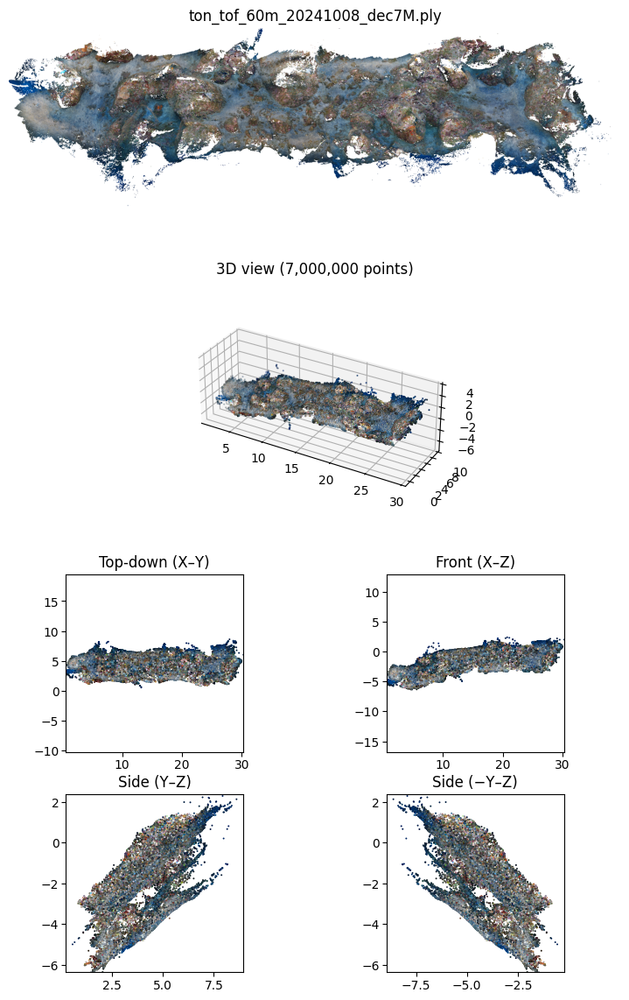

In [3]:
pcd = PointCloud('/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008_dec7M.ply')
cams = Cameras('/Users/pbongaerts/Downloads/ton_tof_60m_20241008.meta.json',
               '/Users/pbongaerts/Downloads/ton_tof_60m_20241008.cams.xml')
world_transform = Transform([
    [-3.75205861e-04, -2.11005752e-01, 3.98466962e-02, 1.62435295e+01],
    [1.75381757e-01, -2.32932058e-02, -1.21696317e-01, 4.42951957e+00],
    [1.23904908e-01, 3.23315100e-02, 1.72376260e-01, 0.00000000e+00],
    [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
])
pcd.apply_transform(world_transform)
cams.apply_transform(world_transform)
cams.set_filepath_replace('/home/coral3d/focal_plots/ton_tof/ton_tof_60m', '/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m')
pcd.plot_views()
#anns = Annotations('/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008_DA_PH_ann.csv', header=False)
anns = Annotations('/Users/pbongaerts/Downloads/ton_tof_60m_20241008_markers.csv', header=True)
anns.transform_coords(world_transform)

In [17]:
visualizations.show_coords_as_lines(pcd, anns.coords)

INFO:substrata.pointclouds:Building kdtree for /Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008_dec7M.ply...


[27.20980725  1.49969205 -2.37480621]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04551.JPG
Image match for camera 603 at 5584, 2419
Depth: 3.215354352722944, Relevance: 0.001106531946496138
Obstructed: False
Reprojection error: 0.005758866814423166
Reprojection coords: [27.20718282  1.50360607 -2.37149601]


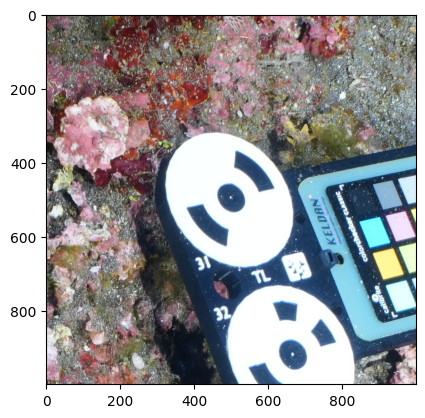

[27.15445936  1.49405115 -2.41910129]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04551.JPG
Image match for camera 603 at 5751, 2842
Depth: 3.163302161308234, Relevance: 0.0008979746027370783
Obstructed: False
Reprojection error: 0.0036574300853537724
Reprojection coords: [27.15645617  1.49684472 -2.41784212]


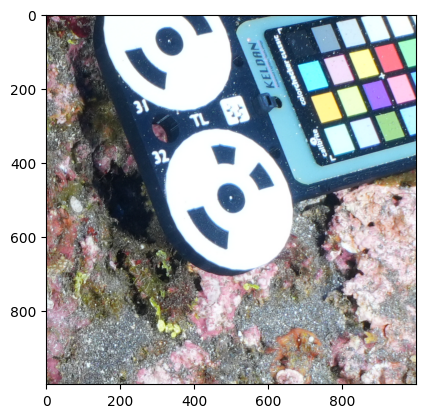

[27.33368844  1.42251619 -2.51777877]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04551.JPG
Image match for camera 603 at 6477, 2237
Depth: 3.6178982211259374, Relevance: 0.0025224884166654936
Obstructed: False
Reprojection error: 0.004780507317171252
Reprojection coords: [27.32892541  1.42219145 -2.51753104]


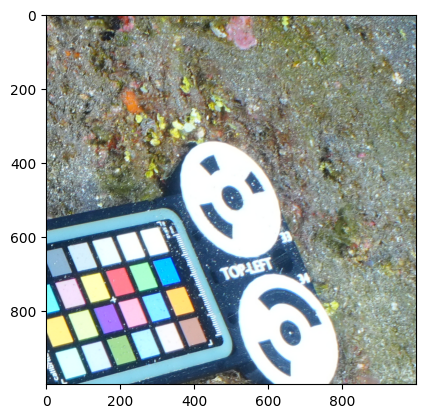

[27.27635184  1.41592774 -2.56051483]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04551.JPG
Image match for camera 603 at 6635, 2602
Depth: 3.5542277192560583, Relevance: 0.002256010466974194
Obstructed: False
Reprojection error: 0.0013822445785472137
Reprojection coords: [27.27708989  1.41478071 -2.56073886]


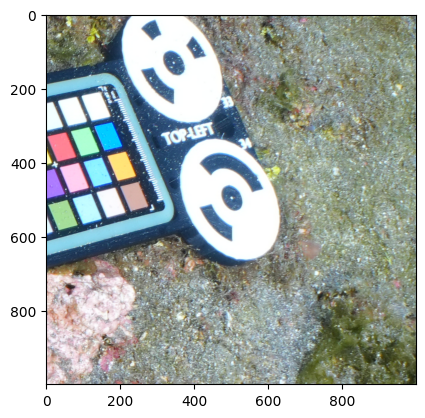

[28.4581407   4.34878438  0.33965826]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04276.JPG
Image match for camera 328 at 5603, 3548
Depth: 3.3948976134638826, Relevance: 0.0009404187560583355
Obstructed: False
Reprojection error: 0.009672358110182114
Reprojection coords: [28.45563433  4.34359239  0.34742459]


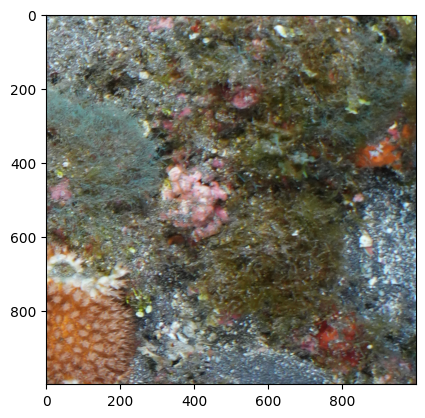

In [4]:
for ann in anns.subset(5):
    print(ann.coords)
    match = ann.get_first_image_match(cams, pcd)
    if match is not None:
        print(match.filepath)
        match.show()
    else:
        print("No match found: ", ann.coords)

Optimal box contains 5421469 out of 7000000 points
Box coordinates:  [[3.5436386284769106, 2.0811544923900396], [28.54363862847691, 6.08115449239004]]


<module 'matplotlib.pyplot' from '/Users/pbongaerts/miniconda3/envs/unicorn_sam/lib/python3.10/site-packages/matplotlib/pyplot.py'>

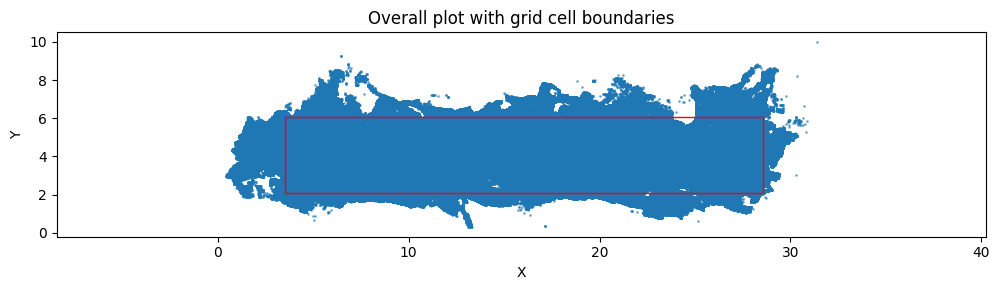

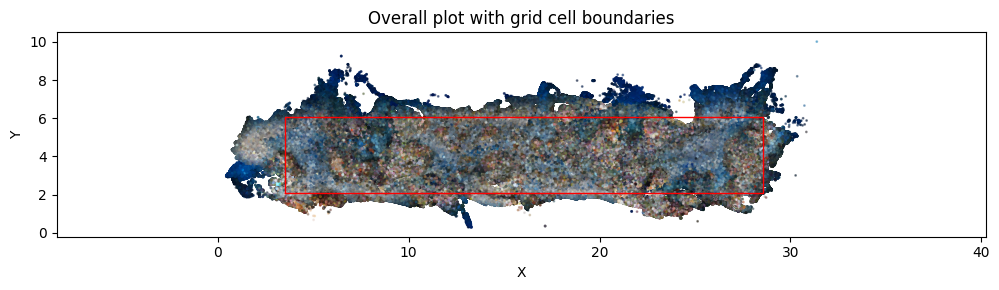

In [3]:
optimal_bbox = measurements.find_optimal_box_position(pcd, box_length=25, box_width=4, step_size=0.1, vis=True)
visualizations.show_grid_cells(pcd, optimal_bbox, show_colors = True)

<module 'matplotlib.pyplot' from '/Users/pbongaerts/miniconda3/envs/unicorn_sam/lib/python3.10/site-packages/matplotlib/pyplot.py'>

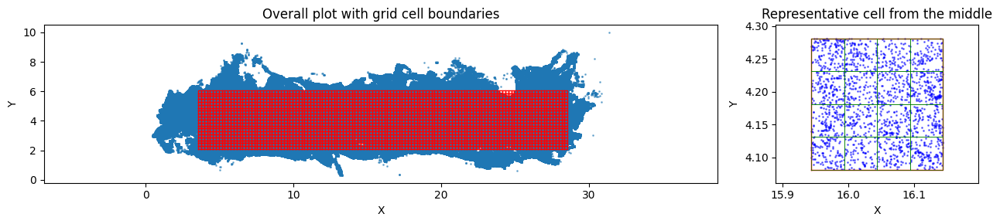

In [16]:
bboxes = measurements.subdivide_boxes(optimal_bbox, 0.2)
visualizations.show_grid_cells(pcd, bboxes)

In [17]:
random_points = measurements.generate_random_xy_points_within_cells(bboxes, 1, 0)
intercepts = pcd.get_z_intercepts(random_points, 0.005, always_return=True, store_neighboring_coords=True)
intercepts.get_original_coords(pcd.world_transform)
intercepts.save('/Users/pbongaerts/Downloads/random_test.csv')

100%|██████████| 2500/2500 [00:00<00:00, 38119.64it/s]

Intercept points found: 2500/2500
Extrapolated points with no match: 357


In [6]:
from substrata.classification import get_image_classifier, classify_image_match
learn = get_image_classifier("/Users/pbongaerts/Downloads/reef_classifier.pkl")  # loads once

/Users/pbongaerts/miniconda3/envs/unicorn_sam/lib/python3.10/site-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


[ 4.27226628  2.58559085 -5.47097992]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04449.JPG


Image match for camera 501 at 3527, 3715
Depth: 2.8551001952564796, Relevance: 0.0010342124270708189
Obstructed: False
Reprojection error: 0.0
Reprojection coords: [ 4.27226628  2.58559085 -5.47097992]
Classification: SUSC
Classification confidence: 0.660
Top probabilities: SUSC: 0.660, MAF_T: 0.197, SU_U: 0.087, CSF: 0.020, CRY: 0.019


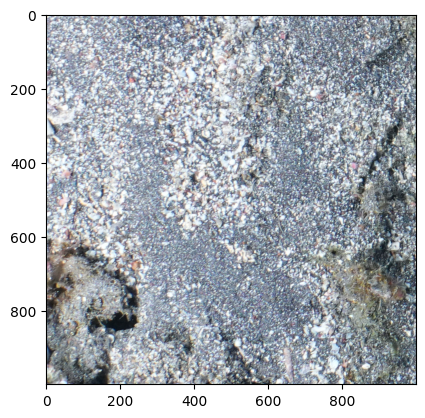

[ 4.51779903  3.67752856 -4.75741855]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC03948.JPG


Image match for camera 0 at 4158, 3109
Depth: 6.879220110935616, Relevance: 0.0017967025892506115
Obstructed: False
Reprojection error: 0.0
Reprojection coords: [ 4.51779903  3.67752856 -4.75741855]
Classification: SUSC
Classification confidence: 0.869
Top probabilities: SUSC: 0.869, CSF: 0.081, MAF_T: 0.045, CSSU: 0.001, CSE: 0.001


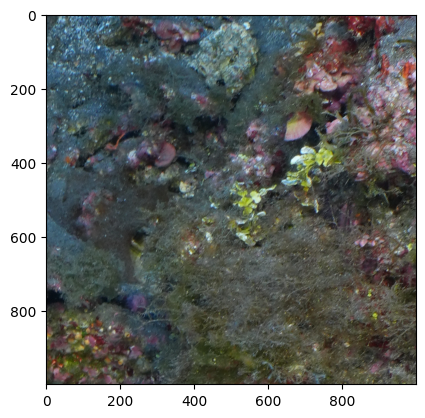

[ 3.89540583  5.06853945 -3.68872241]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04172.JPG


Image match for camera 224 at 5132, 2791
Depth: 5.114959081725985, Relevance: 0.0011901681498061342
Obstructed: False
Reprojection error: 0.0
Reprojection coords: [ 3.89540583  5.06853945 -3.68872241]
Classification: SUSC
Classification confidence: 0.965
Top probabilities: SUSC: 0.965, CSF: 0.017, UNC: 0.006, NA: 0.004, NOC: 0.003


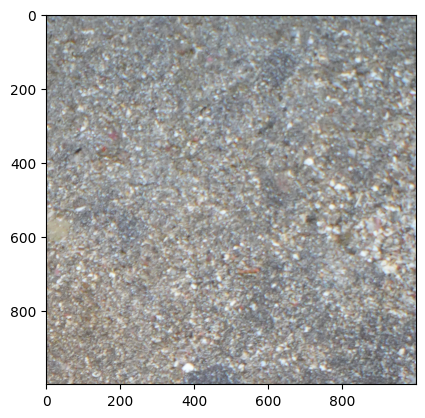

[ 3.79471673  5.42378224 -3.38995963]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04173.JPG


Image match for camera 225 at 3665, 3639
Depth: 5.010882196698134, Relevance: 0.002470232220609592
Obstructed: False
Reprojection error: 0.0
Reprojection coords: [ 3.79471673  5.42378224 -3.38995963]
Classification: SUSC
Classification confidence: 0.998
Top probabilities: SUSC: 0.998, NA: 0.000, CSF: 0.000, MAF_T: 0.000, UNC: 0.000


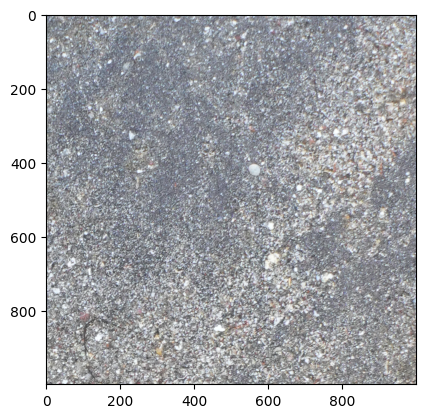

[ 5.19930325  2.2500222  -5.84216341]
/Users/pbongaerts/Github/unicorn/examples/ton_tof/ton_tof_60m/ton_tof_60m_20241008/ton_tof_60m_20241008.photos/DSC04648.JPG


Image match for camera 700 at 3045, 3743
Depth: 4.69864511285915, Relevance: 0.0034583157490050355
Obstructed: False
Reprojection error: 0.0014421692366025781
Reprojection coords: [ 5.19874382  2.25040688 -5.84089104]
Classification: SUSC
Classification confidence: 0.520
Top probabilities: SUSC: 0.520, NOC: 0.437, CSF: 0.016, NA: 0.006, UNC: 0.006


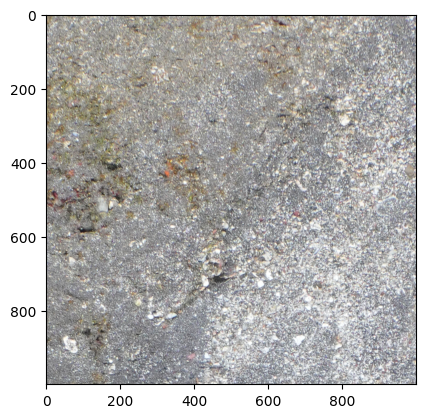

In [10]:
for ann in intercepts.subset(5):
    print(ann.coords)
    match = ann.get_first_image_match(cams, pcd)
    if match is not None:
        print(match.filepath)
        classification = classify_image_match(match, classifier=learn)
        match.show()
    else:
        print("No match found: ", ann.coords)

In [18]:
intercepts.get_first_image_matches(cams, pcd)
classes = intercepts.classify_image_matches(learn, print_summary=True)

Getting first image matches:   0%|          | 0/2500 [00:00<?, ?it/s]

Getting first image matches:   0%|          | 3/2500 [00:00<03:27, 12.05it/s]

Getting first image matches:   0%|          | 5/2500 [00:00<03:44, 11.11it/s]

Getting first image matches:   0%|          | 8/2500 [00:00<02:46, 14.99it/s]

Getting first image matches:   1%|          | 18/2500 [00:01<03:47, 10.89it/s]

Getting first image matches:   1%|          | 22/2500 [00:01<03:58, 10.40it/s]

Getting first image matches:   1%|          | 26/2500 [00:02<03:14, 12.74it/s]

Getting first image matches:   2%|▏         | 38/2500 [00:03<04:14,  9.67it/s]

Getting first image matches:   2%|▏         | 42/2500 [00:03<04:22,  9.38it/s]

Getting first image matches:   2%|▏         | 46/2500 [00:03<03:17, 12.46it/s]

Getting first image matches:   2%|▏         | 58/2500 [00:04<04:17,  9.49it/s]

Getting first image matches:   2%|▏         | 62/2500 [00:05<04:13,  9.62it/s]

Getting first image matches:   3%|▎         | 67/2500 [00:05<02:52, 14.07it/s]

Getting first image matches:   3%|▎         | 82/2500 [00:07<04:16,  9.42it/s]

Getting first image matches:   4%|▍         | 102/2500 [00:09<04:48,  8.30it/s]

Getting first image matches:   5%|▍         | 122/2500 [00:11<04:44,  8.37it/s]

Getting first image matches:   6%|▌         | 144/2500 [00:13<03:51, 10.17it/s]

Getting first image matches:   7%|▋         | 182/2500 [00:18<05:08,  7.52it/s]

Getting first image matches:   8%|▊         | 203/2500 [00:20<04:40,  8.18it/s]

Getting first image matches:   9%|▉         | 222/2500 [00:22<04:20,  8.74it/s]

Getting first image matches:   9%|▉         | 225/2500 [00:23<03:44, 10.13it/s]

Getting first image matches:  10%|▉         | 242/2500 [00:24<03:58,  9.48it/s]

Getting first image matches:  10%|▉         | 246/2500 [00:25<03:22, 11.15it/s]

Getting first image matches:  10%|█         | 250/2500 [00:25<02:54, 12.91it/s]

Getting first image matches:  10%|█         | 262/2500 [00:26<03:54,  9.54it/s]

Getting first image matches:  11%|█         | 268/2500 [00:26<02:36, 14.29it/s]

Getting first image matches:  11%|█         | 278/2500 [00:27<03:10, 11.69it/s]

Getting first image matches:  11%|█         | 280/2500 [00:28<03:07, 11.82it/s]

Getting first image matches:  11%|█▏        | 287/2500 [00:28<02:38, 13.99it/s]

Getting first image matches:  12%|█▏        | 289/2500 [00:28<02:32, 14.52it/s]

Getting first image matches:  12%|█▏        | 299/2500 [00:29<03:18, 11.11it/s]

Getting first image matches:  12%|█▏        | 303/2500 [00:30<03:33, 10.30it/s]

Getting first image matches:  12%|█▏        | 305/2500 [00:30<03:11, 11.47it/s]

Getting first image matches:  12%|█▏        | 310/2500 [00:30<02:44, 13.28it/s]

Getting first image matches:  13%|█▎        | 317/2500 [00:31<03:01, 12.02it/s]

Getting first image matches:  13%|█▎        | 321/2500 [00:31<03:40,  9.86it/s]

Getting first image matches:  13%|█▎        | 325/2500 [00:32<03:18, 10.98it/s]

Getting first image matches:  13%|█▎        | 329/2500 [00:32<02:54, 12.45it/s]

Getting first image matches:  14%|█▎        | 340/2500 [00:33<02:34, 14.01it/s]

Getting first image matches:  14%|█▍        | 344/2500 [00:33<02:59, 12.01it/s]

Getting first image matches:  14%|█▍        | 346/2500 [00:33<02:40, 13.39it/s]

Getting first image matches:  14%|█▍        | 350/2500 [00:34<03:10, 11.26it/s]

Getting first image matches:  14%|█▍        | 355/2500 [00:34<03:14, 11.02it/s]

Getting first image matches:  15%|█▍        | 364/2500 [00:35<02:38, 13.50it/s]

Getting first image matches:  15%|█▍        | 368/2500 [00:35<02:55, 12.12it/s]

Getting first image matches:  15%|█▍        | 370/2500 [00:35<03:17, 10.78it/s]

Getting first image matches:  15%|█▌        | 384/2500 [00:37<02:55, 12.09it/s]

Getting first image matches:  15%|█▌        | 386/2500 [00:37<02:40, 13.15it/s]

Getting first image matches:  16%|█▌        | 388/2500 [00:37<02:42, 12.98it/s]

Getting first image matches:  16%|█▌        | 402/2500 [00:38<02:56, 11.91it/s]

Getting first image matches:  16%|█▌        | 404/2500 [00:39<02:51, 12.24it/s]

Getting first image matches:  16%|█▋        | 408/2500 [00:39<03:04, 11.32it/s]

Getting first image matches:  16%|█▋        | 410/2500 [00:39<03:27, 10.08it/s]

Getting first image matches:  17%|█▋        | 422/2500 [00:40<03:15, 10.64it/s]

Getting first image matches:  17%|█▋        | 424/2500 [00:41<03:31,  9.81it/s]

Getting first image matches:  17%|█▋        | 426/2500 [00:41<03:21, 10.29it/s]

Getting first image matches:  17%|█▋        | 430/2500 [00:41<03:45,  9.17it/s]

Getting first image matches:  18%|█▊        | 441/2500 [00:42<03:11, 10.76it/s]

Getting first image matches:  18%|█▊        | 443/2500 [00:43<03:21, 10.21it/s]

Getting first image matches:  18%|█▊        | 447/2500 [00:43<03:00, 11.40it/s]

Getting first image matches:  18%|█▊        | 449/2500 [00:43<03:20, 10.25it/s]

Getting first image matches:  18%|█▊        | 451/2500 [00:43<03:25,  9.97it/s]

Getting first image matches:  18%|█▊        | 457/2500 [00:44<03:45,  9.06it/s]

Getting first image matches:  18%|█▊        | 462/2500 [00:45<03:11, 10.63it/s]

Getting first image matches:  19%|█▊        | 465/2500 [00:45<03:37,  9.37it/s]

Getting first image matches:  19%|█▊        | 467/2500 [00:45<03:16, 10.37it/s]

Getting first image matches:  19%|█▉        | 469/2500 [00:45<03:36,  9.37it/s]

Getting first image matches:  19%|█▉        | 478/2500 [00:47<03:56,  8.54it/s]

Getting first image matches:  19%|█▉        | 480/2500 [00:47<03:34,  9.41it/s]

Getting first image matches:  19%|█▉        | 483/2500 [00:47<04:01,  8.36it/s]

Getting first image matches:  19%|█▉        | 485/2500 [00:47<03:42,  9.06it/s]

Getting first image matches:  19%|█▉        | 487/2500 [00:48<03:22,  9.93it/s]

Getting first image matches:  20%|█▉        | 489/2500 [00:48<03:20, 10.01it/s]

Getting first image matches:  20%|█▉        | 496/2500 [00:49<04:16,  7.82it/s]

Getting first image matches:  20%|██        | 501/2500 [00:49<03:14, 10.30it/s]

Getting first image matches:  20%|██        | 505/2500 [00:50<03:18, 10.06it/s]

Getting first image matches:  20%|██        | 507/2500 [00:50<03:05, 10.73it/s]

Getting first image matches:  20%|██        | 509/2500 [00:50<03:15, 10.17it/s]

Getting first image matches:  21%|██        | 516/2500 [00:51<04:29,  7.36it/s]

Getting first image matches:  21%|██        | 522/2500 [00:52<03:17,  9.99it/s]

Getting first image matches:  21%|██        | 523/2500 [00:52<03:22,  9.78it/s]

Getting first image matches:  21%|██        | 526/2500 [00:52<03:40,  8.93it/s]

Getting first image matches:  21%|██        | 528/2500 [00:52<03:14, 10.13it/s]

Getting first image matches:  21%|██        | 530/2500 [00:52<03:31,  9.33it/s]

Getting first image matches:  21%|██▏       | 537/2500 [00:53<04:10,  7.85it/s]

Getting first image matches:  22%|██▏       | 542/2500 [00:54<03:04, 10.59it/s]

Getting first image matches:  22%|██▏       | 544/2500 [00:54<03:10, 10.25it/s]

Getting first image matches:  22%|██▏       | 549/2500 [00:54<02:22, 13.66it/s]

Getting first image matches:  22%|██▏       | 553/2500 [00:55<02:36, 12.43it/s]

Getting first image matches:  22%|██▏       | 561/2500 [00:56<03:09, 10.26it/s]

Getting first image matches:  23%|██▎       | 563/2500 [00:56<03:03, 10.57it/s]

Getting first image matches:  23%|██▎       | 568/2500 [00:56<02:30, 12.86it/s]

Getting first image matches:  23%|██▎       | 575/2500 [00:57<02:26, 13.13it/s]

Getting first image matches:  23%|██▎       | 581/2500 [00:57<02:32, 12.58it/s]

Getting first image matches:  23%|██▎       | 585/2500 [00:57<02:41, 11.87it/s]

Getting first image matches:  24%|██▎       | 590/2500 [00:58<02:03, 15.44it/s]

Getting first image matches:  24%|██▍       | 594/2500 [00:58<02:15, 14.02it/s]

Getting first image matches:  24%|██▍       | 601/2500 [00:58<02:09, 14.62it/s]

Getting first image matches:  24%|██▍       | 605/2500 [00:59<02:27, 12.81it/s]

Getting first image matches:  24%|██▍       | 610/2500 [00:59<01:57, 16.11it/s]

Getting first image matches:  25%|██▍       | 614/2500 [00:59<02:11, 14.34it/s]

Getting first image matches:  25%|██▍       | 622/2500 [01:00<02:20, 13.38it/s]

Getting first image matches:  25%|██▍       | 624/2500 [01:00<02:36, 12.00it/s]

Getting first image matches:  25%|██▌       | 629/2500 [01:00<02:05, 14.89it/s]

Getting first image matches:  25%|██▌       | 633/2500 [01:01<02:10, 14.29it/s]

Getting first image matches:  26%|██▌       | 641/2500 [01:01<02:09, 14.37it/s]

Getting first image matches:  26%|██▌       | 645/2500 [01:02<02:33, 12.12it/s]

Getting first image matches:  26%|██▌       | 649/2500 [01:02<02:16, 13.56it/s]

Getting first image matches:  26%|██▌       | 653/2500 [01:02<02:18, 13.34it/s]

Getting first image matches:  26%|██▋       | 661/2500 [01:03<02:16, 13.50it/s]

Getting first image matches:  27%|██▋       | 663/2500 [01:03<02:44, 11.19it/s]

Getting first image matches:  27%|██▋       | 665/2500 [01:03<02:39, 11.49it/s]

Getting first image matches:  27%|██▋       | 669/2500 [01:04<02:37, 11.62it/s]

Getting first image matches:  27%|██▋       | 673/2500 [01:04<02:36, 11.66it/s]

Getting first image matches:  27%|██▋       | 681/2500 [01:04<02:21, 12.88it/s]

Getting first image matches:  27%|██▋       | 683/2500 [01:05<02:31, 12.03it/s]

Getting first image matches:  27%|██▋       | 687/2500 [01:05<02:28, 12.25it/s]

Getting first image matches:  28%|██▊       | 689/2500 [01:05<02:25, 12.47it/s]

Getting first image matches:  28%|██▊       | 691/2500 [01:05<02:26, 12.32it/s]

Getting first image matches:  28%|██▊       | 695/2500 [01:06<02:52, 10.44it/s]

Getting first image matches:  28%|██▊       | 701/2500 [01:06<02:24, 12.43it/s]

Getting first image matches:  28%|██▊       | 705/2500 [01:07<02:43, 11.00it/s]

Getting first image matches:  28%|██▊       | 707/2500 [01:07<02:35, 11.53it/s]

Getting first image matches:  28%|██▊       | 711/2500 [01:07<02:50, 10.46it/s]

Getting first image matches:  29%|██▊       | 713/2500 [01:07<03:17,  9.03it/s]

Getting first image matches:  29%|██▉       | 722/2500 [01:08<02:26, 12.13it/s]

Getting first image matches:  29%|██▉       | 724/2500 [01:08<02:30, 11.78it/s]

Getting first image matches:  29%|██▉       | 726/2500 [01:09<02:34, 11.51it/s]

Getting first image matches:  29%|██▉       | 728/2500 [01:09<02:24, 12.27it/s]

Getting first image matches:  29%|██▉       | 730/2500 [01:09<02:46, 10.64it/s]

Getting first image matches:  29%|██▉       | 732/2500 [01:09<02:57,  9.93it/s]

Getting first image matches:  30%|██▉       | 739/2500 [01:10<02:43, 10.78it/s]

Getting first image matches:  30%|██▉       | 741/2500 [01:10<02:50, 10.31it/s]

Getting first image matches:  30%|██▉       | 745/2500 [01:10<02:54, 10.05it/s]

Getting first image matches:  30%|██▉       | 748/2500 [01:11<03:07,  9.37it/s]

Getting first image matches:  30%|███       | 750/2500 [01:11<03:23,  8.59it/s]

Getting first image matches:  30%|███       | 752/2500 [01:11<03:27,  8.41it/s]

Getting first image matches:  30%|███       | 754/2500 [01:12<03:29,  8.33it/s]

Getting first image matches:  30%|███       | 762/2500 [01:12<02:40, 10.85it/s]

Getting first image matches:  31%|███       | 764/2500 [01:12<02:38, 10.98it/s]

Getting first image matches:  31%|███       | 766/2500 [01:13<02:56,  9.81it/s]

Getting first image matches:  31%|███       | 768/2500 [01:13<03:25,  8.44it/s]

Getting first image matches:  31%|███       | 769/2500 [01:13<03:33,  8.10it/s]

Getting first image matches:  31%|███       | 771/2500 [01:13<03:42,  7.76it/s]

Getting first image matches:  31%|███       | 773/2500 [01:14<03:34,  8.04it/s]

Getting first image matches:  31%|███▏      | 782/2500 [01:14<02:32, 11.29it/s]

Getting first image matches:  31%|███▏      | 784/2500 [01:15<02:29, 11.45it/s]

Getting first image matches:  31%|███▏      | 786/2500 [01:15<02:46, 10.31it/s]

Getting first image matches:  32%|███▏      | 788/2500 [01:15<03:21,  8.50it/s]

Getting first image matches:  32%|███▏      | 790/2500 [01:15<03:42,  7.70it/s]

Getting first image matches:  32%|███▏      | 792/2500 [01:16<03:43,  7.65it/s]

Getting first image matches:  32%|███▏      | 795/2500 [01:16<02:54,  9.76it/s]

Getting first image matches:  32%|███▏      | 801/2500 [01:16<02:27, 11.50it/s]

Getting first image matches:  32%|███▏      | 805/2500 [01:17<02:42, 10.41it/s]

Getting first image matches:  32%|███▏      | 808/2500 [01:17<03:19,  8.50it/s]

Getting first image matches:  32%|███▏      | 809/2500 [01:17<03:33,  7.92it/s]

Getting first image matches:  32%|███▏      | 811/2500 [01:18<03:56,  7.15it/s]

Getting first image matches:  33%|███▎      | 813/2500 [01:18<03:30,  8.00it/s]

Getting first image matches:  33%|███▎      | 821/2500 [01:19<02:53,  9.69it/s]

Getting first image matches:  33%|███▎      | 824/2500 [01:19<03:02,  9.20it/s]

Getting first image matches:  33%|███▎      | 825/2500 [01:19<03:08,  8.87it/s]

Getting first image matches:  33%|███▎      | 827/2500 [01:19<03:31,  7.91it/s]

Getting first image matches:  33%|███▎      | 829/2500 [01:20<03:58,  7.02it/s]

Getting first image matches:  33%|███▎      | 830/2500 [01:20<04:05,  6.79it/s]

Getting first image matches:  33%|███▎      | 831/2500 [01:20<04:35,  6.05it/s]

Getting first image matches:  33%|███▎      | 834/2500 [01:21<03:48,  7.29it/s]

Getting first image matches:  34%|███▎      | 842/2500 [01:21<02:28, 11.13it/s]

Getting first image matches:  34%|███▍      | 844/2500 [01:21<02:45, 10.02it/s]

Getting first image matches:  34%|███▍      | 847/2500 [01:22<03:28,  7.93it/s]

Getting first image matches:  34%|███▍      | 848/2500 [01:22<03:39,  7.54it/s]

Getting first image matches:  34%|███▍      | 850/2500 [01:22<03:54,  7.04it/s]

Getting first image matches:  34%|███▍      | 852/2500 [01:23<03:47,  7.24it/s]

Getting first image matches:  34%|███▍      | 854/2500 [01:23<03:11,  8.61it/s]

Getting first image matches:  34%|███▍      | 862/2500 [01:23<02:16, 11.99it/s]

Getting first image matches:  35%|███▍      | 864/2500 [01:24<02:27, 11.08it/s]

Getting first image matches:  35%|███▍      | 866/2500 [01:24<02:46,  9.79it/s]

Getting first image matches:  35%|███▍      | 868/2500 [01:24<03:01,  9.02it/s]

Getting first image matches:  35%|███▍      | 870/2500 [01:24<03:22,  8.04it/s]

Getting first image matches:  35%|███▍      | 872/2500 [01:25<03:11,  8.52it/s]

Getting first image matches:  35%|███▍      | 873/2500 [01:25<03:06,  8.74it/s]

Getting first image matches:  35%|███▌      | 881/2500 [01:26<02:36, 10.35it/s]

Getting first image matches:  35%|███▌      | 883/2500 [01:26<02:24, 11.18it/s]

Getting first image matches:  35%|███▌      | 887/2500 [01:26<02:55,  9.21it/s]

Getting first image matches:  36%|███▌      | 888/2500 [01:26<02:58,  9.01it/s]

Getting first image matches:  36%|███▌      | 890/2500 [01:27<03:30,  7.64it/s]

Getting first image matches:  36%|███▌      | 891/2500 [01:27<03:19,  8.06it/s]

Getting first image matches:  36%|███▌      | 894/2500 [01:27<03:02,  8.78it/s]

Getting first image matches:  36%|███▌      | 902/2500 [01:28<02:03, 12.99it/s]

Getting first image matches:  36%|███▌      | 906/2500 [01:28<02:59,  8.86it/s]

Getting first image matches:  36%|███▋      | 908/2500 [01:28<03:02,  8.71it/s]

Getting first image matches:  36%|███▋      | 909/2500 [01:29<03:11,  8.33it/s]

Getting first image matches:  36%|███▋      | 911/2500 [01:29<03:31,  7.52it/s]

Getting first image matches:  37%|███▋      | 913/2500 [01:29<03:16,  8.06it/s]

Getting first image matches:  37%|███▋      | 917/2500 [01:29<02:26, 10.83it/s]

Getting first image matches:  37%|███▋      | 920/2500 [01:29<01:55, 13.73it/s]

Getting first image matches:  37%|███▋      | 922/2500 [01:30<02:24, 10.96it/s]

Getting first image matches:  37%|███▋      | 926/2500 [01:30<02:37,  9.99it/s]

Getting first image matches:  37%|███▋      | 928/2500 [01:30<02:46,  9.47it/s]

Getting first image matches:  37%|███▋      | 930/2500 [01:31<02:58,  8.80it/s]

Getting first image matches:  37%|███▋      | 932/2500 [01:31<02:57,  8.81it/s]

Getting first image matches:  37%|███▋      | 934/2500 [01:31<02:50,  9.18it/s]

Getting first image matches:  38%|███▊      | 941/2500 [01:32<01:50, 14.10it/s]

Getting first image matches:  38%|███▊      | 943/2500 [01:32<02:17, 11.35it/s]

Getting first image matches:  38%|███▊      | 945/2500 [01:32<02:35, 10.01it/s]

Getting first image matches:  38%|███▊      | 947/2500 [01:32<02:33, 10.10it/s]

Getting first image matches:  38%|███▊      | 950/2500 [01:33<02:54,  8.89it/s]

Getting first image matches:  38%|███▊      | 952/2500 [01:33<02:57,  8.71it/s]

Getting first image matches:  38%|███▊      | 955/2500 [01:33<02:30, 10.28it/s]

Getting first image matches:  38%|███▊      | 961/2500 [01:34<01:50, 13.98it/s]

Getting first image matches:  39%|███▊      | 963/2500 [01:34<02:08, 11.92it/s]

Getting first image matches:  39%|███▊      | 965/2500 [01:34<02:17, 11.14it/s]

Getting first image matches:  39%|███▊      | 967/2500 [01:34<02:34,  9.90it/s]

Getting first image matches:  39%|███▉      | 969/2500 [01:34<02:45,  9.27it/s]

Getting first image matches:  39%|███▉      | 971/2500 [01:35<02:58,  8.57it/s]

Getting first image matches:  39%|███▉      | 973/2500 [01:35<02:53,  8.80it/s]

Getting first image matches:  39%|███▉      | 975/2500 [01:35<02:49,  9.01it/s]

Getting first image matches:  39%|███▉      | 982/2500 [01:36<01:49, 13.81it/s]

Getting first image matches:  39%|███▉      | 984/2500 [01:36<01:56, 12.99it/s]

Getting first image matches:  39%|███▉      | 986/2500 [01:36<02:17, 11.01it/s]

Getting first image matches:  40%|███▉      | 988/2500 [01:36<02:35,  9.74it/s]

Getting first image matches:  40%|███▉      | 990/2500 [01:37<02:51,  8.79it/s]

Getting first image matches:  40%|███▉      | 992/2500 [01:37<02:57,  8.48it/s]

Getting first image matches:  40%|███▉      | 994/2500 [01:37<02:46,  9.06it/s]

Getting first image matches:  40%|███▉      | 997/2500 [01:37<02:35,  9.64it/s]

Getting first image matches:  40%|████      | 1000/2500 [01:37<01:54, 13.09it/s]

Getting first image matches:  40%|████      | 1004/2500 [01:38<02:20, 10.61it/s]

Getting first image matches:  40%|████      | 1006/2500 [01:38<02:21, 10.53it/s]

Getting first image matches:  40%|████      | 1008/2500 [01:38<02:32,  9.80it/s]

Getting first image matches:  40%|████      | 1011/2500 [01:39<02:52,  8.62it/s]

Getting first image matches:  41%|████      | 1013/2500 [01:39<03:23,  7.30it/s]

Getting first image matches:  41%|████      | 1015/2500 [01:39<02:58,  8.30it/s]

Getting first image matches:  41%|████      | 1017/2500 [01:39<02:55,  8.43it/s]

Getting first image matches:  41%|████      | 1021/2500 [01:40<02:16, 10.81it/s]

Getting first image matches:  41%|████      | 1023/2500 [01:40<02:18, 10.69it/s]

Getting first image matches:  41%|████      | 1025/2500 [01:40<02:13, 11.02it/s]

Getting first image matches:  41%|████      | 1027/2500 [01:40<02:25, 10.14it/s]

Getting first image matches:  41%|████      | 1030/2500 [01:41<02:51,  8.55it/s]

Getting first image matches:  41%|████▏     | 1032/2500 [01:41<03:07,  7.84it/s]

Getting first image matches:  41%|████▏     | 1035/2500 [01:42<03:01,  8.07it/s]

Getting first image matches:  42%|████▏     | 1039/2500 [01:42<02:08, 11.37it/s]

Getting first image matches:  42%|████▏     | 1041/2500 [01:42<02:01, 11.99it/s]

Getting first image matches:  42%|████▏     | 1043/2500 [01:42<02:11, 11.08it/s]

Getting first image matches:  42%|████▏     | 1045/2500 [01:42<02:26,  9.94it/s]

Getting first image matches:  42%|████▏     | 1047/2500 [01:43<02:27,  9.82it/s]

Getting first image matches:  42%|████▏     | 1049/2500 [01:43<02:30,  9.63it/s]

Getting first image matches:  42%|████▏     | 1052/2500 [01:43<02:45,  8.78it/s]

Getting first image matches:  42%|████▏     | 1056/2500 [01:43<02:05, 11.47it/s]

Getting first image matches:  42%|████▏     | 1060/2500 [01:44<01:47, 13.39it/s]

Getting first image matches:  42%|████▏     | 1062/2500 [01:44<02:08, 11.20it/s]

Getting first image matches:  43%|████▎     | 1064/2500 [01:44<02:23, 10.02it/s]

Getting first image matches:  43%|████▎     | 1068/2500 [01:45<02:30,  9.52it/s]

Getting first image matches:  43%|████▎     | 1070/2500 [01:45<02:31,  9.45it/s]

Getting first image matches:  43%|████▎     | 1072/2500 [01:45<02:39,  8.96it/s]

Getting first image matches:  43%|████▎     | 1074/2500 [01:45<02:21, 10.06it/s]

Getting first image matches:  43%|████▎     | 1078/2500 [01:46<02:04, 11.40it/s]

Getting first image matches:  43%|████▎     | 1080/2500 [01:46<02:00, 11.79it/s]

Getting first image matches:  43%|████▎     | 1082/2500 [01:46<02:25,  9.77it/s]

Getting first image matches:  43%|████▎     | 1086/2500 [01:46<02:14, 10.51it/s]

Getting first image matches:  44%|████▎     | 1088/2500 [01:47<02:11, 10.76it/s]

Getting first image matches:  44%|████▎     | 1090/2500 [01:47<02:15, 10.39it/s]

Getting first image matches:  44%|████▍     | 1094/2500 [01:47<02:14, 10.47it/s]

Getting first image matches:  44%|████▍     | 1096/2500 [01:47<02:01, 11.55it/s]

Getting first image matches:  44%|████▍     | 1100/2500 [01:48<01:55, 12.12it/s]

Getting first image matches:  44%|████▍     | 1102/2500 [01:48<02:38,  8.80it/s]

Getting first image matches:  44%|████▍     | 1104/2500 [01:48<02:47,  8.32it/s]

Getting first image matches:  44%|████▍     | 1106/2500 [01:48<02:39,  8.74it/s]

Getting first image matches:  44%|████▍     | 1108/2500 [01:49<02:33,  9.07it/s]

Getting first image matches:  44%|████▍     | 1110/2500 [01:49<02:33,  9.03it/s]

Getting first image matches:  44%|████▍     | 1112/2500 [01:49<02:35,  8.94it/s]

Getting first image matches:  45%|████▍     | 1114/2500 [01:49<02:44,  8.41it/s]

Getting first image matches:  45%|████▍     | 1116/2500 [01:50<02:30,  9.19it/s]

Getting first image matches:  45%|████▍     | 1120/2500 [01:50<02:03, 11.15it/s]

Getting first image matches:  45%|████▍     | 1122/2500 [01:50<02:10, 10.58it/s]

Getting first image matches:  45%|████▍     | 1124/2500 [01:50<02:10, 10.51it/s]

Getting first image matches:  45%|████▌     | 1128/2500 [01:51<02:21,  9.68it/s]

Getting first image matches:  45%|████▌     | 1130/2500 [01:51<02:22,  9.61it/s]

Getting first image matches:  45%|████▌     | 1132/2500 [01:51<02:35,  8.78it/s]

Getting first image matches:  45%|████▌     | 1134/2500 [01:51<02:58,  7.67it/s]

Getting first image matches:  45%|████▌     | 1136/2500 [01:52<02:45,  8.25it/s]

Getting first image matches:  46%|████▌     | 1140/2500 [01:52<02:17,  9.87it/s]

Getting first image matches:  46%|████▌     | 1142/2500 [01:52<02:21,  9.57it/s]

Getting first image matches:  46%|████▌     | 1144/2500 [01:52<02:10, 10.37it/s]

Getting first image matches:  46%|████▌     | 1146/2500 [01:53<02:19,  9.71it/s]

Getting first image matches:  46%|████▌     | 1149/2500 [01:53<02:20,  9.64it/s]

Getting first image matches:  46%|████▌     | 1151/2500 [01:53<02:24,  9.31it/s]

Getting first image matches:  46%|████▌     | 1153/2500 [01:53<02:31,  8.92it/s]

Getting first image matches:  46%|████▌     | 1155/2500 [01:54<02:42,  8.27it/s]

Getting first image matches:  46%|████▌     | 1156/2500 [01:54<02:39,  8.44it/s]

Getting first image matches:  46%|████▋     | 1159/2500 [01:54<02:28,  9.04it/s]

Getting first image matches:  46%|████▋     | 1161/2500 [01:54<02:36,  8.55it/s]

Getting first image matches:  47%|████▋     | 1163/2500 [01:55<02:49,  7.87it/s]

Getting first image matches:  47%|████▋     | 1165/2500 [01:55<02:31,  8.81it/s]

Getting first image matches:  47%|████▋     | 1168/2500 [01:55<02:21,  9.40it/s]

Getting first image matches:  47%|████▋     | 1169/2500 [01:55<02:21,  9.39it/s]

Getting first image matches:  47%|████▋     | 1171/2500 [01:56<02:30,  8.86it/s]

Getting first image matches:  47%|████▋     | 1173/2500 [01:56<02:45,  8.01it/s]

Getting first image matches:  47%|████▋     | 1175/2500 [01:56<02:50,  7.76it/s]

Getting first image matches:  47%|████▋     | 1177/2500 [01:56<02:49,  7.79it/s]

Getting first image matches:  47%|████▋     | 1179/2500 [01:57<02:39,  8.28it/s]

Getting first image matches:  47%|████▋     | 1182/2500 [01:57<02:22,  9.26it/s]

Getting first image matches:  47%|████▋     | 1184/2500 [01:57<02:17,  9.54it/s]

Getting first image matches:  47%|████▋     | 1185/2500 [01:57<02:30,  8.75it/s]

Getting first image matches:  48%|████▊     | 1188/2500 [01:58<02:26,  8.94it/s]

Getting first image matches:  48%|████▊     | 1190/2500 [01:58<02:30,  8.70it/s]

Getting first image matches:  48%|████▊     | 1192/2500 [01:58<02:28,  8.81it/s]

Getting first image matches:  48%|████▊     | 1194/2500 [01:58<02:33,  8.50it/s]

Getting first image matches:  48%|████▊     | 1196/2500 [01:58<02:32,  8.53it/s]

Getting first image matches:  48%|████▊     | 1198/2500 [01:59<02:28,  8.79it/s]

Getting first image matches:  48%|████▊     | 1200/2500 [01:59<02:29,  8.71it/s]

Getting first image matches:  48%|████▊     | 1202/2500 [01:59<02:02, 10.59it/s]

Getting first image matches:  48%|████▊     | 1204/2500 [01:59<02:07, 10.17it/s]

Getting first image matches:  48%|████▊     | 1207/2500 [02:00<02:16,  9.50it/s]

Getting first image matches:  48%|████▊     | 1209/2500 [02:00<02:21,  9.10it/s]

Getting first image matches:  48%|████▊     | 1211/2500 [02:00<02:42,  7.94it/s]

Getting first image matches:  49%|████▊     | 1213/2500 [02:00<02:23,  8.97it/s]

Getting first image matches:  49%|████▊     | 1215/2500 [02:01<02:20,  9.12it/s]

Getting first image matches:  49%|████▊     | 1217/2500 [02:01<02:44,  7.81it/s]

Getting first image matches:  49%|████▉     | 1219/2500 [02:01<03:06,  6.86it/s]

Getting first image matches:  49%|████▉     | 1221/2500 [02:01<02:48,  7.61it/s]

Getting first image matches:  49%|████▉     | 1223/2500 [02:02<02:21,  9.01it/s]

Getting first image matches:  49%|████▉     | 1225/2500 [02:02<02:12,  9.63it/s]

Getting first image matches:  49%|████▉     | 1227/2500 [02:02<02:25,  8.78it/s]

Getting first image matches:  49%|████▉     | 1229/2500 [02:02<02:31,  8.39it/s]

Getting first image matches:  49%|████▉     | 1231/2500 [02:02<02:39,  7.94it/s]

Getting first image matches:  49%|████▉     | 1233/2500 [02:03<02:30,  8.41it/s]

Getting first image matches:  49%|████▉     | 1235/2500 [02:03<02:44,  7.69it/s]

Getting first image matches:  49%|████▉     | 1237/2500 [02:03<02:36,  8.05it/s]

Getting first image matches:  50%|████▉     | 1239/2500 [02:03<02:37,  8.01it/s]

Getting first image matches:  50%|████▉     | 1242/2500 [02:04<02:09,  9.69it/s]

Getting first image matches:  50%|████▉     | 1244/2500 [02:04<01:53, 11.07it/s]

Getting first image matches:  50%|████▉     | 1246/2500 [02:04<01:59, 10.48it/s]

Getting first image matches:  50%|████▉     | 1249/2500 [02:05<02:19,  8.97it/s]

Getting first image matches:  50%|█████     | 1251/2500 [02:05<02:23,  8.69it/s]

Getting first image matches:  50%|█████     | 1253/2500 [02:05<02:43,  7.65it/s]

Getting first image matches:  50%|█████     | 1254/2500 [02:05<02:43,  7.62it/s]

Getting first image matches:  50%|█████     | 1256/2500 [02:06<03:03,  6.78it/s]

Getting first image matches:  50%|█████     | 1258/2500 [02:06<02:41,  7.70it/s]

Getting first image matches:  50%|█████     | 1261/2500 [02:06<02:17,  8.98it/s]

Getting first image matches:  51%|█████     | 1263/2500 [02:06<02:02, 10.10it/s]

Getting first image matches:  51%|█████     | 1265/2500 [02:06<01:55, 10.70it/s]

Getting first image matches:  51%|█████     | 1267/2500 [02:07<02:15,  9.09it/s]

Getting first image matches:  51%|█████     | 1269/2500 [02:07<02:23,  8.58it/s]

Getting first image matches:  51%|█████     | 1271/2500 [02:07<02:29,  8.20it/s]

Getting first image matches:  51%|█████     | 1273/2500 [02:07<02:26,  8.37it/s]

Getting first image matches:  51%|█████     | 1275/2500 [02:08<02:33,  7.97it/s]

Getting first image matches:  51%|█████     | 1277/2500 [02:08<02:52,  7.10it/s]

Getting first image matches:  51%|█████     | 1279/2500 [02:08<02:34,  7.88it/s]

Getting first image matches:  51%|█████▏    | 1282/2500 [02:08<02:03,  9.83it/s]

Getting first image matches:  51%|█████▏    | 1284/2500 [02:09<01:56, 10.46it/s]

Getting first image matches:  51%|█████▏    | 1286/2500 [02:09<01:58, 10.29it/s]

Getting first image matches:  52%|█████▏    | 1288/2500 [02:09<02:07,  9.54it/s]

Getting first image matches:  52%|█████▏    | 1290/2500 [02:09<02:30,  8.03it/s]

Getting first image matches:  52%|█████▏    | 1292/2500 [02:10<02:28,  8.13it/s]

Getting first image matches:  52%|█████▏    | 1294/2500 [02:10<02:26,  8.26it/s]

Getting first image matches:  52%|█████▏    | 1296/2500 [02:10<02:31,  7.97it/s]

Getting first image matches:  52%|█████▏    | 1298/2500 [02:10<02:30,  8.00it/s]

Getting first image matches:  52%|█████▏    | 1300/2500 [02:11<02:33,  7.84it/s]

Getting first image matches:  52%|█████▏    | 1302/2500 [02:11<02:07,  9.36it/s]

Getting first image matches:  52%|█████▏    | 1306/2500 [02:11<01:55, 10.37it/s]

Getting first image matches:  52%|█████▏    | 1308/2500 [02:11<02:04,  9.59it/s]

Getting first image matches:  52%|█████▏    | 1309/2500 [02:12<02:08,  9.27it/s]

Getting first image matches:  52%|█████▏    | 1311/2500 [02:12<02:20,  8.47it/s]

Getting first image matches:  52%|█████▏    | 1312/2500 [02:12<02:21,  8.40it/s]

Getting first image matches:  53%|█████▎    | 1315/2500 [02:12<02:28,  7.96it/s]

Getting first image matches:  53%|█████▎    | 1317/2500 [02:13<02:25,  8.11it/s]

Getting first image matches:  53%|█████▎    | 1318/2500 [02:13<02:29,  7.91it/s]

Getting first image matches:  53%|█████▎    | 1320/2500 [02:13<02:50,  6.93it/s]

Getting first image matches:  53%|█████▎    | 1322/2500 [02:13<02:16,  8.64it/s]

Getting first image matches:  53%|█████▎    | 1324/2500 [02:13<02:19,  8.41it/s]

Getting first image matches:  53%|█████▎    | 1327/2500 [02:14<02:14,  8.74it/s]

Getting first image matches:  53%|█████▎    | 1329/2500 [02:14<02:23,  8.14it/s]

Getting first image matches:  53%|█████▎    | 1331/2500 [02:14<02:21,  8.27it/s]

Getting first image matches:  53%|█████▎    | 1333/2500 [02:15<02:29,  7.80it/s]

Getting first image matches:  53%|█████▎    | 1335/2500 [02:15<02:45,  7.02it/s]

Getting first image matches:  53%|█████▎    | 1337/2500 [02:15<02:30,  7.74it/s]

Getting first image matches:  54%|█████▎    | 1339/2500 [02:15<02:27,  7.88it/s]

Getting first image matches:  54%|█████▎    | 1342/2500 [02:16<01:54, 10.15it/s]

Getting first image matches:  54%|█████▍    | 1344/2500 [02:16<01:45, 11.00it/s]

Getting first image matches:  54%|█████▍    | 1348/2500 [02:16<01:54, 10.10it/s]

Getting first image matches:  54%|█████▍    | 1351/2500 [02:17<02:20,  8.18it/s]

Getting first image matches:  54%|█████▍    | 1353/2500 [02:17<02:23,  7.98it/s]

Getting first image matches:  54%|█████▍    | 1355/2500 [02:17<02:32,  7.52it/s]

Getting first image matches:  54%|█████▍    | 1357/2500 [02:17<02:28,  7.71it/s]

Getting first image matches:  54%|█████▍    | 1359/2500 [02:18<02:14,  8.51it/s]

Getting first image matches:  55%|█████▍    | 1363/2500 [02:18<01:45, 10.82it/s]

Getting first image matches:  55%|█████▍    | 1365/2500 [02:18<01:40, 11.29it/s]

Getting first image matches:  55%|█████▍    | 1367/2500 [02:18<01:43, 10.96it/s]

Getting first image matches:  55%|█████▍    | 1369/2500 [02:19<02:05,  8.99it/s]

Getting first image matches:  55%|█████▍    | 1371/2500 [02:19<02:14,  8.37it/s]

Getting first image matches:  55%|█████▍    | 1373/2500 [02:19<02:23,  7.83it/s]

Getting first image matches:  55%|█████▌    | 1375/2500 [02:19<02:46,  6.74it/s]

Getting first image matches:  55%|█████▌    | 1377/2500 [02:20<02:35,  7.23it/s]

Getting first image matches:  55%|█████▌    | 1379/2500 [02:20<02:52,  6.52it/s]

Getting first image matches:  55%|█████▌    | 1382/2500 [02:20<02:14,  8.34it/s]

Getting first image matches:  55%|█████▌    | 1384/2500 [02:21<01:54,  9.77it/s]

Getting first image matches:  56%|█████▌    | 1388/2500 [02:21<01:47, 10.32it/s]

Getting first image matches:  56%|█████▌    | 1391/2500 [02:21<02:04,  8.90it/s]

Getting first image matches:  56%|█████▌    | 1393/2500 [02:22<02:16,  8.11it/s]

Getting first image matches:  56%|█████▌    | 1395/2500 [02:22<02:27,  7.51it/s]

Getting first image matches:  56%|█████▌    | 1397/2500 [02:22<02:24,  7.63it/s]

Getting first image matches:  56%|█████▌    | 1399/2500 [02:22<02:10,  8.41it/s]

Getting first image matches:  56%|█████▌    | 1402/2500 [02:23<01:58,  9.27it/s]

Getting first image matches:  56%|█████▌    | 1404/2500 [02:23<01:45, 10.38it/s]

Getting first image matches:  56%|█████▌    | 1406/2500 [02:23<01:46, 10.31it/s]

Getting first image matches:  56%|█████▋    | 1408/2500 [02:23<01:47, 10.20it/s]

Getting first image matches:  56%|█████▋    | 1411/2500 [02:24<01:58,  9.22it/s]

Getting first image matches:  57%|█████▋    | 1413/2500 [02:24<02:04,  8.75it/s]

Getting first image matches:  57%|█████▋    | 1415/2500 [02:24<02:31,  7.16it/s]

Getting first image matches:  57%|█████▋    | 1417/2500 [02:24<02:27,  7.33it/s]

Getting first image matches:  57%|█████▋    | 1419/2500 [02:25<02:40,  6.73it/s]

Getting first image matches:  57%|█████▋    | 1421/2500 [02:25<02:14,  8.05it/s]

Getting first image matches:  57%|█████▋    | 1424/2500 [02:25<01:58,  9.06it/s]

Getting first image matches:  57%|█████▋    | 1426/2500 [02:25<01:51,  9.63it/s]

Getting first image matches:  57%|█████▋    | 1428/2500 [02:26<01:49,  9.78it/s]

Getting first image matches:  57%|█████▋    | 1431/2500 [02:26<01:50,  9.69it/s]

Getting first image matches:  57%|█████▋    | 1433/2500 [02:26<01:56,  9.20it/s]

Getting first image matches:  57%|█████▋    | 1437/2500 [02:27<01:41, 10.48it/s]

Getting first image matches:  58%|█████▊    | 1439/2500 [02:27<01:44, 10.11it/s]

Getting first image matches:  58%|█████▊    | 1443/2500 [02:27<01:32, 11.39it/s]

Getting first image matches:  58%|█████▊    | 1445/2500 [02:27<01:33, 11.31it/s]

Getting first image matches:  58%|█████▊    | 1447/2500 [02:27<01:39, 10.59it/s]

Getting first image matches:  58%|█████▊    | 1451/2500 [02:28<01:40, 10.42it/s]

Getting first image matches:  58%|█████▊    | 1453/2500 [02:28<01:53,  9.22it/s]

Getting first image matches:  58%|█████▊    | 1456/2500 [02:28<01:44, 10.02it/s]

Getting first image matches:  58%|█████▊    | 1460/2500 [02:29<01:21, 12.76it/s]

Getting first image matches:  58%|█████▊    | 1462/2500 [02:29<01:25, 12.15it/s]

Getting first image matches:  59%|█████▊    | 1466/2500 [02:29<01:29, 11.61it/s]

Getting first image matches:  59%|█████▊    | 1468/2500 [02:29<01:34, 10.88it/s]

Getting first image matches:  59%|█████▉    | 1470/2500 [02:30<01:38, 10.50it/s]

Getting first image matches:  59%|█████▉    | 1472/2500 [02:30<01:47,  9.56it/s]

Getting first image matches:  59%|█████▉    | 1475/2500 [02:30<01:38, 10.39it/s]

Getting first image matches:  59%|█████▉    | 1477/2500 [02:30<01:46,  9.58it/s]

Getting first image matches:  59%|█████▉    | 1479/2500 [02:30<01:28, 11.48it/s]

Getting first image matches:  59%|█████▉    | 1483/2500 [02:31<01:25, 11.89it/s]

Getting first image matches:  59%|█████▉    | 1485/2500 [02:31<01:37, 10.40it/s]

Getting first image matches:  59%|█████▉    | 1487/2500 [02:31<01:38, 10.28it/s]

Getting first image matches:  60%|█████▉    | 1489/2500 [02:31<01:45,  9.61it/s]

Getting first image matches:  60%|█████▉    | 1492/2500 [02:32<01:51,  9.02it/s]

Getting first image matches:  60%|█████▉    | 1494/2500 [02:32<01:40, 10.00it/s]

Getting first image matches:  60%|█████▉    | 1496/2500 [02:32<01:31, 10.91it/s]

Getting first image matches:  60%|██████    | 1500/2500 [02:33<01:32, 10.85it/s]

Getting first image matches:  60%|██████    | 1502/2500 [02:33<01:31, 10.89it/s]

Getting first image matches:  60%|██████    | 1506/2500 [02:33<01:36, 10.28it/s]

Getting first image matches:  60%|██████    | 1508/2500 [02:33<01:36, 10.30it/s]

Getting first image matches:  60%|██████    | 1510/2500 [02:34<01:53,  8.74it/s]

Getting first image matches:  60%|██████    | 1512/2500 [02:34<02:06,  7.80it/s]

Getting first image matches:  61%|██████    | 1514/2500 [02:34<02:01,  8.14it/s]

Getting first image matches:  61%|██████    | 1517/2500 [02:34<01:46,  9.25it/s]

Getting first image matches:  61%|██████    | 1519/2500 [02:35<01:55,  8.50it/s]

Getting first image matches:  61%|██████    | 1520/2500 [02:35<01:53,  8.60it/s]

Getting first image matches:  61%|██████    | 1524/2500 [02:35<01:38,  9.88it/s]

Getting first image matches:  61%|██████    | 1526/2500 [02:35<01:37, 10.01it/s]

Getting first image matches:  61%|██████    | 1528/2500 [02:36<01:34, 10.25it/s]

Getting first image matches:  61%|██████    | 1530/2500 [02:36<01:46,  9.12it/s]

Getting first image matches:  61%|██████▏   | 1532/2500 [02:36<01:55,  8.39it/s]

Getting first image matches:  61%|██████▏   | 1534/2500 [02:36<02:12,  7.28it/s]

Getting first image matches:  61%|██████▏   | 1536/2500 [02:37<02:00,  7.97it/s]

Getting first image matches:  62%|██████▏   | 1538/2500 [02:37<02:10,  7.37it/s]

Getting first image matches:  62%|██████▏   | 1540/2500 [02:37<02:05,  7.66it/s]

Getting first image matches:  62%|██████▏   | 1542/2500 [02:37<01:49,  8.78it/s]

Getting first image matches:  62%|██████▏   | 1544/2500 [02:38<01:43,  9.21it/s]

Getting first image matches:  62%|██████▏   | 1547/2500 [02:38<01:46,  8.96it/s]

Getting first image matches:  62%|██████▏   | 1548/2500 [02:38<01:48,  8.81it/s]

Getting first image matches:  62%|██████▏   | 1550/2500 [02:38<01:59,  7.97it/s]

Getting first image matches:  62%|██████▏   | 1552/2500 [02:39<02:05,  7.56it/s]

Getting first image matches:  62%|██████▏   | 1554/2500 [02:39<02:21,  6.68it/s]

Getting first image matches:  62%|██████▏   | 1556/2500 [02:39<02:28,  6.34it/s]

Getting first image matches:  62%|██████▏   | 1558/2500 [02:40<02:29,  6.30it/s]

Getting first image matches:  62%|██████▏   | 1561/2500 [02:40<01:51,  8.43it/s]

Getting first image matches:  62%|██████▏   | 1562/2500 [02:40<01:47,  8.74it/s]

Getting first image matches:  63%|██████▎   | 1564/2500 [02:40<01:40,  9.33it/s]

Getting first image matches:  63%|██████▎   | 1567/2500 [02:40<01:36,  9.67it/s]

Getting first image matches:  63%|██████▎   | 1569/2500 [02:41<01:47,  8.64it/s]

Getting first image matches:  63%|██████▎   | 1571/2500 [02:41<01:57,  7.88it/s]

Getting first image matches:  63%|██████▎   | 1573/2500 [02:41<02:08,  7.20it/s]

Getting first image matches:  63%|██████▎   | 1574/2500 [02:42<02:25,  6.38it/s]

Getting first image matches:  63%|██████▎   | 1576/2500 [02:42<02:53,  5.33it/s]

Getting first image matches:  63%|██████▎   | 1578/2500 [02:42<02:39,  5.78it/s]

Getting first image matches:  63%|██████▎   | 1580/2500 [02:43<02:34,  5.94it/s]

Getting first image matches:  63%|██████▎   | 1583/2500 [02:43<01:56,  7.89it/s]

Getting first image matches:  63%|██████▎   | 1586/2500 [02:43<01:40,  9.13it/s]

Getting first image matches:  64%|██████▎   | 1588/2500 [02:43<01:43,  8.79it/s]

Getting first image matches:  64%|██████▎   | 1590/2500 [02:44<01:53,  8.02it/s]

Getting first image matches:  64%|██████▎   | 1592/2500 [02:44<02:04,  7.32it/s]

Getting first image matches:  64%|██████▍   | 1594/2500 [02:44<02:22,  6.36it/s]

Getting first image matches:  64%|██████▍   | 1596/2500 [02:45<02:28,  6.10it/s]

Getting first image matches:  64%|██████▍   | 1598/2500 [02:45<02:29,  6.02it/s]

Getting first image matches:  64%|██████▍   | 1600/2500 [02:45<02:32,  5.90it/s]

Getting first image matches:  64%|██████▍   | 1603/2500 [02:46<01:53,  7.92it/s]

Getting first image matches:  64%|██████▍   | 1604/2500 [02:46<01:49,  8.20it/s]

Getting first image matches:  64%|██████▍   | 1607/2500 [02:46<01:39,  8.94it/s]

Getting first image matches:  64%|██████▍   | 1609/2500 [02:46<01:51,  7.99it/s]

Getting first image matches:  64%|██████▍   | 1611/2500 [02:47<01:57,  7.55it/s]

Getting first image matches:  65%|██████▍   | 1613/2500 [02:47<01:56,  7.59it/s]

Getting first image matches:  65%|██████▍   | 1615/2500 [02:47<01:43,  8.53it/s]

Getting first image matches:  65%|██████▍   | 1617/2500 [02:48<02:06,  7.00it/s]

Getting first image matches:  65%|██████▍   | 1619/2500 [02:48<02:17,  6.42it/s]

Getting first image matches:  65%|██████▍   | 1622/2500 [02:48<01:51,  7.90it/s]

Getting first image matches:  65%|██████▍   | 1624/2500 [02:48<01:41,  8.66it/s]

Getting first image matches:  65%|██████▌   | 1627/2500 [02:49<01:34,  9.21it/s]

Getting first image matches:  65%|██████▌   | 1629/2500 [02:49<01:52,  7.77it/s]

Getting first image matches:  65%|██████▌   | 1630/2500 [02:49<02:00,  7.21it/s]

Getting first image matches:  65%|██████▌   | 1632/2500 [02:49<01:49,  7.93it/s]

Getting first image matches:  65%|██████▌   | 1635/2500 [02:50<01:36,  8.98it/s]

Getting first image matches:  65%|██████▌   | 1637/2500 [02:50<01:40,  8.56it/s]

Getting first image matches:  66%|██████▌   | 1639/2500 [02:50<02:06,  6.83it/s]

Getting first image matches:  66%|██████▌   | 1642/2500 [02:51<01:43,  8.29it/s]

Getting first image matches:  66%|██████▌   | 1644/2500 [02:51<01:37,  8.80it/s]

Getting first image matches:  66%|██████▌   | 1646/2500 [02:51<01:33,  9.18it/s]

Getting first image matches:  66%|██████▌   | 1648/2500 [02:51<01:45,  8.07it/s]

Getting first image matches:  66%|██████▌   | 1651/2500 [02:52<01:36,  8.78it/s]

Getting first image matches:  66%|██████▌   | 1653/2500 [02:52<01:22, 10.22it/s]

Getting first image matches:  66%|██████▌   | 1655/2500 [02:52<01:32,  9.13it/s]

Getting first image matches:  66%|██████▋   | 1657/2500 [02:52<01:25,  9.81it/s]

Getting first image matches:  66%|██████▋   | 1660/2500 [02:53<01:46,  7.88it/s]

Getting first image matches:  66%|██████▋   | 1662/2500 [02:53<01:30,  9.27it/s]

Getting first image matches:  67%|██████▋   | 1664/2500 [02:53<01:27,  9.50it/s]

Getting first image matches:  67%|██████▋   | 1666/2500 [02:53<01:25,  9.74it/s]

Getting first image matches:  67%|██████▋   | 1669/2500 [02:54<01:33,  8.89it/s]

Getting first image matches:  67%|██████▋   | 1671/2500 [02:54<01:35,  8.72it/s]

Getting first image matches:  67%|██████▋   | 1673/2500 [02:54<01:25,  9.69it/s]

Getting first image matches:  67%|██████▋   | 1677/2500 [02:54<01:14, 11.06it/s]

Getting first image matches:  67%|██████▋   | 1679/2500 [02:55<01:27,  9.42it/s]

Getting first image matches:  67%|██████▋   | 1682/2500 [02:55<01:25,  9.52it/s]

Getting first image matches:  67%|██████▋   | 1684/2500 [02:55<01:25,  9.53it/s]

Getting first image matches:  67%|██████▋   | 1686/2500 [02:55<01:26,  9.37it/s]

Getting first image matches:  68%|██████▊   | 1688/2500 [02:56<01:31,  8.87it/s]

Getting first image matches:  68%|██████▊   | 1690/2500 [02:56<01:45,  7.68it/s]

Getting first image matches:  68%|██████▊   | 1693/2500 [02:56<01:24,  9.59it/s]

Getting first image matches:  68%|██████▊   | 1695/2500 [02:56<01:13, 10.96it/s]

Getting first image matches:  68%|██████▊   | 1699/2500 [02:57<01:18, 10.24it/s]

Getting first image matches:  68%|██████▊   | 1701/2500 [02:57<01:25,  9.31it/s]

Getting first image matches:  68%|██████▊   | 1703/2500 [02:57<01:26,  9.16it/s]

Getting first image matches:  68%|██████▊   | 1706/2500 [02:58<01:25,  9.33it/s]

Getting first image matches:  68%|██████▊   | 1708/2500 [02:58<01:29,  8.80it/s]

Getting first image matches:  68%|██████▊   | 1711/2500 [02:58<01:19,  9.86it/s]

Getting first image matches:  69%|██████▊   | 1713/2500 [02:58<01:10, 11.16it/s]

Getting first image matches:  69%|██████▊   | 1717/2500 [02:59<01:03, 12.41it/s]

Getting first image matches:  69%|██████▉   | 1719/2500 [02:59<01:16, 10.22it/s]

Getting first image matches:  69%|██████▉   | 1721/2500 [02:59<01:27,  8.94it/s]

Getting first image matches:  69%|██████▉   | 1723/2500 [02:59<01:20,  9.63it/s]

Getting first image matches:  69%|██████▉   | 1726/2500 [03:00<01:30,  8.58it/s]

Getting first image matches:  69%|██████▉   | 1728/2500 [03:00<01:33,  8.24it/s]

Getting first image matches:  69%|██████▉   | 1730/2500 [03:00<01:39,  7.75it/s]

Getting first image matches:  69%|██████▉   | 1733/2500 [03:00<01:20,  9.58it/s]

Getting first image matches:  69%|██████▉   | 1735/2500 [03:01<01:24,  9.03it/s]

Getting first image matches:  69%|██████▉   | 1737/2500 [03:01<01:16, 10.01it/s]

Getting first image matches:  70%|██████▉   | 1739/2500 [03:01<01:24,  9.01it/s]

Getting first image matches:  70%|██████▉   | 1741/2500 [03:01<01:30,  8.34it/s]

Getting first image matches:  70%|██████▉   | 1743/2500 [03:02<01:22,  9.20it/s]

Getting first image matches:  70%|██████▉   | 1745/2500 [03:02<01:24,  8.88it/s]

Getting first image matches:  70%|██████▉   | 1747/2500 [03:02<01:34,  8.00it/s]

Getting first image matches:  70%|██████▉   | 1749/2500 [03:02<01:42,  7.30it/s]

Getting first image matches:  70%|███████   | 1752/2500 [03:03<01:23,  8.92it/s]

Getting first image matches:  70%|███████   | 1754/2500 [03:03<01:14,  9.99it/s]

Getting first image matches:  70%|███████   | 1757/2500 [03:03<01:17,  9.62it/s]

Getting first image matches:  70%|███████   | 1759/2500 [03:04<01:36,  7.66it/s]

Getting first image matches:  70%|███████   | 1760/2500 [03:04<01:44,  7.08it/s]

Getting first image matches:  70%|███████   | 1762/2500 [03:04<01:36,  7.68it/s]

Getting first image matches:  71%|███████   | 1765/2500 [03:04<01:33,  7.85it/s]

Getting first image matches:  71%|███████   | 1767/2500 [03:05<01:30,  8.09it/s]

Getting first image matches:  71%|███████   | 1769/2500 [03:05<01:38,  7.45it/s]

Getting first image matches:  71%|███████   | 1771/2500 [03:05<01:40,  7.22it/s]

Getting first image matches:  71%|███████   | 1773/2500 [03:05<01:23,  8.68it/s]

Getting first image matches:  71%|███████   | 1775/2500 [03:06<01:18,  9.22it/s]

Getting first image matches:  71%|███████   | 1778/2500 [03:06<01:19,  9.09it/s]

Getting first image matches:  71%|███████   | 1780/2500 [03:06<01:36,  7.43it/s]

Getting first image matches:  71%|███████▏  | 1782/2500 [03:06<01:28,  8.14it/s]

Getting first image matches:  71%|███████▏  | 1784/2500 [03:07<01:20,  8.86it/s]

Getting first image matches:  71%|███████▏  | 1786/2500 [03:07<01:23,  8.52it/s]

Getting first image matches:  72%|███████▏  | 1788/2500 [03:07<01:31,  7.81it/s]

Getting first image matches:  72%|███████▏  | 1790/2500 [03:07<01:36,  7.32it/s]

Getting first image matches:  72%|███████▏  | 1792/2500 [03:08<01:35,  7.39it/s]

Getting first image matches:  72%|███████▏  | 1794/2500 [03:08<01:28,  7.97it/s]

Getting first image matches:  72%|███████▏  | 1796/2500 [03:08<01:50,  6.36it/s]

Getting first image matches:  72%|███████▏  | 1797/2500 [03:08<01:46,  6.62it/s]

Getting first image matches:  72%|███████▏  | 1798/2500 [03:09<01:55,  6.06it/s]

Getting first image matches:  72%|███████▏  | 1802/2500 [03:09<01:35,  7.27it/s]

Getting first image matches:  72%|███████▏  | 1804/2500 [03:09<01:28,  7.90it/s]

Getting first image matches:  72%|███████▏  | 1806/2500 [03:10<01:19,  8.68it/s]

Getting first image matches:  72%|███████▏  | 1809/2500 [03:10<01:25,  8.06it/s]

Getting first image matches:  72%|███████▏  | 1811/2500 [03:10<01:25,  8.03it/s]

Getting first image matches:  73%|███████▎  | 1813/2500 [03:11<01:28,  7.77it/s]

Getting first image matches:  73%|███████▎  | 1815/2500 [03:11<01:35,  7.20it/s]

Getting first image matches:  73%|███████▎  | 1817/2500 [03:11<01:54,  5.98it/s]

Getting first image matches:  73%|███████▎  | 1818/2500 [03:11<02:01,  5.63it/s]

Getting first image matches:  73%|███████▎  | 1819/2500 [03:12<02:14,  5.08it/s]

Getting first image matches:  73%|███████▎  | 1822/2500 [03:12<01:43,  6.58it/s]

Getting first image matches:  73%|███████▎  | 1824/2500 [03:12<01:27,  7.73it/s]

Getting first image matches:  73%|███████▎  | 1827/2500 [03:13<01:16,  8.78it/s]

Getting first image matches:  73%|███████▎  | 1829/2500 [03:13<01:24,  7.90it/s]

Getting first image matches:  73%|███████▎  | 1831/2500 [03:13<01:26,  7.73it/s]

Getting first image matches:  73%|███████▎  | 1833/2500 [03:13<01:30,  7.36it/s]

Getting first image matches:  73%|███████▎  | 1835/2500 [03:14<01:36,  6.90it/s]

Getting first image matches:  73%|███████▎  | 1836/2500 [03:14<01:44,  6.37it/s]

Getting first image matches:  73%|███████▎  | 1837/2500 [03:14<02:01,  5.45it/s]

Getting first image matches:  74%|███████▎  | 1839/2500 [03:15<02:11,  5.04it/s]

Getting first image matches:  74%|███████▎  | 1842/2500 [03:15<01:36,  6.79it/s]

Getting first image matches:  74%|███████▍  | 1844/2500 [03:15<01:20,  8.16it/s]

Getting first image matches:  74%|███████▍  | 1847/2500 [03:15<01:12,  9.05it/s]

Getting first image matches:  74%|███████▍  | 1849/2500 [03:16<01:21,  8.03it/s]

Getting first image matches:  74%|███████▍  | 1851/2500 [03:16<01:21,  7.96it/s]

Getting first image matches:  74%|███████▍  | 1853/2500 [03:16<01:29,  7.23it/s]

Getting first image matches:  74%|███████▍  | 1855/2500 [03:17<01:38,  6.57it/s]

Getting first image matches:  74%|███████▍  | 1857/2500 [03:17<01:48,  5.92it/s]

Getting first image matches:  74%|███████▍  | 1858/2500 [03:17<01:56,  5.51it/s]

Getting first image matches:  74%|███████▍  | 1860/2500 [03:18<02:02,  5.21it/s]

Getting first image matches:  75%|███████▍  | 1864/2500 [03:18<01:21,  7.83it/s]

Getting first image matches:  75%|███████▍  | 1866/2500 [03:18<01:12,  8.75it/s]

Getting first image matches:  75%|███████▍  | 1868/2500 [03:18<01:12,  8.77it/s]

Getting first image matches:  75%|███████▍  | 1870/2500 [03:19<01:22,  7.59it/s]

Getting first image matches:  75%|███████▍  | 1872/2500 [03:19<01:27,  7.20it/s]

Getting first image matches:  75%|███████▍  | 1874/2500 [03:19<01:38,  6.33it/s]

Getting first image matches:  75%|███████▌  | 1876/2500 [03:20<01:36,  6.46it/s]

Getting first image matches:  75%|███████▌  | 1878/2500 [03:20<01:36,  6.44it/s]

Getting first image matches:  75%|███████▌  | 1879/2500 [03:20<01:41,  6.10it/s]

Getting first image matches:  75%|███████▌  | 1882/2500 [03:20<01:22,  7.46it/s]

Getting first image matches:  75%|███████▌  | 1884/2500 [03:21<01:19,  7.72it/s]

Getting first image matches:  75%|███████▌  | 1886/2500 [03:21<01:10,  8.75it/s]

Getting first image matches:  76%|███████▌  | 1889/2500 [03:21<01:11,  8.55it/s]

Getting first image matches:  76%|███████▌  | 1892/2500 [03:22<01:28,  6.89it/s]

Getting first image matches:  76%|███████▌  | 1894/2500 [03:22<01:27,  6.92it/s]

Getting first image matches:  76%|███████▌  | 1896/2500 [03:22<01:27,  6.91it/s]

Getting first image matches:  76%|███████▌  | 1898/2500 [03:23<01:23,  7.22it/s]

Getting first image matches:  76%|███████▌  | 1900/2500 [03:23<01:31,  6.55it/s]

Getting first image matches:  76%|███████▌  | 1901/2500 [03:23<01:27,  6.87it/s]

Getting first image matches:  76%|███████▌  | 1905/2500 [03:23<01:04,  9.18it/s]

Getting first image matches:  76%|███████▋  | 1907/2500 [03:24<01:06,  8.94it/s]

Getting first image matches:  76%|███████▋  | 1909/2500 [03:24<01:17,  7.59it/s]

Getting first image matches:  77%|███████▋  | 1913/2500 [03:25<01:23,  7.05it/s]

Getting first image matches:  77%|███████▋  | 1915/2500 [03:25<01:26,  6.77it/s]

Getting first image matches:  77%|███████▋  | 1917/2500 [03:25<01:19,  7.31it/s]

Getting first image matches:  77%|███████▋  | 1919/2500 [03:25<01:22,  7.02it/s]

Getting first image matches:  77%|███████▋  | 1920/2500 [03:26<01:31,  6.36it/s]

Getting first image matches:  77%|███████▋  | 1924/2500 [03:26<01:10,  8.22it/s]

Getting first image matches:  77%|███████▋  | 1926/2500 [03:26<01:05,  8.76it/s]

Getting first image matches:  77%|███████▋  | 1928/2500 [03:27<01:16,  7.52it/s]

Getting first image matches:  77%|███████▋  | 1930/2500 [03:27<01:18,  7.22it/s]

Getting first image matches:  77%|███████▋  | 1933/2500 [03:27<01:22,  6.90it/s]

Getting first image matches:  77%|███████▋  | 1935/2500 [03:28<01:17,  7.27it/s]

Getting first image matches:  77%|███████▋  | 1937/2500 [03:28<01:15,  7.50it/s]

Getting first image matches:  78%|███████▊  | 1939/2500 [03:28<01:20,  7.00it/s]

Getting first image matches:  78%|███████▊  | 1941/2500 [03:28<01:18,  7.09it/s]

Getting first image matches:  78%|███████▊  | 1943/2500 [03:29<01:12,  7.71it/s]

Getting first image matches:  78%|███████▊  | 1946/2500 [03:29<01:10,  7.90it/s]

Getting first image matches:  78%|███████▊  | 1947/2500 [03:29<01:12,  7.67it/s]

Getting first image matches:  78%|███████▊  | 1949/2500 [03:29<01:13,  7.54it/s]

Getting first image matches:  78%|███████▊  | 1951/2500 [03:30<01:15,  7.25it/s]

Getting first image matches:  78%|███████▊  | 1953/2500 [03:30<01:15,  7.28it/s]

Getting first image matches:  78%|███████▊  | 1955/2500 [03:30<01:13,  7.42it/s]

Getting first image matches:  78%|███████▊  | 1957/2500 [03:31<01:14,  7.28it/s]

Getting first image matches:  78%|███████▊  | 1959/2500 [03:31<01:24,  6.42it/s]

Getting first image matches:  78%|███████▊  | 1961/2500 [03:31<01:16,  7.02it/s]

Getting first image matches:  79%|███████▊  | 1963/2500 [03:31<01:10,  7.61it/s]

Getting first image matches:  79%|███████▊  | 1965/2500 [03:32<01:03,  8.41it/s]

Getting first image matches:  79%|███████▊  | 1967/2500 [03:32<01:03,  8.44it/s]

Getting first image matches:  79%|███████▉  | 1969/2500 [03:32<01:20,  6.58it/s]

Getting first image matches:  79%|███████▉  | 1971/2500 [03:33<01:22,  6.44it/s]

Getting first image matches:  79%|███████▉  | 1974/2500 [03:33<01:14,  7.09it/s]

Getting first image matches:  79%|███████▉  | 1976/2500 [03:33<01:18,  6.66it/s]

Getting first image matches:  79%|███████▉  | 1978/2500 [03:34<01:22,  6.33it/s]

Getting first image matches:  79%|███████▉  | 1980/2500 [03:34<01:25,  6.10it/s]

Getting first image matches:  79%|███████▉  | 1981/2500 [03:34<01:18,  6.59it/s]

Getting first image matches:  79%|███████▉  | 1984/2500 [03:34<01:07,  7.64it/s]

Getting first image matches:  79%|███████▉  | 1986/2500 [03:35<01:07,  7.63it/s]

Getting first image matches:  80%|███████▉  | 1988/2500 [03:35<01:10,  7.26it/s]

Getting first image matches:  80%|███████▉  | 1990/2500 [03:35<01:36,  5.29it/s]

Getting first image matches:  80%|███████▉  | 1991/2500 [03:36<01:32,  5.52it/s]

Getting first image matches:  80%|███████▉  | 1994/2500 [03:36<01:18,  6.43it/s]

Getting first image matches:  80%|███████▉  | 1996/2500 [03:36<01:20,  6.24it/s]

Getting first image matches:  80%|███████▉  | 1998/2500 [03:37<01:20,  6.24it/s]

Getting first image matches:  80%|████████  | 2000/2500 [03:37<01:25,  5.86it/s]

Getting first image matches:  80%|████████  | 2001/2500 [03:37<01:18,  6.34it/s]

Getting first image matches:  80%|████████  | 2003/2500 [03:37<01:08,  7.22it/s]

Getting first image matches:  80%|████████  | 2005/2500 [03:38<01:07,  7.29it/s]

Getting first image matches:  80%|████████  | 2007/2500 [03:38<01:09,  7.08it/s]

Getting first image matches:  80%|████████  | 2009/2500 [03:38<01:14,  6.59it/s]

Getting first image matches:  80%|████████  | 2011/2500 [03:39<01:13,  6.63it/s]

Getting first image matches:  81%|████████  | 2014/2500 [03:39<01:10,  6.94it/s]

Getting first image matches:  81%|████████  | 2016/2500 [03:39<01:08,  7.06it/s]

Getting first image matches:  81%|████████  | 2018/2500 [03:40<01:12,  6.62it/s]

Getting first image matches:  81%|████████  | 2020/2500 [03:40<01:14,  6.49it/s]

Getting first image matches:  81%|████████  | 2022/2500 [03:40<01:08,  7.03it/s]

Getting first image matches:  81%|████████  | 2024/2500 [03:41<01:11,  6.69it/s]

Getting first image matches:  81%|████████  | 2026/2500 [03:41<01:16,  6.21it/s]

Getting first image matches:  81%|████████  | 2028/2500 [03:41<01:13,  6.42it/s]

Getting first image matches:  81%|████████  | 2030/2500 [03:41<01:10,  6.63it/s]

Getting first image matches:  81%|████████▏ | 2034/2500 [03:42<01:04,  7.21it/s]

Getting first image matches:  81%|████████▏ | 2036/2500 [03:42<01:05,  7.12it/s]

Getting first image matches:  82%|████████▏ | 2038/2500 [03:43<01:08,  6.74it/s]

Getting first image matches:  82%|████████▏ | 2039/2500 [03:43<01:13,  6.25it/s]

Getting first image matches:  82%|████████▏ | 2041/2500 [03:43<01:19,  5.78it/s]

Getting first image matches:  82%|████████▏ | 2042/2500 [03:43<01:27,  5.25it/s]

Getting first image matches:  82%|████████▏ | 2043/2500 [03:44<01:22,  5.51it/s]

Getting first image matches:  82%|████████▏ | 2045/2500 [03:44<01:21,  5.57it/s]

Getting first image matches:  82%|████████▏ | 2047/2500 [03:44<01:21,  5.58it/s]

Getting first image matches:  82%|████████▏ | 2049/2500 [03:45<01:17,  5.79it/s]

Getting first image matches:  82%|████████▏ | 2051/2500 [03:45<01:13,  6.11it/s]

Getting first image matches:  82%|████████▏ | 2054/2500 [03:45<01:06,  6.73it/s]

Getting first image matches:  82%|████████▏ | 2056/2500 [03:46<01:09,  6.38it/s]

Getting first image matches:  82%|████████▏ | 2058/2500 [03:46<01:05,  6.71it/s]

Getting first image matches:  82%|████████▏ | 2059/2500 [03:46<01:08,  6.42it/s]

Getting first image matches:  82%|████████▏ | 2061/2500 [03:47<01:17,  5.63it/s]

Getting first image matches:  82%|████████▏ | 2062/2500 [03:47<01:15,  5.77it/s]

Getting first image matches:  83%|████████▎ | 2064/2500 [03:47<01:18,  5.56it/s]

Getting first image matches:  83%|████████▎ | 2066/2500 [03:47<01:20,  5.39it/s]

Getting first image matches:  83%|████████▎ | 2068/2500 [03:48<01:18,  5.48it/s]

Getting first image matches:  83%|████████▎ | 2070/2500 [03:48<01:38,  4.38it/s]

Getting first image matches:  83%|████████▎ | 2071/2500 [03:49<01:29,  4.78it/s]

Getting first image matches:  83%|████████▎ | 2073/2500 [03:49<01:12,  5.89it/s]

Getting first image matches:  83%|████████▎ | 2075/2500 [03:49<01:07,  6.27it/s]

Getting first image matches:  83%|████████▎ | 2077/2500 [03:49<01:03,  6.62it/s]

Getting first image matches:  83%|████████▎ | 2078/2500 [03:50<01:14,  5.70it/s]

Getting first image matches:  83%|████████▎ | 2079/2500 [03:50<01:16,  5.47it/s]

Getting first image matches:  83%|████████▎ | 2080/2500 [03:50<01:24,  4.96it/s]

Getting first image matches:  83%|████████▎ | 2081/2500 [03:50<01:27,  4.78it/s]

Getting first image matches:  83%|████████▎ | 2083/2500 [03:51<01:23,  4.99it/s]

Getting first image matches:  83%|████████▎ | 2085/2500 [03:51<01:14,  5.57it/s]

Getting first image matches:  83%|████████▎ | 2087/2500 [03:51<01:15,  5.51it/s]

Getting first image matches:  84%|████████▎ | 2089/2500 [03:52<01:14,  5.54it/s]

Getting first image matches:  84%|████████▎ | 2091/2500 [03:52<01:09,  5.84it/s]

Getting first image matches:  84%|████████▍ | 2096/2500 [03:53<01:06,  6.04it/s]

Getting first image matches:  84%|████████▍ | 2097/2500 [03:53<01:06,  6.04it/s]

Getting first image matches:  84%|████████▍ | 2098/2500 [03:53<01:13,  5.44it/s]

Getting first image matches:  84%|████████▍ | 2099/2500 [03:53<01:18,  5.14it/s]

Getting first image matches:  84%|████████▍ | 2101/2500 [03:54<01:23,  4.76it/s]

Getting first image matches:  84%|████████▍ | 2102/2500 [03:54<01:18,  5.05it/s]

Getting first image matches:  84%|████████▍ | 2104/2500 [03:54<01:06,  5.99it/s]

Getting first image matches:  84%|████████▍ | 2106/2500 [03:55<01:12,  5.45it/s]

Getting first image matches:  84%|████████▍ | 2108/2500 [03:55<01:12,  5.38it/s]

Getting first image matches:  84%|████████▍ | 2110/2500 [03:56<01:10,  5.56it/s]

Getting first image matches:  84%|████████▍ | 2112/2500 [03:56<01:07,  5.77it/s]

Getting first image matches:  85%|████████▍ | 2116/2500 [03:56<01:00,  6.38it/s]

Getting first image matches:  85%|████████▍ | 2117/2500 [03:57<01:05,  5.81it/s]

Getting first image matches:  85%|████████▍ | 2118/2500 [03:57<01:12,  5.28it/s]

Getting first image matches:  85%|████████▍ | 2119/2500 [03:57<01:16,  4.98it/s]

Getting first image matches:  85%|████████▍ | 2121/2500 [03:58<01:13,  5.14it/s]

Getting first image matches:  85%|████████▍ | 2123/2500 [03:58<01:02,  6.00it/s]

Getting first image matches:  85%|████████▌ | 2125/2500 [03:58<00:58,  6.42it/s]

Getting first image matches:  85%|████████▌ | 2127/2500 [03:58<01:02,  5.94it/s]

Getting first image matches:  85%|████████▌ | 2129/2500 [03:59<01:07,  5.51it/s]

Getting first image matches:  85%|████████▌ | 2131/2500 [03:59<01:07,  5.46it/s]

Getting first image matches:  85%|████████▌ | 2134/2500 [04:00<01:07,  5.42it/s]

Getting first image matches:  85%|████████▌ | 2136/2500 [04:00<01:06,  5.51it/s]

Getting first image matches:  85%|████████▌ | 2137/2500 [04:00<01:04,  5.65it/s]

Getting first image matches:  86%|████████▌ | 2138/2500 [04:01<01:09,  5.20it/s]

Getting first image matches:  86%|████████▌ | 2139/2500 [04:01<01:13,  4.92it/s]

Getting first image matches:  86%|████████▌ | 2140/2500 [04:01<01:17,  4.62it/s]

Getting first image matches:  86%|████████▌ | 2143/2500 [04:01<00:52,  6.82it/s]

Getting first image matches:  86%|████████▌ | 2145/2500 [04:02<00:54,  6.47it/s]

Getting first image matches:  86%|████████▌ | 2147/2500 [04:02<00:56,  6.29it/s]

Getting first image matches:  86%|████████▌ | 2149/2500 [04:02<01:02,  5.65it/s]

Getting first image matches:  86%|████████▌ | 2151/2500 [04:03<01:04,  5.38it/s]

Getting first image matches:  86%|████████▌ | 2153/2500 [04:03<01:02,  5.52it/s]

Getting first image matches:  86%|████████▌ | 2154/2500 [04:03<01:03,  5.45it/s]

Getting first image matches:  86%|████████▋ | 2157/2500 [04:04<01:09,  4.93it/s]

Getting first image matches:  86%|████████▋ | 2158/2500 [04:04<01:10,  4.84it/s]

Getting first image matches:  86%|████████▋ | 2159/2500 [04:04<01:12,  4.73it/s]

Getting first image matches:  86%|████████▋ | 2161/2500 [04:05<00:59,  5.69it/s]

Getting first image matches:  87%|████████▋ | 2164/2500 [04:05<00:43,  7.67it/s]

Getting first image matches:  87%|████████▋ | 2165/2500 [04:05<00:42,  7.93it/s]

Getting first image matches:  87%|████████▋ | 2167/2500 [04:05<00:47,  7.03it/s]

Getting first image matches:  87%|████████▋ | 2169/2500 [04:06<00:54,  6.09it/s]

Getting first image matches:  87%|████████▋ | 2171/2500 [04:06<00:58,  5.58it/s]

Getting first image matches:  87%|████████▋ | 2176/2500 [04:07<01:10,  4.56it/s]

Getting first image matches:  87%|████████▋ | 2177/2500 [04:07<01:07,  4.82it/s]

Getting first image matches:  87%|████████▋ | 2179/2500 [04:08<01:02,  5.13it/s]

Getting first image matches:  87%|████████▋ | 2182/2500 [04:08<00:42,  7.40it/s]

Getting first image matches:  87%|████████▋ | 2185/2500 [04:08<00:37,  8.40it/s]

Getting first image matches:  87%|████████▋ | 2186/2500 [04:09<00:37,  8.31it/s]

Getting first image matches:  88%|████████▊ | 2188/2500 [04:09<00:42,  7.30it/s]

Getting first image matches:  88%|████████▊ | 2190/2500 [04:09<00:52,  5.86it/s]

Getting first image matches:  88%|████████▊ | 2192/2500 [04:10<00:56,  5.43it/s]

Getting first image matches:  88%|████████▊ | 2196/2500 [04:11<01:02,  4.88it/s]

Getting first image matches:  88%|████████▊ | 2197/2500 [04:11<01:03,  4.77it/s]

Getting first image matches:  88%|████████▊ | 2198/2500 [04:11<01:01,  4.91it/s]

Getting first image matches:  88%|████████▊ | 2199/2500 [04:11<01:01,  4.93it/s]

Getting first image matches:  88%|████████▊ | 2202/2500 [04:12<00:44,  6.72it/s]

Getting first image matches:  88%|████████▊ | 2206/2500 [04:12<00:34,  8.50it/s]

Getting first image matches:  88%|████████▊ | 2207/2500 [04:12<00:36,  8.00it/s]

Getting first image matches:  88%|████████▊ | 2209/2500 [04:12<00:43,  6.67it/s]

Getting first image matches:  88%|████████▊ | 2211/2500 [04:13<00:49,  5.79it/s]

Getting first image matches:  89%|████████▊ | 2213/2500 [04:13<00:54,  5.31it/s]

Getting first image matches:  89%|████████▊ | 2214/2500 [04:13<00:56,  5.03it/s]

Getting first image matches:  89%|████████▊ | 2216/2500 [04:14<00:59,  4.76it/s]

Getting first image matches:  89%|████████▊ | 2217/2500 [04:14<01:03,  4.48it/s]

Getting first image matches:  89%|████████▊ | 2218/2500 [04:14<01:02,  4.51it/s]

Getting first image matches:  89%|████████▉ | 2219/2500 [04:15<01:00,  4.61it/s]

Getting first image matches:  89%|████████▉ | 2223/2500 [04:15<00:34,  8.03it/s]

Getting first image matches:  89%|████████▉ | 2225/2500 [04:15<00:28,  9.54it/s]

Getting first image matches:  89%|████████▉ | 2227/2500 [04:15<00:29,  9.21it/s]

Getting first image matches:  89%|████████▉ | 2229/2500 [04:16<00:35,  7.74it/s]

Getting first image matches:  89%|████████▉ | 2231/2500 [04:16<00:42,  6.28it/s]

Getting first image matches:  89%|████████▉ | 2232/2500 [04:16<00:45,  5.90it/s]

Getting first image matches:  89%|████████▉ | 2233/2500 [04:17<00:49,  5.36it/s]

Getting first image matches:  89%|████████▉ | 2237/2500 [04:18<01:01,  4.30it/s]

Getting first image matches:  90%|████████▉ | 2238/2500 [04:18<00:58,  4.47it/s]

Getting first image matches:  90%|████████▉ | 2239/2500 [04:18<00:59,  4.41it/s]

Getting first image matches:  90%|████████▉ | 2243/2500 [04:18<00:33,  7.56it/s]

Getting first image matches:  90%|████████▉ | 2245/2500 [04:19<00:28,  9.02it/s]

Getting first image matches:  90%|████████▉ | 2247/2500 [04:19<00:27,  9.32it/s]

Getting first image matches:  90%|█████████ | 2250/2500 [04:19<00:32,  7.62it/s]

Getting first image matches:  90%|█████████ | 2251/2500 [04:19<00:35,  6.97it/s]

Getting first image matches:  90%|█████████ | 2253/2500 [04:20<00:55,  4.45it/s]

Getting first image matches:  90%|█████████ | 2254/2500 [04:20<00:59,  4.17it/s]

Getting first image matches:  90%|█████████ | 2257/2500 [04:21<00:57,  4.21it/s]

Getting first image matches:  90%|█████████ | 2258/2500 [04:21<01:00,  4.03it/s]

Getting first image matches:  90%|█████████ | 2259/2500 [04:22<01:03,  3.78it/s]

Getting first image matches:  90%|█████████ | 2262/2500 [04:22<00:39,  6.04it/s]

Getting first image matches:  91%|█████████ | 2264/2500 [04:22<00:30,  7.84it/s]

Getting first image matches:  91%|█████████ | 2266/2500 [04:22<00:26,  8.74it/s]

Getting first image matches:  91%|█████████ | 2269/2500 [04:23<00:34,  6.60it/s]

Getting first image matches:  91%|█████████ | 2271/2500 [04:23<00:35,  6.43it/s]

Getting first image matches:  91%|█████████ | 2273/2500 [04:24<00:44,  5.12it/s]

Getting first image matches:  91%|█████████ | 2274/2500 [04:24<00:46,  4.85it/s]

Getting first image matches:  91%|█████████ | 2277/2500 [04:25<00:50,  4.40it/s]

Getting first image matches:  91%|█████████ | 2278/2500 [04:25<00:59,  3.73it/s]

Getting first image matches:  91%|█████████ | 2279/2500 [04:25<00:56,  3.91it/s]

Getting first image matches:  91%|█████████▏| 2282/2500 [04:26<00:36,  5.93it/s]

Getting first image matches:  91%|█████████▏| 2284/2500 [04:26<00:28,  7.62it/s]

Getting first image matches:  91%|█████████▏| 2286/2500 [04:26<00:24,  8.62it/s]

Getting first image matches:  92%|█████████▏| 2289/2500 [04:26<00:25,  8.22it/s]

Getting first image matches:  92%|█████████▏| 2291/2500 [04:27<00:30,  6.91it/s]

Getting first image matches:  92%|█████████▏| 2293/2500 [04:27<00:33,  6.21it/s]

Getting first image matches:  92%|█████████▏| 2298/2500 [04:28<00:47,  4.27it/s]

Getting first image matches:  92%|█████████▏| 2299/2500 [04:29<00:50,  4.00it/s]

Getting first image matches:  92%|█████████▏| 2303/2500 [04:29<00:29,  6.68it/s]

Getting first image matches:  92%|█████████▏| 2305/2500 [04:29<00:24,  7.86it/s]

Getting first image matches:  92%|█████████▏| 2309/2500 [04:30<00:21,  8.97it/s]

Getting first image matches:  92%|█████████▏| 2311/2500 [04:30<00:20,  9.01it/s]

Getting first image matches:  92%|█████████▏| 2312/2500 [04:30<00:21,  8.75it/s]

Getting first image matches:  93%|█████████▎| 2314/2500 [04:30<00:27,  6.73it/s]

Getting first image matches:  93%|█████████▎| 2315/2500 [04:31<00:30,  6.07it/s]

Getting first image matches:  93%|█████████▎| 2318/2500 [04:31<00:41,  4.41it/s]

Getting first image matches:  93%|█████████▎| 2319/2500 [04:32<00:44,  4.11it/s]

Getting first image matches:  93%|█████████▎| 2320/2500 [04:32<00:46,  3.84it/s]

Getting first image matches:  93%|█████████▎| 2324/2500 [04:32<00:22,  7.97it/s]

Getting first image matches:  93%|█████████▎| 2328/2500 [04:33<00:18,  9.16it/s]

Getting first image matches:  93%|█████████▎| 2330/2500 [04:33<00:17,  9.66it/s]

Getting first image matches:  93%|█████████▎| 2332/2500 [04:33<00:17,  9.40it/s]

Getting first image matches:  93%|█████████▎| 2334/2500 [04:33<00:20,  8.19it/s]

Getting first image matches:  94%|█████████▎| 2338/2500 [04:34<00:34,  4.63it/s]

Getting first image matches:  94%|█████████▎| 2339/2500 [04:35<00:37,  4.24it/s]

Getting first image matches:  94%|█████████▎| 2340/2500 [04:35<00:40,  3.93it/s]

Getting first image matches:  94%|█████████▍| 2345/2500 [04:35<00:17,  8.84it/s]

Getting first image matches:  94%|█████████▍| 2347/2500 [04:35<00:16,  9.43it/s]

Getting first image matches:  94%|█████████▍| 2351/2500 [04:36<00:15,  9.78it/s]

Getting first image matches:  94%|█████████▍| 2355/2500 [04:36<00:18,  8.02it/s]

Getting first image matches:  94%|█████████▍| 2359/2500 [04:37<00:33,  4.24it/s]

Getting first image matches:  95%|█████████▍| 2363/2500 [04:38<00:18,  7.33it/s]

Getting first image matches:  95%|█████████▍| 2367/2500 [04:38<00:12, 10.78it/s]

Getting first image matches:  95%|█████████▍| 2369/2500 [04:38<00:11, 11.26it/s]

Getting first image matches:  95%|█████████▍| 2373/2500 [04:38<00:10, 11.63it/s]

Getting first image matches:  95%|█████████▌| 2375/2500 [04:39<00:11, 10.67it/s]

Getting first image matches:  95%|█████████▌| 2379/2500 [04:40<00:20,  5.96it/s]

Getting first image matches:  95%|█████████▌| 2383/2500 [04:40<00:13,  8.44it/s]

Getting first image matches:  96%|█████████▌| 2388/2500 [04:40<00:08, 12.62it/s]

Getting first image matches:  96%|█████████▌| 2390/2500 [04:40<00:08, 13.28it/s]

Getting first image matches:  96%|█████████▌| 2398/2500 [04:41<00:11,  8.67it/s]

Getting first image matches:  96%|█████████▌| 2403/2500 [04:42<00:11,  8.61it/s]

Getting first image matches:  96%|█████████▌| 2406/2500 [04:42<00:09, 10.41it/s]

Getting first image matches:  96%|█████████▋| 2411/2500 [04:42<00:06, 13.30it/s]

Getting first image matches:  97%|█████████▋| 2419/2500 [04:43<00:09,  8.59it/s]

Getting first image matches:  97%|█████████▋| 2424/2500 [04:44<00:07, 10.56it/s]

Getting first image matches:  97%|█████████▋| 2428/2500 [04:44<00:05, 13.20it/s]

Getting first image matches:  97%|█████████▋| 2433/2500 [04:44<00:04, 15.94it/s]

Getting first image matches:  97%|█████████▋| 2437/2500 [04:45<00:04, 13.11it/s]

Getting first image matches:  98%|█████████▊| 2444/2500 [04:45<00:04, 12.29it/s]

Getting first image matches:  98%|█████████▊| 2449/2500 [04:46<00:03, 15.99it/s]

Getting first image matches:  98%|█████████▊| 2452/2500 [04:46<00:02, 17.64it/s]

Getting first image matches:  98%|█████████▊| 2457/2500 [04:46<00:02, 16.44it/s]

Getting first image matches:  98%|█████████▊| 2459/2500 [04:46<00:03, 12.60it/s]

Getting first image matches:  99%|█████████▊| 2464/2500 [04:47<00:02, 15.28it/s]

Getting first image matches:  99%|█████████▊| 2466/2500 [04:47<00:02, 15.44it/s]

Getting first image matches:  99%|█████████▉| 2472/2500 [04:47<00:01, 17.71it/s]

Getting first image matches:  99%|█████████▉| 2477/2500 [04:47<00:01, 17.80it/s]

Getting first image matches:  99%|█████████▉| 2479/2500 [04:47<00:01, 15.08it/s]

Getting first image matches:  99%|█████████▉| 2484/2500 [04:48<00:00, 16.44it/s]

Getting first image matches: 100%|█████████▉| 2488/2500 [04:48<00:00, 17.05it/s]

Getting first image matches: 100%|█████████▉| 2492/2500 [04:48<00:00, 17.77it/s]

Getting first image matches: 100%|█████████▉| 2496/2500 [04:48<00:00, 20.57it/s]

Getting first image matches: 100%|█████████▉| 2499/2500 [04:49<00:00, 15.65it/s]

Getting first image matches: 100%|██████████| 2500/2500 [04:49<00:00,  8.64it/s]


Classifying image matches:   0%|          | 0/2500 [00:00<?, ?it/s]

Classifying image matches:   0%|          | 1/2500 [00:00<20:01,  2.08it/s]

Classifying image matches:   0%|          | 2/2500 [00:00<19:50,  2.10it/s]

Classifying image matches:   0%|          | 3/2500 [00:01<19:45,  2.11it/s]

Classifying image matches:   0%|          | 4/2500 [00:01<19:53,  2.09it/s]

Classifying image matches:   0%|          | 5/2500 [00:02<19:34,  2.12it/s]

Classifying image matches:   0%|          | 6/2500 [00:02<19:22,  2.15it/s]

Classifying image matches:   0%|          | 7/2500 [00:03<19:15,  2.16it/s]

Classifying image matches:   0%|          | 8/2500 [00:03<21:12,  1.96it/s]

Classifying image matches:   0%|          | 9/2500 [00:04<20:40,  2.01it/s]

Classifying image matches:   0%|          | 10/2500 [00:04<20:50,  1.99it/s]

Classifying image matches:   0%|          | 11/2500 [00:05<20:25,  2.03it/s]

Classifying image matches:   0%|          | 12/2500 [00:05<20:25,  2.03it/s]

Classifying image matches:   1%|          | 13/2500 [00:06<19:55,  2.08it/s]

Classifying image matches:   1%|          | 14/2500 [00:06<19:48,  2.09it/s]

Classifying image matches:   1%|          | 15/2500 [00:07<20:13,  2.05it/s]

Classifying image matches:   1%|          | 16/2500 [00:07<20:05,  2.06it/s]

Classifying image matches:   1%|          | 17/2500 [00:08<19:48,  2.09it/s]

Classifying image matches:   1%|          | 18/2500 [00:08<19:36,  2.11it/s]

Classifying image matches:   1%|          | 19/2500 [00:09<19:32,  2.12it/s]

Classifying image matches:   1%|          | 20/2500 [00:09<19:35,  2.11it/s]

Classifying image matches:   1%|          | 21/2500 [00:10<19:55,  2.07it/s]

Classifying image matches:   1%|          | 22/2500 [00:10<20:02,  2.06it/s]

Classifying image matches:   1%|          | 23/2500 [00:11<19:56,  2.07it/s]

Classifying image matches:   1%|          | 24/2500 [00:11<19:42,  2.09it/s]

Classifying image matches:   1%|          | 25/2500 [00:12<19:16,  2.14it/s]

Classifying image matches:   1%|          | 26/2500 [00:12<19:18,  2.14it/s]

Classifying image matches:   1%|          | 27/2500 [00:12<19:04,  2.16it/s]

Classifying image matches:   1%|          | 28/2500 [00:13<19:20,  2.13it/s]

Classifying image matches:   1%|          | 29/2500 [00:13<19:13,  2.14it/s]

Classifying image matches:   1%|          | 30/2500 [00:14<19:05,  2.16it/s]

Classifying image matches:   1%|          | 31/2500 [00:14<19:49,  2.08it/s]

Classifying image matches:   1%|▏         | 32/2500 [00:15<19:58,  2.06it/s]

Classifying image matches:   1%|▏         | 33/2500 [00:15<19:38,  2.09it/s]

Classifying image matches:   1%|▏         | 34/2500 [00:16<19:28,  2.11it/s]

Classifying image matches:   1%|▏         | 35/2500 [00:16<19:33,  2.10it/s]

Classifying image matches:   1%|▏         | 36/2500 [00:17<21:12,  1.94it/s]

Classifying image matches:   1%|▏         | 37/2500 [00:17<21:08,  1.94it/s]

Classifying image matches:   2%|▏         | 38/2500 [00:18<20:23,  2.01it/s]

Classifying image matches:   2%|▏         | 39/2500 [00:18<19:57,  2.05it/s]

Classifying image matches:   2%|▏         | 40/2500 [00:19<19:44,  2.08it/s]

Classifying image matches:   2%|▏         | 41/2500 [00:19<19:23,  2.11it/s]

Classifying image matches:   2%|▏         | 42/2500 [00:20<19:17,  2.12it/s]

Classifying image matches:   2%|▏         | 43/2500 [00:20<19:41,  2.08it/s]

Classifying image matches:   2%|▏         | 44/2500 [00:21<20:09,  2.03it/s]

Classifying image matches:   2%|▏         | 45/2500 [00:21<20:26,  2.00it/s]

Classifying image matches:   2%|▏         | 46/2500 [00:22<20:34,  1.99it/s]

Classifying image matches:   2%|▏         | 47/2500 [00:22<19:55,  2.05it/s]

Classifying image matches:   2%|▏         | 48/2500 [00:23<20:02,  2.04it/s]

Classifying image matches:   2%|▏         | 49/2500 [00:23<19:59,  2.04it/s]

Classifying image matches:   2%|▏         | 50/2500 [00:24<19:34,  2.09it/s]

Classifying image matches:   2%|▏         | 51/2500 [00:24<19:26,  2.10it/s]

Classifying image matches:   2%|▏         | 52/2500 [00:25<19:35,  2.08it/s]

Classifying image matches:   2%|▏         | 53/2500 [00:25<19:54,  2.05it/s]

Classifying image matches:   2%|▏         | 54/2500 [00:26<19:41,  2.07it/s]

Classifying image matches:   2%|▏         | 55/2500 [00:26<19:30,  2.09it/s]

Classifying image matches:   2%|▏         | 56/2500 [00:27<19:31,  2.09it/s]

Classifying image matches:   2%|▏         | 57/2500 [00:27<19:12,  2.12it/s]

Classifying image matches:   2%|▏         | 58/2500 [00:27<19:20,  2.10it/s]

Classifying image matches:   2%|▏         | 59/2500 [00:28<19:16,  2.11it/s]

Classifying image matches:   2%|▏         | 60/2500 [00:28<19:16,  2.11it/s]

Classifying image matches:   2%|▏         | 61/2500 [00:29<19:36,  2.07it/s]

Classifying image matches:   2%|▏         | 62/2500 [00:29<19:31,  2.08it/s]

Classifying image matches:   3%|▎         | 63/2500 [00:30<19:46,  2.05it/s]

Classifying image matches:   3%|▎         | 64/2500 [00:30<19:42,  2.06it/s]

Classifying image matches:   3%|▎         | 65/2500 [00:31<19:23,  2.09it/s]

Classifying image matches:   3%|▎         | 66/2500 [00:31<18:57,  2.14it/s]

Classifying image matches:   3%|▎         | 67/2500 [00:32<18:45,  2.16it/s]

Classifying image matches:   3%|▎         | 68/2500 [00:32<19:00,  2.13it/s]

Classifying image matches:   3%|▎         | 69/2500 [00:33<18:40,  2.17it/s]

Classifying image matches:   3%|▎         | 70/2500 [00:33<18:31,  2.19it/s]

Classifying image matches:   3%|▎         | 71/2500 [00:34<18:34,  2.18it/s]

Classifying image matches:   3%|▎         | 72/2500 [00:34<18:40,  2.17it/s]

Classifying image matches:   3%|▎         | 73/2500 [00:35<18:59,  2.13it/s]

Classifying image matches:   3%|▎         | 74/2500 [00:35<19:09,  2.11it/s]

Classifying image matches:   3%|▎         | 75/2500 [00:35<19:07,  2.11it/s]

Classifying image matches:   3%|▎         | 76/2500 [00:36<19:03,  2.12it/s]

Classifying image matches:   3%|▎         | 77/2500 [00:36<18:53,  2.14it/s]

Classifying image matches:   3%|▎         | 78/2500 [00:37<19:10,  2.11it/s]

Classifying image matches:   3%|▎         | 79/2500 [00:37<19:00,  2.12it/s]

Classifying image matches:   3%|▎         | 80/2500 [00:38<18:57,  2.13it/s]

Classifying image matches:   3%|▎         | 81/2500 [00:38<18:58,  2.12it/s]

Classifying image matches:   3%|▎         | 82/2500 [00:39<19:06,  2.11it/s]

Classifying image matches:   3%|▎         | 83/2500 [00:39<19:35,  2.06it/s]

Classifying image matches:   3%|▎         | 84/2500 [00:40<21:13,  1.90it/s]

Classifying image matches:   3%|▎         | 85/2500 [00:40<20:35,  1.95it/s]

Classifying image matches:   3%|▎         | 86/2500 [00:41<19:43,  2.04it/s]

Classifying image matches:   3%|▎         | 87/2500 [00:41<19:10,  2.10it/s]

Classifying image matches:   4%|▎         | 88/2500 [00:42<19:15,  2.09it/s]

Classifying image matches:   4%|▎         | 89/2500 [00:42<18:57,  2.12it/s]

Classifying image matches:   4%|▎         | 90/2500 [00:43<18:48,  2.14it/s]

Classifying image matches:   4%|▎         | 91/2500 [00:43<18:37,  2.15it/s]

Classifying image matches:   4%|▎         | 92/2500 [00:44<18:36,  2.16it/s]

Classifying image matches:   4%|▎         | 93/2500 [00:44<18:58,  2.11it/s]

Classifying image matches:   4%|▍         | 94/2500 [00:45<18:59,  2.11it/s]

Classifying image matches:   4%|▍         | 95/2500 [00:45<18:51,  2.13it/s]

Classifying image matches:   4%|▍         | 96/2500 [00:45<18:55,  2.12it/s]

Classifying image matches:   4%|▍         | 97/2500 [00:46<18:49,  2.13it/s]

Classifying image matches:   4%|▍         | 98/2500 [00:46<19:17,  2.07it/s]

Classifying image matches:   4%|▍         | 99/2500 [00:47<19:09,  2.09it/s]

Classifying image matches:   4%|▍         | 100/2500 [00:47<19:18,  2.07it/s]

Classifying image matches:   4%|▍         | 101/2500 [00:48<19:29,  2.05it/s]

Classifying image matches:   4%|▍         | 102/2500 [00:48<19:28,  2.05it/s]

Classifying image matches:   4%|▍         | 103/2500 [00:49<19:54,  2.01it/s]

Classifying image matches:   4%|▍         | 104/2500 [00:49<20:17,  1.97it/s]

Classifying image matches:   4%|▍         | 105/2500 [00:50<20:14,  1.97it/s]

Classifying image matches:   4%|▍         | 106/2500 [00:50<19:46,  2.02it/s]

Classifying image matches:   4%|▍         | 107/2500 [00:51<19:10,  2.08it/s]

Classifying image matches:   4%|▍         | 108/2500 [00:51<19:13,  2.07it/s]

Classifying image matches:   4%|▍         | 109/2500 [00:52<18:45,  2.12it/s]

Classifying image matches:   4%|▍         | 110/2500 [00:52<18:34,  2.14it/s]

Classifying image matches:   4%|▍         | 111/2500 [00:53<18:51,  2.11it/s]

Classifying image matches:   4%|▍         | 112/2500 [00:53<18:44,  2.12it/s]

Classifying image matches:   5%|▍         | 113/2500 [00:54<19:07,  2.08it/s]

Classifying image matches:   5%|▍         | 114/2500 [00:54<18:56,  2.10it/s]

Classifying image matches:   5%|▍         | 115/2500 [00:55<18:58,  2.10it/s]

Classifying image matches:   5%|▍         | 116/2500 [00:55<19:27,  2.04it/s]

Classifying image matches:   5%|▍         | 117/2500 [00:56<19:23,  2.05it/s]

Classifying image matches:   5%|▍         | 118/2500 [00:56<19:27,  2.04it/s]

Classifying image matches:   5%|▍         | 119/2500 [00:57<18:55,  2.10it/s]

Classifying image matches:   5%|▍         | 120/2500 [00:57<18:44,  2.12it/s]

Classifying image matches:   5%|▍         | 121/2500 [00:58<18:49,  2.11it/s]

Classifying image matches:   5%|▍         | 122/2500 [00:58<19:02,  2.08it/s]

Classifying image matches:   5%|▍         | 123/2500 [00:59<19:34,  2.02it/s]

Classifying image matches:   5%|▍         | 124/2500 [00:59<19:53,  1.99it/s]

Classifying image matches:   5%|▌         | 125/2500 [01:00<19:35,  2.02it/s]

Classifying image matches:   5%|▌         | 126/2500 [01:00<19:24,  2.04it/s]

Classifying image matches:   5%|▌         | 127/2500 [01:01<19:02,  2.08it/s]

Classifying image matches:   5%|▌         | 128/2500 [01:01<19:31,  2.03it/s]

Classifying image matches:   5%|▌         | 129/2500 [01:01<19:02,  2.07it/s]

Classifying image matches:   5%|▌         | 130/2500 [01:02<18:34,  2.13it/s]

Classifying image matches:   5%|▌         | 131/2500 [01:02<18:11,  2.17it/s]

Classifying image matches:   5%|▌         | 132/2500 [01:03<19:08,  2.06it/s]

Classifying image matches:   5%|▌         | 133/2500 [01:03<18:58,  2.08it/s]

Classifying image matches:   5%|▌         | 134/2500 [01:04<18:31,  2.13it/s]

Classifying image matches:   5%|▌         | 135/2500 [01:04<18:13,  2.16it/s]

Classifying image matches:   5%|▌         | 136/2500 [01:05<18:23,  2.14it/s]

Classifying image matches:   5%|▌         | 137/2500 [01:05<18:30,  2.13it/s]

Classifying image matches:   6%|▌         | 138/2500 [01:06<18:14,  2.16it/s]

Classifying image matches:   6%|▌         | 139/2500 [01:06<18:04,  2.18it/s]

Classifying image matches:   6%|▌         | 140/2500 [01:07<18:19,  2.15it/s]

Classifying image matches:   6%|▌         | 141/2500 [01:07<18:19,  2.15it/s]

Classifying image matches:   6%|▌         | 142/2500 [01:08<18:41,  2.10it/s]

Classifying image matches:   6%|▌         | 143/2500 [01:08<18:46,  2.09it/s]

Classifying image matches:   6%|▌         | 144/2500 [01:09<19:00,  2.07it/s]

Classifying image matches:   6%|▌         | 145/2500 [01:09<18:44,  2.09it/s]

Classifying image matches:   6%|▌         | 146/2500 [01:10<18:59,  2.07it/s]

Classifying image matches:   6%|▌         | 147/2500 [01:10<18:50,  2.08it/s]

Classifying image matches:   6%|▌         | 148/2500 [01:10<18:47,  2.09it/s]

Classifying image matches:   6%|▌         | 149/2500 [01:11<18:23,  2.13it/s]

Classifying image matches:   6%|▌         | 150/2500 [01:11<18:05,  2.17it/s]

Classifying image matches:   6%|▌         | 151/2500 [01:12<18:08,  2.16it/s]

Classifying image matches:   6%|▌         | 152/2500 [01:12<18:10,  2.15it/s]

Classifying image matches:   6%|▌         | 153/2500 [01:13<17:59,  2.17it/s]

Classifying image matches:   6%|▌         | 154/2500 [01:13<17:55,  2.18it/s]

Classifying image matches:   6%|▌         | 155/2500 [01:14<18:08,  2.16it/s]

Classifying image matches:   6%|▌         | 156/2500 [01:14<18:04,  2.16it/s]

Classifying image matches:   6%|▋         | 157/2500 [01:15<17:59,  2.17it/s]

Classifying image matches:   6%|▋         | 158/2500 [01:15<17:47,  2.19it/s]

Classifying image matches:   6%|▋         | 159/2500 [01:15<17:39,  2.21it/s]

Classifying image matches:   6%|▋         | 160/2500 [01:16<18:07,  2.15it/s]

Classifying image matches:   6%|▋         | 161/2500 [01:16<17:47,  2.19it/s]

Classifying image matches:   6%|▋         | 162/2500 [01:17<17:51,  2.18it/s]

Classifying image matches:   7%|▋         | 163/2500 [01:17<17:54,  2.17it/s]

Classifying image matches:   7%|▋         | 164/2500 [01:18<18:22,  2.12it/s]

Classifying image matches:   7%|▋         | 165/2500 [01:18<18:17,  2.13it/s]

Classifying image matches:   7%|▋         | 166/2500 [01:19<18:14,  2.13it/s]

Classifying image matches:   7%|▋         | 167/2500 [01:19<18:19,  2.12it/s]

Classifying image matches:   7%|▋         | 168/2500 [01:20<18:15,  2.13it/s]

Classifying image matches:   7%|▋         | 169/2500 [01:20<18:13,  2.13it/s]

Classifying image matches:   7%|▋         | 170/2500 [01:21<17:53,  2.17it/s]

Classifying image matches:   7%|▋         | 171/2500 [01:21<17:39,  2.20it/s]

Classifying image matches:   7%|▋         | 172/2500 [01:22<17:43,  2.19it/s]

Classifying image matches:   7%|▋         | 173/2500 [01:22<17:56,  2.16it/s]

Classifying image matches:   7%|▋         | 174/2500 [01:22<17:45,  2.18it/s]

Classifying image matches:   7%|▋         | 175/2500 [01:23<17:36,  2.20it/s]

Classifying image matches:   7%|▋         | 176/2500 [01:23<17:43,  2.19it/s]

Classifying image matches:   7%|▋         | 177/2500 [01:24<17:47,  2.18it/s]

Classifying image matches:   7%|▋         | 178/2500 [01:24<17:57,  2.15it/s]

Classifying image matches:   7%|▋         | 179/2500 [01:25<17:43,  2.18it/s]

Classifying image matches:   7%|▋         | 180/2500 [01:25<18:35,  2.08it/s]

Classifying image matches:   7%|▋         | 181/2500 [01:26<18:05,  2.14it/s]

Classifying image matches:   7%|▋         | 182/2500 [01:26<18:44,  2.06it/s]

Classifying image matches:   7%|▋         | 183/2500 [01:27<18:37,  2.07it/s]

Classifying image matches:   7%|▋         | 184/2500 [01:27<18:25,  2.10it/s]

Classifying image matches:   7%|▋         | 185/2500 [01:28<18:13,  2.12it/s]

Classifying image matches:   7%|▋         | 186/2500 [01:28<18:19,  2.10it/s]

Classifying image matches:   7%|▋         | 187/2500 [01:29<18:27,  2.09it/s]

Classifying image matches:   8%|▊         | 188/2500 [01:29<18:07,  2.13it/s]

Classifying image matches:   8%|▊         | 189/2500 [01:30<17:57,  2.14it/s]

Classifying image matches:   8%|▊         | 190/2500 [01:30<17:46,  2.17it/s]

Classifying image matches:   8%|▊         | 191/2500 [01:30<17:50,  2.16it/s]

Classifying image matches:   8%|▊         | 192/2500 [01:31<17:47,  2.16it/s]

Classifying image matches:   8%|▊         | 193/2500 [01:31<17:37,  2.18it/s]

Classifying image matches:   8%|▊         | 194/2500 [01:32<17:20,  2.22it/s]

Classifying image matches:   8%|▊         | 195/2500 [01:32<17:10,  2.24it/s]

Classifying image matches:   8%|▊         | 196/2500 [01:33<17:33,  2.19it/s]

Classifying image matches:   8%|▊         | 197/2500 [01:33<17:26,  2.20it/s]

Classifying image matches:   8%|▊         | 198/2500 [01:34<17:19,  2.22it/s]

Classifying image matches:   8%|▊         | 199/2500 [01:34<17:18,  2.22it/s]

Classifying image matches:   8%|▊         | 200/2500 [01:35<17:33,  2.18it/s]

Classifying image matches:   8%|▊         | 201/2500 [01:35<17:14,  2.22it/s]

Classifying image matches:   8%|▊         | 202/2500 [01:35<17:13,  2.22it/s]

Classifying image matches:   8%|▊         | 203/2500 [01:36<17:27,  2.19it/s]

Classifying image matches:   8%|▊         | 204/2500 [01:36<17:42,  2.16it/s]

Classifying image matches:   8%|▊         | 205/2500 [01:37<18:00,  2.12it/s]

Classifying image matches:   8%|▊         | 206/2500 [01:37<17:52,  2.14it/s]

Classifying image matches:   8%|▊         | 207/2500 [01:38<17:42,  2.16it/s]

Classifying image matches:   8%|▊         | 208/2500 [01:38<17:51,  2.14it/s]

Classifying image matches:   8%|▊         | 209/2500 [01:39<18:25,  2.07it/s]

Classifying image matches:   8%|▊         | 210/2500 [01:39<17:57,  2.12it/s]

Classifying image matches:   8%|▊         | 211/2500 [01:40<17:36,  2.17it/s]

Classifying image matches:   8%|▊         | 212/2500 [01:40<17:53,  2.13it/s]

Classifying image matches:   9%|▊         | 213/2500 [01:41<17:29,  2.18it/s]

Classifying image matches:   9%|▊         | 214/2500 [01:41<17:19,  2.20it/s]

Classifying image matches:   9%|▊         | 215/2500 [01:41<17:07,  2.22it/s]

Classifying image matches:   9%|▊         | 216/2500 [01:42<17:09,  2.22it/s]

Classifying image matches:   9%|▊         | 217/2500 [01:42<17:17,  2.20it/s]

Classifying image matches:   9%|▊         | 218/2500 [01:43<17:10,  2.22it/s]

Classifying image matches:   9%|▉         | 219/2500 [01:43<16:56,  2.24it/s]

Classifying image matches:   9%|▉         | 220/2500 [01:44<18:25,  2.06it/s]

Classifying image matches:   9%|▉         | 221/2500 [01:44<18:25,  2.06it/s]

Classifying image matches:   9%|▉         | 222/2500 [01:45<17:55,  2.12it/s]

Classifying image matches:   9%|▉         | 223/2500 [01:45<17:41,  2.15it/s]

Classifying image matches:   9%|▉         | 224/2500 [01:46<18:16,  2.08it/s]

Classifying image matches:   9%|▉         | 225/2500 [01:46<18:37,  2.04it/s]

Classifying image matches:   9%|▉         | 226/2500 [01:47<18:40,  2.03it/s]

Classifying image matches:   9%|▉         | 227/2500 [01:47<19:13,  1.97it/s]

Classifying image matches:   9%|▉         | 228/2500 [01:48<19:17,  1.96it/s]

Classifying image matches:   9%|▉         | 229/2500 [01:48<18:56,  2.00it/s]

Classifying image matches:   9%|▉         | 230/2500 [01:49<18:17,  2.07it/s]

Classifying image matches:   9%|▉         | 231/2500 [01:49<17:43,  2.13it/s]

Classifying image matches:   9%|▉         | 232/2500 [01:50<17:25,  2.17it/s]

Classifying image matches:   9%|▉         | 233/2500 [01:50<17:27,  2.16it/s]

Classifying image matches:   9%|▉         | 234/2500 [01:50<17:07,  2.21it/s]

Classifying image matches:   9%|▉         | 235/2500 [01:51<16:56,  2.23it/s]

Classifying image matches:   9%|▉         | 236/2500 [01:51<16:58,  2.22it/s]

Classifying image matches:   9%|▉         | 237/2500 [01:52<16:51,  2.24it/s]

Classifying image matches:  10%|▉         | 238/2500 [01:52<17:04,  2.21it/s]

Classifying image matches:  10%|▉         | 239/2500 [01:53<17:23,  2.17it/s]

Classifying image matches:  10%|▉         | 240/2500 [01:53<17:14,  2.18it/s]

Classifying image matches:  10%|▉         | 241/2500 [01:54<17:54,  2.10it/s]

Classifying image matches:  10%|▉         | 242/2500 [01:54<17:36,  2.14it/s]

Classifying image matches:  10%|▉         | 243/2500 [01:55<17:32,  2.14it/s]

Classifying image matches:  10%|▉         | 244/2500 [01:55<17:54,  2.10it/s]

Classifying image matches:  10%|▉         | 245/2500 [01:56<17:35,  2.14it/s]

Classifying image matches:  10%|▉         | 246/2500 [01:56<17:30,  2.14it/s]

Classifying image matches:  10%|▉         | 247/2500 [01:56<17:19,  2.17it/s]

Classifying image matches:  10%|▉         | 248/2500 [01:57<17:30,  2.14it/s]

Classifying image matches:  10%|▉         | 249/2500 [01:57<17:03,  2.20it/s]

Classifying image matches:  10%|█         | 250/2500 [01:58<16:48,  2.23it/s]

Classifying image matches:  10%|█         | 251/2500 [01:58<16:27,  2.28it/s]

Classifying image matches:  10%|█         | 252/2500 [01:59<16:48,  2.23it/s]

Classifying image matches:  10%|█         | 253/2500 [01:59<16:22,  2.29it/s]

Classifying image matches:  10%|█         | 254/2500 [02:00<16:07,  2.32it/s]

Classifying image matches:  10%|█         | 255/2500 [02:00<16:02,  2.33it/s]

Classifying image matches:  10%|█         | 256/2500 [02:00<16:25,  2.28it/s]

Classifying image matches:  10%|█         | 257/2500 [02:01<16:40,  2.24it/s]

Classifying image matches:  10%|█         | 258/2500 [02:01<16:21,  2.28it/s]

Classifying image matches:  10%|█         | 259/2500 [02:02<16:28,  2.27it/s]

Classifying image matches:  10%|█         | 260/2500 [02:02<16:47,  2.22it/s]

Classifying image matches:  10%|█         | 261/2500 [02:03<16:43,  2.23it/s]

Classifying image matches:  10%|█         | 262/2500 [02:03<17:24,  2.14it/s]

Classifying image matches:  11%|█         | 263/2500 [02:04<17:10,  2.17it/s]

Classifying image matches:  11%|█         | 264/2500 [02:04<17:23,  2.14it/s]

Classifying image matches:  11%|█         | 265/2500 [02:05<17:24,  2.14it/s]

Classifying image matches:  11%|█         | 266/2500 [02:05<17:07,  2.17it/s]

Classifying image matches:  11%|█         | 267/2500 [02:05<16:57,  2.19it/s]

Classifying image matches:  11%|█         | 268/2500 [02:06<17:22,  2.14it/s]

Classifying image matches:  11%|█         | 269/2500 [02:06<17:04,  2.18it/s]

Classifying image matches:  11%|█         | 270/2500 [02:07<16:58,  2.19it/s]

Classifying image matches:  11%|█         | 271/2500 [02:07<16:54,  2.20it/s]

Classifying image matches:  11%|█         | 272/2500 [02:08<16:49,  2.21it/s]

Classifying image matches:  11%|█         | 273/2500 [02:08<16:56,  2.19it/s]

Classifying image matches:  11%|█         | 274/2500 [02:09<16:49,  2.21it/s]

Classifying image matches:  11%|█         | 275/2500 [02:09<16:27,  2.25it/s]

Classifying image matches:  11%|█         | 276/2500 [02:10<17:39,  2.10it/s]

Classifying image matches:  11%|█         | 277/2500 [02:10<17:30,  2.12it/s]

Classifying image matches:  11%|█         | 278/2500 [02:11<16:55,  2.19it/s]

Classifying image matches:  11%|█         | 279/2500 [02:11<16:34,  2.23it/s]

Classifying image matches:  11%|█         | 280/2500 [02:11<16:26,  2.25it/s]

Classifying image matches:  11%|█         | 281/2500 [02:12<16:54,  2.19it/s]

Classifying image matches:  11%|█▏        | 282/2500 [02:12<16:48,  2.20it/s]

Classifying image matches:  11%|█▏        | 283/2500 [02:13<16:43,  2.21it/s]

Classifying image matches:  11%|█▏        | 284/2500 [02:13<17:19,  2.13it/s]

Classifying image matches:  11%|█▏        | 285/2500 [02:14<17:32,  2.10it/s]

Classifying image matches:  11%|█▏        | 286/2500 [02:14<17:12,  2.14it/s]

Classifying image matches:  11%|█▏        | 287/2500 [02:15<17:03,  2.16it/s]

Classifying image matches:  12%|█▏        | 288/2500 [02:15<17:08,  2.15it/s]

Classifying image matches:  12%|█▏        | 289/2500 [02:16<17:17,  2.13it/s]

Classifying image matches:  12%|█▏        | 290/2500 [02:16<16:54,  2.18it/s]

Classifying image matches:  12%|█▏        | 291/2500 [02:16<16:38,  2.21it/s]

Classifying image matches:  12%|█▏        | 292/2500 [02:17<16:39,  2.21it/s]

Classifying image matches:  12%|█▏        | 293/2500 [02:17<16:56,  2.17it/s]

Classifying image matches:  12%|█▏        | 294/2500 [02:18<16:40,  2.21it/s]

Classifying image matches:  12%|█▏        | 295/2500 [02:18<16:32,  2.22it/s]

Classifying image matches:  12%|█▏        | 296/2500 [02:19<16:25,  2.24it/s]

Classifying image matches:  12%|█▏        | 297/2500 [02:19<16:12,  2.26it/s]

Classifying image matches:  12%|█▏        | 298/2500 [02:20<16:01,  2.29it/s]

Classifying image matches:  12%|█▏        | 299/2500 [02:20<16:12,  2.26it/s]

Classifying image matches:  12%|█▏        | 300/2500 [02:20<16:15,  2.26it/s]

Classifying image matches:  12%|█▏        | 301/2500 [02:21<16:28,  2.23it/s]

Classifying image matches:  12%|█▏        | 302/2500 [02:21<16:27,  2.23it/s]

Classifying image matches:  12%|█▏        | 303/2500 [02:22<16:45,  2.19it/s]

Classifying image matches:  12%|█▏        | 304/2500 [02:22<16:56,  2.16it/s]

Classifying image matches:  12%|█▏        | 305/2500 [02:23<16:54,  2.16it/s]

Classifying image matches:  12%|█▏        | 306/2500 [02:23<16:49,  2.17it/s]

Classifying image matches:  12%|█▏        | 307/2500 [02:24<17:01,  2.15it/s]

Classifying image matches:  12%|█▏        | 308/2500 [02:24<16:59,  2.15it/s]

Classifying image matches:  12%|█▏        | 309/2500 [02:25<16:43,  2.18it/s]

Classifying image matches:  12%|█▏        | 310/2500 [02:25<16:41,  2.19it/s]

Classifying image matches:  12%|█▏        | 311/2500 [02:26<16:22,  2.23it/s]

Classifying image matches:  12%|█▏        | 312/2500 [02:26<16:41,  2.18it/s]

Classifying image matches:  13%|█▎        | 313/2500 [02:26<16:22,  2.23it/s]

Classifying image matches:  13%|█▎        | 314/2500 [02:27<16:39,  2.19it/s]

Classifying image matches:  13%|█▎        | 315/2500 [02:27<16:32,  2.20it/s]

Classifying image matches:  13%|█▎        | 316/2500 [02:28<17:04,  2.13it/s]

Classifying image matches:  13%|█▎        | 317/2500 [02:28<16:37,  2.19it/s]

Classifying image matches:  13%|█▎        | 318/2500 [02:29<16:33,  2.20it/s]

Classifying image matches:  13%|█▎        | 319/2500 [02:29<16:33,  2.20it/s]

Classifying image matches:  13%|█▎        | 320/2500 [02:30<16:30,  2.20it/s]

Classifying image matches:  13%|█▎        | 321/2500 [02:30<16:47,  2.16it/s]

Classifying image matches:  13%|█▎        | 322/2500 [02:31<16:41,  2.17it/s]

Classifying image matches:  13%|█▎        | 323/2500 [02:31<16:52,  2.15it/s]

Classifying image matches:  13%|█▎        | 324/2500 [02:32<17:47,  2.04it/s]

Classifying image matches:  13%|█▎        | 325/2500 [02:32<18:00,  2.01it/s]

Classifying image matches:  13%|█▎        | 326/2500 [02:33<17:33,  2.06it/s]

Classifying image matches:  13%|█▎        | 327/2500 [02:33<17:07,  2.12it/s]

Classifying image matches:  13%|█▎        | 328/2500 [02:33<16:59,  2.13it/s]

Classifying image matches:  13%|█▎        | 329/2500 [02:34<17:07,  2.11it/s]

Classifying image matches:  13%|█▎        | 330/2500 [02:34<16:52,  2.14it/s]

Classifying image matches:  13%|█▎        | 331/2500 [02:35<16:31,  2.19it/s]

Classifying image matches:  13%|█▎        | 332/2500 [02:35<16:40,  2.17it/s]

Classifying image matches:  13%|█▎        | 333/2500 [02:36<16:20,  2.21it/s]

Classifying image matches:  13%|█▎        | 334/2500 [02:36<16:16,  2.22it/s]

Classifying image matches:  13%|█▎        | 335/2500 [02:37<16:38,  2.17it/s]

Classifying image matches:  13%|█▎        | 336/2500 [02:37<16:19,  2.21it/s]

Classifying image matches:  13%|█▎        | 337/2500 [02:38<16:36,  2.17it/s]

Classifying image matches:  14%|█▎        | 338/2500 [02:38<16:31,  2.18it/s]

Classifying image matches:  14%|█▎        | 339/2500 [02:39<16:21,  2.20it/s]

Classifying image matches:  14%|█▎        | 340/2500 [02:39<16:27,  2.19it/s]

Classifying image matches:  14%|█▎        | 341/2500 [02:39<16:47,  2.14it/s]

Classifying image matches:  14%|█▎        | 342/2500 [02:40<16:59,  2.12it/s]

Classifying image matches:  14%|█▎        | 343/2500 [02:40<16:45,  2.14it/s]

Classifying image matches:  14%|█▍        | 344/2500 [02:41<16:40,  2.15it/s]

Classifying image matches:  14%|█▍        | 345/2500 [02:41<17:08,  2.09it/s]

Classifying image matches:  14%|█▍        | 346/2500 [02:42<16:51,  2.13it/s]

Classifying image matches:  14%|█▍        | 347/2500 [02:42<16:37,  2.16it/s]

Classifying image matches:  14%|█▍        | 348/2500 [02:43<16:33,  2.17it/s]

Classifying image matches:  14%|█▍        | 349/2500 [02:43<16:45,  2.14it/s]

Classifying image matches:  14%|█▍        | 350/2500 [02:44<16:39,  2.15it/s]

Classifying image matches:  14%|█▍        | 351/2500 [02:44<16:26,  2.18it/s]

Classifying image matches:  14%|█▍        | 352/2500 [02:45<16:26,  2.18it/s]

Classifying image matches:  14%|█▍        | 353/2500 [02:45<16:52,  2.12it/s]

Classifying image matches:  14%|█▍        | 354/2500 [02:46<16:41,  2.14it/s]

Classifying image matches:  14%|█▍        | 355/2500 [02:46<17:33,  2.04it/s]

Classifying image matches:  14%|█▍        | 356/2500 [02:47<17:15,  2.07it/s]

Classifying image matches:  14%|█▍        | 357/2500 [02:47<17:12,  2.08it/s]

Classifying image matches:  14%|█▍        | 358/2500 [02:47<16:53,  2.11it/s]

Classifying image matches:  14%|█▍        | 359/2500 [02:48<16:37,  2.15it/s]

Classifying image matches:  14%|█▍        | 360/2500 [02:48<16:35,  2.15it/s]

Classifying image matches:  14%|█▍        | 361/2500 [02:49<16:50,  2.12it/s]

Classifying image matches:  14%|█▍        | 362/2500 [02:49<16:42,  2.13it/s]

Classifying image matches:  15%|█▍        | 363/2500 [02:50<16:31,  2.15it/s]

Classifying image matches:  15%|█▍        | 364/2500 [02:50<17:02,  2.09it/s]

Classifying image matches:  15%|█▍        | 365/2500 [02:51<16:39,  2.14it/s]

Classifying image matches:  15%|█▍        | 366/2500 [02:51<16:34,  2.15it/s]

Classifying image matches:  15%|█▍        | 367/2500 [02:52<16:26,  2.16it/s]

Classifying image matches:  15%|█▍        | 368/2500 [02:52<16:48,  2.11it/s]

Classifying image matches:  15%|█▍        | 369/2500 [02:53<16:31,  2.15it/s]

Classifying image matches:  15%|█▍        | 370/2500 [02:53<16:10,  2.20it/s]

Classifying image matches:  15%|█▍        | 371/2500 [02:54<16:19,  2.17it/s]

Classifying image matches:  15%|█▍        | 372/2500 [02:54<16:52,  2.10it/s]

Classifying image matches:  15%|█▍        | 373/2500 [02:54<16:23,  2.16it/s]

Classifying image matches:  15%|█▍        | 374/2500 [02:55<16:00,  2.21it/s]

Classifying image matches:  15%|█▌        | 375/2500 [02:55<16:14,  2.18it/s]

Classifying image matches:  15%|█▌        | 376/2500 [02:56<16:15,  2.18it/s]

Classifying image matches:  15%|█▌        | 377/2500 [02:56<16:11,  2.19it/s]

Classifying image matches:  15%|█▌        | 378/2500 [02:57<16:51,  2.10it/s]

Classifying image matches:  15%|█▌        | 379/2500 [02:57<16:29,  2.14it/s]

Classifying image matches:  15%|█▌        | 380/2500 [02:58<16:28,  2.15it/s]

Classifying image matches:  15%|█▌        | 381/2500 [02:58<16:20,  2.16it/s]

Classifying image matches:  15%|█▌        | 382/2500 [02:59<16:40,  2.12it/s]

Classifying image matches:  15%|█▌        | 383/2500 [02:59<16:49,  2.10it/s]

Classifying image matches:  15%|█▌        | 384/2500 [03:00<16:39,  2.12it/s]

Classifying image matches:  15%|█▌        | 385/2500 [03:00<16:42,  2.11it/s]

Classifying image matches:  15%|█▌        | 386/2500 [03:01<16:29,  2.14it/s]

Classifying image matches:  15%|█▌        | 387/2500 [03:01<16:16,  2.16it/s]

Classifying image matches:  16%|█▌        | 388/2500 [03:01<16:13,  2.17it/s]

Classifying image matches:  16%|█▌        | 389/2500 [03:02<16:24,  2.14it/s]

Classifying image matches:  16%|█▌        | 390/2500 [03:02<16:21,  2.15it/s]

Classifying image matches:  16%|█▌        | 391/2500 [03:03<16:05,  2.18it/s]

Classifying image matches:  16%|█▌        | 392/2500 [03:03<16:21,  2.15it/s]

Classifying image matches:  16%|█▌        | 393/2500 [03:04<15:58,  2.20it/s]

Classifying image matches:  16%|█▌        | 394/2500 [03:04<15:42,  2.23it/s]

Classifying image matches:  16%|█▌        | 395/2500 [03:05<15:44,  2.23it/s]

Classifying image matches:  16%|█▌        | 396/2500 [03:05<16:10,  2.17it/s]

Classifying image matches:  16%|█▌        | 397/2500 [03:06<15:57,  2.20it/s]

Classifying image matches:  16%|█▌        | 398/2500 [03:06<15:54,  2.20it/s]

Classifying image matches:  16%|█▌        | 399/2500 [03:06<16:06,  2.17it/s]

Classifying image matches:  16%|█▌        | 400/2500 [03:07<16:07,  2.17it/s]

Classifying image matches:  16%|█▌        | 401/2500 [03:07<16:23,  2.13it/s]

Classifying image matches:  16%|█▌        | 402/2500 [03:08<16:20,  2.14it/s]

Classifying image matches:  16%|█▌        | 403/2500 [03:08<16:37,  2.10it/s]

Classifying image matches:  16%|█▌        | 404/2500 [03:09<16:38,  2.10it/s]

Classifying image matches:  16%|█▌        | 405/2500 [03:09<16:25,  2.13it/s]

Classifying image matches:  16%|█▌        | 406/2500 [03:10<16:41,  2.09it/s]

Classifying image matches:  16%|█▋        | 407/2500 [03:10<16:16,  2.14it/s]

Classifying image matches:  16%|█▋        | 408/2500 [03:11<16:09,  2.16it/s]

Classifying image matches:  16%|█▋        | 409/2500 [03:11<15:55,  2.19it/s]

Classifying image matches:  16%|█▋        | 410/2500 [03:12<16:02,  2.17it/s]

Classifying image matches:  16%|█▋        | 411/2500 [03:12<15:51,  2.20it/s]

Classifying image matches:  16%|█▋        | 412/2500 [03:13<15:51,  2.20it/s]

Classifying image matches:  17%|█▋        | 413/2500 [03:13<15:54,  2.19it/s]

Classifying image matches:  17%|█▋        | 414/2500 [03:13<15:38,  2.22it/s]

Classifying image matches:  17%|█▋        | 415/2500 [03:14<15:30,  2.24it/s]

Classifying image matches:  17%|█▋        | 416/2500 [03:14<15:32,  2.24it/s]

Classifying image matches:  17%|█▋        | 417/2500 [03:15<15:43,  2.21it/s]

Classifying image matches:  17%|█▋        | 418/2500 [03:15<15:34,  2.23it/s]

Classifying image matches:  17%|█▋        | 419/2500 [03:16<16:20,  2.12it/s]

Classifying image matches:  17%|█▋        | 420/2500 [03:16<17:05,  2.03it/s]

Classifying image matches:  17%|█▋        | 421/2500 [03:17<16:45,  2.07it/s]

Classifying image matches:  17%|█▋        | 422/2500 [03:17<16:31,  2.10it/s]

Classifying image matches:  17%|█▋        | 423/2500 [03:18<16:07,  2.15it/s]

Classifying image matches:  17%|█▋        | 424/2500 [03:18<16:25,  2.11it/s]

Classifying image matches:  17%|█▋        | 425/2500 [03:19<16:14,  2.13it/s]

Classifying image matches:  17%|█▋        | 426/2500 [03:19<16:25,  2.11it/s]

Classifying image matches:  17%|█▋        | 427/2500 [03:20<16:30,  2.09it/s]

Classifying image matches:  17%|█▋        | 428/2500 [03:20<16:25,  2.10it/s]

Classifying image matches:  17%|█▋        | 429/2500 [03:20<15:58,  2.16it/s]

Classifying image matches:  17%|█▋        | 430/2500 [03:21<15:51,  2.18it/s]

Classifying image matches:  17%|█▋        | 431/2500 [03:21<16:04,  2.15it/s]

Classifying image matches:  17%|█▋        | 432/2500 [03:22<16:08,  2.14it/s]

Classifying image matches:  17%|█▋        | 433/2500 [03:22<15:52,  2.17it/s]

Classifying image matches:  17%|█▋        | 434/2500 [03:23<15:56,  2.16it/s]

Classifying image matches:  17%|█▋        | 435/2500 [03:23<15:42,  2.19it/s]

Classifying image matches:  17%|█▋        | 436/2500 [03:24<15:38,  2.20it/s]

Classifying image matches:  17%|█▋        | 437/2500 [03:24<15:39,  2.20it/s]

Classifying image matches:  18%|█▊        | 438/2500 [03:25<15:50,  2.17it/s]

Classifying image matches:  18%|█▊        | 439/2500 [03:25<15:36,  2.20it/s]

Classifying image matches:  18%|█▊        | 440/2500 [03:26<15:44,  2.18it/s]

Classifying image matches:  18%|█▊        | 441/2500 [03:26<16:08,  2.13it/s]

Classifying image matches:  18%|█▊        | 442/2500 [03:26<16:07,  2.13it/s]

Classifying image matches:  18%|█▊        | 443/2500 [03:27<16:03,  2.13it/s]

Classifying image matches:  18%|█▊        | 444/2500 [03:27<16:11,  2.12it/s]

Classifying image matches:  18%|█▊        | 445/2500 [03:28<16:23,  2.09it/s]

Classifying image matches:  18%|█▊        | 446/2500 [03:28<16:11,  2.11it/s]

Classifying image matches:  18%|█▊        | 447/2500 [03:29<16:01,  2.14it/s]

Classifying image matches:  18%|█▊        | 448/2500 [03:29<16:38,  2.06it/s]

Classifying image matches:  18%|█▊        | 449/2500 [03:30<16:24,  2.08it/s]

Classifying image matches:  18%|█▊        | 450/2500 [03:30<16:12,  2.11it/s]

Classifying image matches:  18%|█▊        | 451/2500 [03:31<15:57,  2.14it/s]

Classifying image matches:  18%|█▊        | 452/2500 [03:31<16:09,  2.11it/s]

Classifying image matches:  18%|█▊        | 453/2500 [03:32<15:48,  2.16it/s]

Classifying image matches:  18%|█▊        | 454/2500 [03:32<15:34,  2.19it/s]

Classifying image matches:  18%|█▊        | 455/2500 [03:33<16:00,  2.13it/s]

Classifying image matches:  18%|█▊        | 456/2500 [03:33<15:53,  2.14it/s]

Classifying image matches:  18%|█▊        | 457/2500 [03:33<15:30,  2.19it/s]

Classifying image matches:  18%|█▊        | 458/2500 [03:34<15:27,  2.20it/s]

Classifying image matches:  18%|█▊        | 459/2500 [03:34<15:37,  2.18it/s]

Classifying image matches:  18%|█▊        | 460/2500 [03:35<15:31,  2.19it/s]

Classifying image matches:  18%|█▊        | 461/2500 [03:35<15:45,  2.16it/s]

Classifying image matches:  18%|█▊        | 462/2500 [03:36<16:19,  2.08it/s]

Classifying image matches:  19%|█▊        | 463/2500 [03:36<16:20,  2.08it/s]

Classifying image matches:  19%|█▊        | 464/2500 [03:37<15:54,  2.13it/s]

Classifying image matches:  19%|█▊        | 465/2500 [03:37<15:53,  2.13it/s]

Classifying image matches:  19%|█▊        | 466/2500 [03:38<16:00,  2.12it/s]

Classifying image matches:  19%|█▊        | 467/2500 [03:38<15:39,  2.16it/s]

Classifying image matches:  19%|█▊        | 468/2500 [03:39<16:23,  2.07it/s]

Classifying image matches:  19%|█▉        | 469/2500 [03:39<16:39,  2.03it/s]

Classifying image matches:  19%|█▉        | 470/2500 [03:40<16:07,  2.10it/s]

Classifying image matches:  19%|█▉        | 471/2500 [03:40<16:00,  2.11it/s]

Classifying image matches:  19%|█▉        | 472/2500 [03:41<15:48,  2.14it/s]

Classifying image matches:  19%|█▉        | 473/2500 [03:41<15:57,  2.12it/s]

Classifying image matches:  19%|█▉        | 474/2500 [03:41<15:34,  2.17it/s]

Classifying image matches:  19%|█▉        | 475/2500 [03:42<15:15,  2.21it/s]

Classifying image matches:  19%|█▉        | 476/2500 [03:42<15:22,  2.19it/s]

Classifying image matches:  19%|█▉        | 477/2500 [03:43<15:29,  2.18it/s]

Classifying image matches:  19%|█▉        | 478/2500 [03:43<15:11,  2.22it/s]

Classifying image matches:  19%|█▉        | 479/2500 [03:44<14:58,  2.25it/s]

Classifying image matches:  19%|█▉        | 480/2500 [03:44<15:15,  2.21it/s]

Classifying image matches:  19%|█▉        | 481/2500 [03:45<14:35,  2.30it/s]

Classifying image matches:  19%|█▉        | 482/2500 [03:45<14:59,  2.24it/s]

Classifying image matches:  19%|█▉        | 483/2500 [03:46<16:21,  2.06it/s]

Classifying image matches:  19%|█▉        | 484/2500 [03:46<16:23,  2.05it/s]

Classifying image matches:  19%|█▉        | 485/2500 [03:47<15:55,  2.11it/s]

Classifying image matches:  19%|█▉        | 486/2500 [03:47<15:37,  2.15it/s]

Classifying image matches:  19%|█▉        | 487/2500 [03:47<15:43,  2.13it/s]

Classifying image matches:  20%|█▉        | 488/2500 [03:48<15:31,  2.16it/s]

Classifying image matches:  20%|█▉        | 489/2500 [03:48<15:15,  2.20it/s]

Classifying image matches:  20%|█▉        | 490/2500 [03:49<15:09,  2.21it/s]

Classifying image matches:  20%|█▉        | 491/2500 [03:49<15:32,  2.16it/s]

Classifying image matches:  20%|█▉        | 492/2500 [03:50<15:29,  2.16it/s]

Classifying image matches:  20%|█▉        | 493/2500 [03:50<15:19,  2.18it/s]

Classifying image matches:  20%|█▉        | 494/2500 [03:51<15:24,  2.17it/s]

Classifying image matches:  20%|█▉        | 495/2500 [03:51<15:06,  2.21it/s]

Classifying image matches:  20%|█▉        | 496/2500 [03:52<15:03,  2.22it/s]

Classifying image matches:  20%|█▉        | 497/2500 [03:52<14:49,  2.25it/s]

Classifying image matches:  20%|█▉        | 498/2500 [03:52<14:53,  2.24it/s]

Classifying image matches:  20%|█▉        | 499/2500 [03:53<14:44,  2.26it/s]

Classifying image matches:  20%|██        | 500/2500 [03:53<14:42,  2.27it/s]

Classifying image matches:  20%|██        | 501/2500 [03:54<15:15,  2.18it/s]

Classifying image matches:  20%|██        | 502/2500 [03:54<14:31,  2.29it/s]

Classifying image matches:  20%|██        | 503/2500 [03:55<14:32,  2.29it/s]

Classifying image matches:  20%|██        | 504/2500 [03:55<14:49,  2.24it/s]

Classifying image matches:  20%|██        | 505/2500 [03:56<15:07,  2.20it/s]

Classifying image matches:  20%|██        | 506/2500 [03:56<15:12,  2.18it/s]

Classifying image matches:  20%|██        | 507/2500 [03:56<15:05,  2.20it/s]

Classifying image matches:  20%|██        | 508/2500 [03:57<15:36,  2.13it/s]

Classifying image matches:  20%|██        | 509/2500 [03:57<15:22,  2.16it/s]

Classifying image matches:  20%|██        | 510/2500 [03:58<15:09,  2.19it/s]

Classifying image matches:  20%|██        | 511/2500 [03:58<15:08,  2.19it/s]

Classifying image matches:  20%|██        | 512/2500 [03:59<15:27,  2.14it/s]

Classifying image matches:  21%|██        | 513/2500 [03:59<15:09,  2.18it/s]

Classifying image matches:  21%|██        | 514/2500 [04:00<14:56,  2.22it/s]

Classifying image matches:  21%|██        | 515/2500 [04:00<15:19,  2.16it/s]

Classifying image matches:  21%|██        | 516/2500 [04:01<15:57,  2.07it/s]

Classifying image matches:  21%|██        | 517/2500 [04:01<15:29,  2.13it/s]

Classifying image matches:  21%|██        | 518/2500 [04:02<15:02,  2.20it/s]

Classifying image matches:  21%|██        | 519/2500 [04:02<15:00,  2.20it/s]

Classifying image matches:  21%|██        | 520/2500 [04:02<14:54,  2.21it/s]

Classifying image matches:  21%|██        | 521/2500 [04:03<15:04,  2.19it/s]

Classifying image matches:  21%|██        | 522/2500 [04:03<15:15,  2.16it/s]

Classifying image matches:  21%|██        | 523/2500 [04:04<14:58,  2.20it/s]

Classifying image matches:  21%|██        | 524/2500 [04:04<15:13,  2.16it/s]

Classifying image matches:  21%|██        | 525/2500 [04:05<15:24,  2.14it/s]

Classifying image matches:  21%|██        | 526/2500 [04:05<15:13,  2.16it/s]

Classifying image matches:  21%|██        | 527/2500 [04:06<15:06,  2.18it/s]

Classifying image matches:  21%|██        | 528/2500 [04:06<15:30,  2.12it/s]

Classifying image matches:  21%|██        | 529/2500 [04:07<15:19,  2.14it/s]

Classifying image matches:  21%|██        | 530/2500 [04:07<15:02,  2.18it/s]

Classifying image matches:  21%|██        | 531/2500 [04:08<15:25,  2.13it/s]

Classifying image matches:  21%|██▏       | 532/2500 [04:08<15:16,  2.15it/s]

Classifying image matches:  21%|██▏       | 533/2500 [04:09<14:58,  2.19it/s]

Classifying image matches:  21%|██▏       | 534/2500 [04:09<15:06,  2.17it/s]

Classifying image matches:  21%|██▏       | 535/2500 [04:09<14:57,  2.19it/s]

Classifying image matches:  21%|██▏       | 536/2500 [04:10<15:08,  2.16it/s]

Classifying image matches:  21%|██▏       | 537/2500 [04:10<15:13,  2.15it/s]

Classifying image matches:  22%|██▏       | 538/2500 [04:11<14:58,  2.18it/s]

Classifying image matches:  22%|██▏       | 539/2500 [04:11<14:56,  2.19it/s]

Classifying image matches:  22%|██▏       | 540/2500 [04:12<14:56,  2.19it/s]

Classifying image matches:  22%|██▏       | 541/2500 [04:12<14:57,  2.18it/s]

Classifying image matches:  22%|██▏       | 542/2500 [04:13<14:54,  2.19it/s]

Classifying image matches:  22%|██▏       | 543/2500 [04:13<15:08,  2.16it/s]

Classifying image matches:  22%|██▏       | 544/2500 [04:14<15:06,  2.16it/s]

Classifying image matches:  22%|██▏       | 545/2500 [04:14<15:10,  2.15it/s]

Classifying image matches:  22%|██▏       | 546/2500 [04:15<15:24,  2.11it/s]

Classifying image matches:  22%|██▏       | 547/2500 [04:15<15:15,  2.13it/s]

Classifying image matches:  22%|██▏       | 548/2500 [04:15<15:14,  2.13it/s]

Classifying image matches:  22%|██▏       | 549/2500 [04:16<15:18,  2.12it/s]

Classifying image matches:  22%|██▏       | 550/2500 [04:16<15:08,  2.15it/s]

Classifying image matches:  22%|██▏       | 551/2500 [04:17<15:00,  2.16it/s]

Classifying image matches:  22%|██▏       | 552/2500 [04:17<15:13,  2.13it/s]

Classifying image matches:  22%|██▏       | 553/2500 [04:18<14:55,  2.17it/s]

Classifying image matches:  22%|██▏       | 554/2500 [04:18<15:00,  2.16it/s]

Classifying image matches:  22%|██▏       | 555/2500 [04:19<15:02,  2.15it/s]

Classifying image matches:  22%|██▏       | 556/2500 [04:19<14:55,  2.17it/s]

Classifying image matches:  22%|██▏       | 557/2500 [04:20<14:45,  2.20it/s]

Classifying image matches:  22%|██▏       | 558/2500 [04:20<15:04,  2.15it/s]

Classifying image matches:  22%|██▏       | 559/2500 [04:21<14:54,  2.17it/s]

Classifying image matches:  22%|██▏       | 560/2500 [04:21<14:42,  2.20it/s]

Classifying image matches:  22%|██▏       | 561/2500 [04:21<15:04,  2.14it/s]

Classifying image matches:  22%|██▏       | 562/2500 [04:22<14:57,  2.16it/s]

Classifying image matches:  23%|██▎       | 563/2500 [04:22<14:58,  2.16it/s]

Classifying image matches:  23%|██▎       | 564/2500 [04:23<15:36,  2.07it/s]

Classifying image matches:  23%|██▎       | 565/2500 [04:23<15:19,  2.10it/s]

Classifying image matches:  23%|██▎       | 566/2500 [04:24<15:21,  2.10it/s]

Classifying image matches:  23%|██▎       | 567/2500 [04:24<15:01,  2.14it/s]

Classifying image matches:  23%|██▎       | 568/2500 [04:25<14:52,  2.17it/s]

Classifying image matches:  23%|██▎       | 569/2500 [04:25<14:58,  2.15it/s]

Classifying image matches:  23%|██▎       | 570/2500 [04:26<14:54,  2.16it/s]

Classifying image matches:  23%|██▎       | 571/2500 [04:26<14:43,  2.18it/s]

Classifying image matches:  23%|██▎       | 572/2500 [04:27<15:00,  2.14it/s]

Classifying image matches:  23%|██▎       | 573/2500 [04:27<14:37,  2.20it/s]

Classifying image matches:  23%|██▎       | 574/2500 [04:28<14:29,  2.21it/s]

Classifying image matches:  23%|██▎       | 575/2500 [04:28<14:25,  2.22it/s]

Classifying image matches:  23%|██▎       | 576/2500 [04:28<14:22,  2.23it/s]

Classifying image matches:  23%|██▎       | 577/2500 [04:29<14:13,  2.25it/s]

Classifying image matches:  23%|██▎       | 578/2500 [04:29<14:26,  2.22it/s]

Classifying image matches:  23%|██▎       | 579/2500 [04:30<14:06,  2.27it/s]

Classifying image matches:  23%|██▎       | 580/2500 [04:30<14:18,  2.24it/s]

Classifying image matches:  23%|██▎       | 581/2500 [04:31<14:33,  2.20it/s]

Classifying image matches:  23%|██▎       | 582/2500 [04:31<14:27,  2.21it/s]

Classifying image matches:  23%|██▎       | 583/2500 [04:32<14:25,  2.21it/s]

Classifying image matches:  23%|██▎       | 584/2500 [04:32<14:41,  2.17it/s]

Classifying image matches:  23%|██▎       | 585/2500 [04:32<14:40,  2.17it/s]

Classifying image matches:  23%|██▎       | 586/2500 [04:33<14:58,  2.13it/s]

Classifying image matches:  23%|██▎       | 587/2500 [04:33<15:08,  2.11it/s]

Classifying image matches:  24%|██▎       | 588/2500 [04:34<15:03,  2.12it/s]

Classifying image matches:  24%|██▎       | 589/2500 [04:34<14:54,  2.14it/s]

Classifying image matches:  24%|██▎       | 590/2500 [04:35<14:45,  2.16it/s]

Classifying image matches:  24%|██▎       | 591/2500 [04:35<14:59,  2.12it/s]

Classifying image matches:  24%|██▎       | 592/2500 [04:36<14:50,  2.14it/s]

Classifying image matches:  24%|██▎       | 593/2500 [04:36<14:43,  2.16it/s]

Classifying image matches:  24%|██▍       | 594/2500 [04:37<14:34,  2.18it/s]

Classifying image matches:  24%|██▍       | 595/2500 [04:37<14:24,  2.20it/s]

Classifying image matches:  24%|██▍       | 596/2500 [04:38<14:56,  2.12it/s]

Classifying image matches:  24%|██▍       | 597/2500 [04:38<14:41,  2.16it/s]

Classifying image matches:  24%|██▍       | 598/2500 [04:39<14:33,  2.18it/s]

Classifying image matches:  24%|██▍       | 599/2500 [04:39<14:25,  2.20it/s]

Classifying image matches:  24%|██▍       | 600/2500 [04:39<14:51,  2.13it/s]

Classifying image matches:  24%|██▍       | 601/2500 [04:40<14:50,  2.13it/s]

Classifying image matches:  24%|██▍       | 602/2500 [04:40<14:42,  2.15it/s]

Classifying image matches:  24%|██▍       | 603/2500 [04:41<14:37,  2.16it/s]

Classifying image matches:  24%|██▍       | 604/2500 [04:41<14:44,  2.14it/s]

Classifying image matches:  24%|██▍       | 605/2500 [04:42<16:44,  1.89it/s]

Classifying image matches:  24%|██▍       | 606/2500 [04:43<16:18,  1.94it/s]

Classifying image matches:  24%|██▍       | 607/2500 [04:43<15:42,  2.01it/s]

Classifying image matches:  24%|██▍       | 608/2500 [04:43<15:45,  2.00it/s]

Classifying image matches:  24%|██▍       | 609/2500 [04:44<16:10,  1.95it/s]

Classifying image matches:  24%|██▍       | 610/2500 [04:45<15:59,  1.97it/s]

Classifying image matches:  24%|██▍       | 611/2500 [04:45<17:26,  1.81it/s]

Classifying image matches:  24%|██▍       | 612/2500 [04:46<17:35,  1.79it/s]

Classifying image matches:  25%|██▍       | 613/2500 [04:46<16:29,  1.91it/s]

Classifying image matches:  25%|██▍       | 614/2500 [04:47<16:04,  1.96it/s]

Classifying image matches:  25%|██▍       | 615/2500 [04:47<15:27,  2.03it/s]

Classifying image matches:  25%|██▍       | 616/2500 [04:48<15:09,  2.07it/s]

Classifying image matches:  25%|██▍       | 617/2500 [04:48<15:09,  2.07it/s]

Classifying image matches:  25%|██▍       | 618/2500 [04:49<14:56,  2.10it/s]

Classifying image matches:  25%|██▍       | 619/2500 [04:49<14:49,  2.12it/s]

Classifying image matches:  25%|██▍       | 620/2500 [04:49<15:04,  2.08it/s]

Classifying image matches:  25%|██▍       | 621/2500 [04:50<14:51,  2.11it/s]

Classifying image matches:  25%|██▍       | 622/2500 [04:50<14:40,  2.13it/s]

Classifying image matches:  25%|██▍       | 623/2500 [04:51<14:51,  2.11it/s]

Classifying image matches:  25%|██▍       | 624/2500 [04:51<14:58,  2.09it/s]

Classifying image matches:  25%|██▌       | 625/2500 [04:52<15:35,  2.00it/s]

Classifying image matches:  25%|██▌       | 626/2500 [04:53<16:29,  1.89it/s]

Classifying image matches:  25%|██▌       | 627/2500 [04:53<15:45,  1.98it/s]

Classifying image matches:  25%|██▌       | 628/2500 [04:53<15:30,  2.01it/s]

Classifying image matches:  25%|██▌       | 629/2500 [04:54<15:24,  2.02it/s]

Classifying image matches:  25%|██▌       | 630/2500 [04:54<15:45,  1.98it/s]

Classifying image matches:  25%|██▌       | 631/2500 [04:55<15:18,  2.03it/s]

Classifying image matches:  25%|██▌       | 632/2500 [04:55<15:22,  2.03it/s]

Classifying image matches:  25%|██▌       | 633/2500 [04:56<15:01,  2.07it/s]

Classifying image matches:  25%|██▌       | 634/2500 [04:56<14:41,  2.12it/s]

Classifying image matches:  25%|██▌       | 635/2500 [04:57<14:49,  2.10it/s]

Classifying image matches:  25%|██▌       | 636/2500 [04:57<14:46,  2.10it/s]

Classifying image matches:  25%|██▌       | 637/2500 [04:58<14:31,  2.14it/s]

Classifying image matches:  26%|██▌       | 638/2500 [04:58<14:43,  2.11it/s]

Classifying image matches:  26%|██▌       | 639/2500 [04:59<14:26,  2.15it/s]

Classifying image matches:  26%|██▌       | 640/2500 [04:59<14:26,  2.15it/s]

Classifying image matches:  26%|██▌       | 641/2500 [05:00<14:39,  2.11it/s]

Classifying image matches:  26%|██▌       | 642/2500 [05:00<14:26,  2.14it/s]

Classifying image matches:  26%|██▌       | 643/2500 [05:01<14:15,  2.17it/s]

Classifying image matches:  26%|██▌       | 644/2500 [05:01<14:37,  2.12it/s]

Classifying image matches:  26%|██▌       | 645/2500 [05:01<14:22,  2.15it/s]

Classifying image matches:  26%|██▌       | 646/2500 [05:02<14:40,  2.11it/s]

Classifying image matches:  26%|██▌       | 647/2500 [05:02<14:29,  2.13it/s]

Classifying image matches:  26%|██▌       | 648/2500 [05:03<14:53,  2.07it/s]

Classifying image matches:  26%|██▌       | 649/2500 [05:03<14:48,  2.08it/s]

Classifying image matches:  26%|██▌       | 650/2500 [05:04<14:28,  2.13it/s]

Classifying image matches:  26%|██▌       | 651/2500 [05:04<14:35,  2.11it/s]

Classifying image matches:  26%|██▌       | 652/2500 [05:05<14:30,  2.12it/s]

Classifying image matches:  26%|██▌       | 653/2500 [05:05<14:36,  2.11it/s]

Classifying image matches:  26%|██▌       | 654/2500 [05:06<14:43,  2.09it/s]

Classifying image matches:  26%|██▌       | 655/2500 [05:06<14:46,  2.08it/s]

Classifying image matches:  26%|██▌       | 656/2500 [05:07<14:41,  2.09it/s]

Classifying image matches:  26%|██▋       | 657/2500 [05:07<14:28,  2.12it/s]

Classifying image matches:  26%|██▋       | 658/2500 [05:08<14:34,  2.11it/s]

Classifying image matches:  26%|██▋       | 659/2500 [05:08<14:20,  2.14it/s]

Classifying image matches:  26%|██▋       | 660/2500 [05:09<15:06,  2.03it/s]

Classifying image matches:  26%|██▋       | 661/2500 [05:09<15:14,  2.01it/s]

Classifying image matches:  26%|██▋       | 662/2500 [05:10<14:51,  2.06it/s]

Classifying image matches:  27%|██▋       | 663/2500 [05:10<14:35,  2.10it/s]

Classifying image matches:  27%|██▋       | 664/2500 [05:11<14:49,  2.07it/s]

Classifying image matches:  27%|██▋       | 665/2500 [05:11<14:33,  2.10it/s]

Classifying image matches:  27%|██▋       | 666/2500 [05:12<14:25,  2.12it/s]

Classifying image matches:  27%|██▋       | 667/2500 [05:12<14:28,  2.11it/s]

Classifying image matches:  27%|██▋       | 668/2500 [05:13<15:30,  1.97it/s]

Classifying image matches:  27%|██▋       | 669/2500 [05:13<15:19,  1.99it/s]

Classifying image matches:  27%|██▋       | 670/2500 [05:14<14:48,  2.06it/s]

Classifying image matches:  27%|██▋       | 671/2500 [05:14<14:30,  2.10it/s]

Classifying image matches:  27%|██▋       | 672/2500 [05:14<14:45,  2.06it/s]

Classifying image matches:  27%|██▋       | 673/2500 [05:15<14:34,  2.09it/s]

Classifying image matches:  27%|██▋       | 674/2500 [05:15<14:26,  2.11it/s]

Classifying image matches:  27%|██▋       | 675/2500 [05:16<14:52,  2.05it/s]

Classifying image matches:  27%|██▋       | 676/2500 [05:16<14:44,  2.06it/s]

Classifying image matches:  27%|██▋       | 677/2500 [05:17<14:38,  2.08it/s]

Classifying image matches:  27%|██▋       | 678/2500 [05:17<14:47,  2.05it/s]

Classifying image matches:  27%|██▋       | 679/2500 [05:18<14:29,  2.09it/s]

Classifying image matches:  27%|██▋       | 680/2500 [05:18<14:20,  2.12it/s]

Classifying image matches:  27%|██▋       | 681/2500 [05:19<14:31,  2.09it/s]

Classifying image matches:  27%|██▋       | 682/2500 [05:19<14:33,  2.08it/s]

Classifying image matches:  27%|██▋       | 683/2500 [05:20<14:18,  2.12it/s]

Classifying image matches:  27%|██▋       | 684/2500 [05:20<14:32,  2.08it/s]

Classifying image matches:  27%|██▋       | 685/2500 [05:21<14:46,  2.05it/s]

Classifying image matches:  27%|██▋       | 686/2500 [05:21<14:23,  2.10it/s]

Classifying image matches:  27%|██▋       | 687/2500 [05:22<14:42,  2.05it/s]

Classifying image matches:  28%|██▊       | 688/2500 [05:22<14:26,  2.09it/s]

Classifying image matches:  28%|██▊       | 689/2500 [05:23<14:07,  2.14it/s]

Classifying image matches:  28%|██▊       | 690/2500 [05:23<14:13,  2.12it/s]

Classifying image matches:  28%|██▊       | 691/2500 [05:24<14:11,  2.13it/s]

Classifying image matches:  28%|██▊       | 692/2500 [05:24<14:11,  2.12it/s]

Classifying image matches:  28%|██▊       | 693/2500 [05:25<14:41,  2.05it/s]

Classifying image matches:  28%|██▊       | 694/2500 [05:25<14:24,  2.09it/s]

Classifying image matches:  28%|██▊       | 695/2500 [05:25<14:09,  2.12it/s]

Classifying image matches:  28%|██▊       | 696/2500 [05:26<14:47,  2.03it/s]

Classifying image matches:  28%|██▊       | 697/2500 [05:26<14:27,  2.08it/s]

Classifying image matches:  28%|██▊       | 698/2500 [05:27<14:17,  2.10it/s]

Classifying image matches:  28%|██▊       | 699/2500 [05:27<14:16,  2.10it/s]

Classifying image matches:  28%|██▊       | 700/2500 [05:28<14:10,  2.12it/s]

Classifying image matches:  28%|██▊       | 701/2500 [05:28<14:00,  2.14it/s]

Classifying image matches:  28%|██▊       | 702/2500 [05:29<14:21,  2.09it/s]

Classifying image matches:  28%|██▊       | 703/2500 [05:29<14:08,  2.12it/s]

Classifying image matches:  28%|██▊       | 704/2500 [05:30<14:06,  2.12it/s]

Classifying image matches:  28%|██▊       | 705/2500 [05:30<14:12,  2.10it/s]

Classifying image matches:  28%|██▊       | 706/2500 [05:31<14:07,  2.12it/s]

Classifying image matches:  28%|██▊       | 707/2500 [05:31<13:54,  2.15it/s]

Classifying image matches:  28%|██▊       | 708/2500 [05:32<15:14,  1.96it/s]

Classifying image matches:  28%|██▊       | 709/2500 [05:32<14:43,  2.03it/s]

Classifying image matches:  28%|██▊       | 710/2500 [05:33<14:18,  2.09it/s]

Classifying image matches:  28%|██▊       | 711/2500 [05:33<14:15,  2.09it/s]

Classifying image matches:  28%|██▊       | 712/2500 [05:34<14:08,  2.11it/s]

Classifying image matches:  29%|██▊       | 713/2500 [05:34<14:08,  2.11it/s]

Classifying image matches:  29%|██▊       | 714/2500 [05:35<14:10,  2.10it/s]

Classifying image matches:  29%|██▊       | 715/2500 [05:35<14:10,  2.10it/s]

Classifying image matches:  29%|██▊       | 716/2500 [05:36<14:03,  2.11it/s]

Classifying image matches:  29%|██▊       | 717/2500 [05:36<14:16,  2.08it/s]

Classifying image matches:  29%|██▊       | 718/2500 [05:36<14:00,  2.12it/s]

Classifying image matches:  29%|██▉       | 719/2500 [05:37<13:53,  2.14it/s]

Classifying image matches:  29%|██▉       | 720/2500 [05:37<14:23,  2.06it/s]

Classifying image matches:  29%|██▉       | 721/2500 [05:38<14:02,  2.11it/s]

Classifying image matches:  29%|██▉       | 722/2500 [05:38<14:14,  2.08it/s]

Classifying image matches:  29%|██▉       | 723/2500 [05:39<14:13,  2.08it/s]

Classifying image matches:  29%|██▉       | 724/2500 [05:39<14:00,  2.11it/s]

Classifying image matches:  29%|██▉       | 725/2500 [05:40<13:49,  2.14it/s]

Classifying image matches:  29%|██▉       | 726/2500 [05:40<13:51,  2.13it/s]

Classifying image matches:  29%|██▉       | 727/2500 [05:41<13:40,  2.16it/s]

Classifying image matches:  29%|██▉       | 728/2500 [05:41<13:41,  2.16it/s]

Classifying image matches:  29%|██▉       | 729/2500 [05:42<13:54,  2.12it/s]

Classifying image matches:  29%|██▉       | 730/2500 [05:42<13:55,  2.12it/s]

Classifying image matches:  29%|██▉       | 731/2500 [05:43<14:00,  2.11it/s]

Classifying image matches:  29%|██▉       | 732/2500 [05:43<14:10,  2.08it/s]

Classifying image matches:  29%|██▉       | 733/2500 [05:44<14:13,  2.07it/s]

Classifying image matches:  29%|██▉       | 734/2500 [05:44<14:00,  2.10it/s]

Classifying image matches:  29%|██▉       | 735/2500 [05:45<14:10,  2.07it/s]

Classifying image matches:  29%|██▉       | 736/2500 [05:45<14:05,  2.09it/s]

Classifying image matches:  29%|██▉       | 737/2500 [05:45<13:49,  2.13it/s]

Classifying image matches:  30%|██▉       | 738/2500 [05:46<13:53,  2.11it/s]

Classifying image matches:  30%|██▉       | 739/2500 [05:46<13:41,  2.14it/s]

Classifying image matches:  30%|██▉       | 740/2500 [05:47<13:55,  2.11it/s]

Classifying image matches:  30%|██▉       | 741/2500 [05:47<13:37,  2.15it/s]

Classifying image matches:  30%|██▉       | 742/2500 [05:48<13:25,  2.18it/s]

Classifying image matches:  30%|██▉       | 743/2500 [05:48<13:34,  2.16it/s]

Classifying image matches:  30%|██▉       | 744/2500 [05:49<13:34,  2.16it/s]

Classifying image matches:  30%|██▉       | 745/2500 [05:49<13:30,  2.16it/s]

Classifying image matches:  30%|██▉       | 746/2500 [05:50<13:50,  2.11it/s]

Classifying image matches:  30%|██▉       | 747/2500 [05:50<13:52,  2.11it/s]

Classifying image matches:  30%|██▉       | 748/2500 [05:51<13:42,  2.13it/s]

Classifying image matches:  30%|██▉       | 749/2500 [05:51<13:47,  2.12it/s]

Classifying image matches:  30%|███       | 750/2500 [05:52<13:47,  2.12it/s]

Classifying image matches:  30%|███       | 751/2500 [05:52<13:36,  2.14it/s]

Classifying image matches:  30%|███       | 752/2500 [05:53<13:53,  2.10it/s]

Classifying image matches:  30%|███       | 753/2500 [05:53<14:24,  2.02it/s]

Classifying image matches:  30%|███       | 754/2500 [05:54<14:04,  2.07it/s]

Classifying image matches:  30%|███       | 755/2500 [05:54<14:16,  2.04it/s]

Classifying image matches:  30%|███       | 756/2500 [05:55<14:45,  1.97it/s]

Classifying image matches:  30%|███       | 757/2500 [05:55<14:14,  2.04it/s]

Classifying image matches:  30%|███       | 758/2500 [05:55<14:11,  2.05it/s]

Classifying image matches:  30%|███       | 759/2500 [05:56<13:47,  2.10it/s]

Classifying image matches:  30%|███       | 760/2500 [05:56<13:39,  2.12it/s]

Classifying image matches:  30%|███       | 761/2500 [05:57<13:43,  2.11it/s]

Classifying image matches:  30%|███       | 762/2500 [05:57<13:27,  2.15it/s]

Classifying image matches:  31%|███       | 763/2500 [05:58<13:27,  2.15it/s]

Classifying image matches:  31%|███       | 764/2500 [05:58<13:46,  2.10it/s]

Classifying image matches:  31%|███       | 765/2500 [05:59<13:29,  2.14it/s]

Classifying image matches:  31%|███       | 766/2500 [05:59<13:20,  2.17it/s]

Classifying image matches:  31%|███       | 767/2500 [06:00<13:26,  2.15it/s]

Classifying image matches:  31%|███       | 768/2500 [06:00<13:31,  2.13it/s]

Classifying image matches:  31%|███       | 769/2500 [06:01<13:22,  2.16it/s]

Classifying image matches:  31%|███       | 770/2500 [06:01<13:31,  2.13it/s]

Classifying image matches:  31%|███       | 771/2500 [06:02<13:15,  2.17it/s]

Classifying image matches:  31%|███       | 772/2500 [06:02<13:31,  2.13it/s]

Classifying image matches:  31%|███       | 773/2500 [06:02<13:26,  2.14it/s]

Classifying image matches:  31%|███       | 774/2500 [06:03<13:25,  2.14it/s]

Classifying image matches:  31%|███       | 775/2500 [06:04<14:54,  1.93it/s]

Classifying image matches:  31%|███       | 776/2500 [06:04<14:28,  1.99it/s]

Classifying image matches:  31%|███       | 777/2500 [06:05<14:18,  2.01it/s]

Classifying image matches:  31%|███       | 778/2500 [06:05<13:58,  2.05it/s]

Classifying image matches:  31%|███       | 779/2500 [06:05<13:38,  2.10it/s]

Classifying image matches:  31%|███       | 780/2500 [06:06<13:45,  2.08it/s]

Classifying image matches:  31%|███       | 781/2500 [06:06<13:26,  2.13it/s]

Classifying image matches:  31%|███▏      | 782/2500 [06:07<13:42,  2.09it/s]

Classifying image matches:  31%|███▏      | 783/2500 [06:07<13:33,  2.11it/s]

Classifying image matches:  31%|███▏      | 784/2500 [06:08<13:26,  2.13it/s]

Classifying image matches:  31%|███▏      | 785/2500 [06:08<13:30,  2.12it/s]

Classifying image matches:  31%|███▏      | 786/2500 [06:09<13:27,  2.12it/s]

Classifying image matches:  31%|███▏      | 787/2500 [06:09<13:36,  2.10it/s]

Classifying image matches:  32%|███▏      | 788/2500 [06:10<13:34,  2.10it/s]

Classifying image matches:  32%|███▏      | 789/2500 [06:10<13:14,  2.15it/s]

Classifying image matches:  32%|███▏      | 790/2500 [06:11<13:19,  2.14it/s]

Classifying image matches:  32%|███▏      | 791/2500 [06:11<13:07,  2.17it/s]

Classifying image matches:  32%|███▏      | 792/2500 [06:12<13:20,  2.13it/s]

Classifying image matches:  32%|███▏      | 793/2500 [06:12<13:27,  2.11it/s]

Classifying image matches:  32%|███▏      | 794/2500 [06:12<13:17,  2.14it/s]

Classifying image matches:  32%|███▏      | 795/2500 [06:13<13:27,  2.11it/s]

Classifying image matches:  32%|███▏      | 796/2500 [06:13<13:24,  2.12it/s]

Classifying image matches:  32%|███▏      | 797/2500 [06:14<13:18,  2.13it/s]

Classifying image matches:  32%|███▏      | 798/2500 [06:14<13:04,  2.17it/s]

Classifying image matches:  32%|███▏      | 799/2500 [06:15<12:55,  2.19it/s]

Classifying image matches:  32%|███▏      | 800/2500 [06:15<13:16,  2.13it/s]

Classifying image matches:  32%|███▏      | 801/2500 [06:16<13:05,  2.16it/s]

Classifying image matches:  32%|███▏      | 802/2500 [06:16<13:09,  2.15it/s]

Classifying image matches:  32%|███▏      | 803/2500 [06:17<12:58,  2.18it/s]

Classifying image matches:  32%|███▏      | 804/2500 [06:17<13:56,  2.03it/s]

Classifying image matches:  32%|███▏      | 805/2500 [06:18<13:49,  2.04it/s]

Classifying image matches:  32%|███▏      | 806/2500 [06:18<13:27,  2.10it/s]

Classifying image matches:  32%|███▏      | 807/2500 [06:19<13:30,  2.09it/s]

Classifying image matches:  32%|███▏      | 808/2500 [06:19<13:19,  2.12it/s]

Classifying image matches:  32%|███▏      | 809/2500 [06:20<13:14,  2.13it/s]

Classifying image matches:  32%|███▏      | 810/2500 [06:20<13:27,  2.09it/s]

Classifying image matches:  32%|███▏      | 811/2500 [06:20<13:10,  2.14it/s]

Classifying image matches:  32%|███▏      | 812/2500 [06:21<13:18,  2.11it/s]

Classifying image matches:  33%|███▎      | 813/2500 [06:21<13:28,  2.09it/s]

Classifying image matches:  33%|███▎      | 814/2500 [06:22<13:16,  2.12it/s]

Classifying image matches:  33%|███▎      | 815/2500 [06:22<13:22,  2.10it/s]

Classifying image matches:  33%|███▎      | 816/2500 [06:23<13:14,  2.12it/s]

Classifying image matches:  33%|███▎      | 817/2500 [06:23<13:17,  2.11it/s]

Classifying image matches:  33%|███▎      | 818/2500 [06:24<13:05,  2.14it/s]

Classifying image matches:  33%|███▎      | 819/2500 [06:24<12:57,  2.16it/s]

Classifying image matches:  33%|███▎      | 820/2500 [06:25<13:09,  2.13it/s]

Classifying image matches:  33%|███▎      | 821/2500 [06:25<13:14,  2.11it/s]

Classifying image matches:  33%|███▎      | 822/2500 [06:26<13:10,  2.12it/s]

Classifying image matches:  33%|███▎      | 823/2500 [06:26<13:00,  2.15it/s]

Classifying image matches:  33%|███▎      | 824/2500 [06:27<12:56,  2.16it/s]

Classifying image matches:  33%|███▎      | 825/2500 [06:27<13:00,  2.15it/s]

Classifying image matches:  33%|███▎      | 826/2500 [06:28<12:49,  2.18it/s]

Classifying image matches:  33%|███▎      | 827/2500 [06:28<12:55,  2.16it/s]

Classifying image matches:  33%|███▎      | 828/2500 [06:28<12:51,  2.17it/s]

Classifying image matches:  33%|███▎      | 829/2500 [06:29<12:57,  2.15it/s]

Classifying image matches:  33%|███▎      | 830/2500 [06:29<13:04,  2.13it/s]

Classifying image matches:  33%|███▎      | 831/2500 [06:30<12:59,  2.14it/s]

Classifying image matches:  33%|███▎      | 832/2500 [06:30<13:26,  2.07it/s]

Classifying image matches:  33%|███▎      | 833/2500 [06:31<13:29,  2.06it/s]

Classifying image matches:  33%|███▎      | 834/2500 [06:31<13:13,  2.10it/s]

Classifying image matches:  33%|███▎      | 835/2500 [06:32<13:17,  2.09it/s]

Classifying image matches:  33%|███▎      | 836/2500 [06:32<13:12,  2.10it/s]

Classifying image matches:  33%|███▎      | 837/2500 [06:33<13:25,  2.06it/s]

Classifying image matches:  34%|███▎      | 838/2500 [06:33<13:03,  2.12it/s]

Classifying image matches:  34%|███▎      | 839/2500 [06:34<14:05,  1.96it/s]

Classifying image matches:  34%|███▎      | 840/2500 [06:34<13:54,  1.99it/s]

Classifying image matches:  34%|███▎      | 841/2500 [06:35<13:41,  2.02it/s]

Classifying image matches:  34%|███▎      | 842/2500 [06:35<13:30,  2.05it/s]

Classifying image matches:  34%|███▎      | 843/2500 [06:36<13:07,  2.10it/s]

Classifying image matches:  34%|███▍      | 844/2500 [06:36<13:05,  2.11it/s]

Classifying image matches:  34%|███▍      | 845/2500 [06:37<13:05,  2.11it/s]

Classifying image matches:  34%|███▍      | 846/2500 [06:37<13:04,  2.11it/s]

Classifying image matches:  34%|███▍      | 847/2500 [06:38<13:29,  2.04it/s]

Classifying image matches:  34%|███▍      | 848/2500 [06:38<13:17,  2.07it/s]

Classifying image matches:  34%|███▍      | 849/2500 [06:39<12:58,  2.12it/s]

Classifying image matches:  34%|███▍      | 850/2500 [06:39<13:13,  2.08it/s]

Classifying image matches:  34%|███▍      | 851/2500 [06:40<13:03,  2.11it/s]

Classifying image matches:  34%|███▍      | 852/2500 [06:40<13:56,  1.97it/s]

Classifying image matches:  34%|███▍      | 853/2500 [06:41<13:34,  2.02it/s]

Classifying image matches:  34%|███▍      | 854/2500 [06:41<13:14,  2.07it/s]

Classifying image matches:  34%|███▍      | 855/2500 [06:42<13:14,  2.07it/s]

Classifying image matches:  34%|███▍      | 856/2500 [06:42<13:04,  2.09it/s]

Classifying image matches:  34%|███▍      | 857/2500 [06:42<13:06,  2.09it/s]

Classifying image matches:  34%|███▍      | 858/2500 [06:43<12:51,  2.13it/s]

Classifying image matches:  34%|███▍      | 859/2500 [06:43<12:39,  2.16it/s]

Classifying image matches:  34%|███▍      | 860/2500 [06:44<12:53,  2.12it/s]

Classifying image matches:  34%|███▍      | 861/2500 [06:44<12:45,  2.14it/s]

Classifying image matches:  34%|███▍      | 862/2500 [06:45<12:50,  2.12it/s]

Classifying image matches:  35%|███▍      | 863/2500 [06:45<12:44,  2.14it/s]

Classifying image matches:  35%|███▍      | 864/2500 [06:46<12:45,  2.14it/s]

Classifying image matches:  35%|███▍      | 865/2500 [06:46<12:51,  2.12it/s]

Classifying image matches:  35%|███▍      | 866/2500 [06:47<12:38,  2.15it/s]

Classifying image matches:  35%|███▍      | 867/2500 [06:47<12:45,  2.13it/s]

Classifying image matches:  35%|███▍      | 868/2500 [06:48<12:40,  2.15it/s]

Classifying image matches:  35%|███▍      | 869/2500 [06:48<12:48,  2.12it/s]

Classifying image matches:  35%|███▍      | 870/2500 [06:49<12:59,  2.09it/s]

Classifying image matches:  35%|███▍      | 871/2500 [06:49<13:03,  2.08it/s]

Classifying image matches:  35%|███▍      | 872/2500 [06:50<13:11,  2.06it/s]

Classifying image matches:  35%|███▍      | 873/2500 [06:50<12:59,  2.09it/s]

Classifying image matches:  35%|███▍      | 874/2500 [06:50<12:55,  2.10it/s]

Classifying image matches:  35%|███▌      | 875/2500 [06:51<13:14,  2.05it/s]

Classifying image matches:  35%|███▌      | 876/2500 [06:51<13:01,  2.08it/s]

Classifying image matches:  35%|███▌      | 877/2500 [06:52<13:01,  2.08it/s]

Classifying image matches:  35%|███▌      | 878/2500 [06:52<12:44,  2.12it/s]

Classifying image matches:  35%|███▌      | 879/2500 [06:53<12:29,  2.16it/s]

Classifying image matches:  35%|███▌      | 880/2500 [06:53<12:49,  2.10it/s]

Classifying image matches:  35%|███▌      | 881/2500 [06:54<12:37,  2.14it/s]

Classifying image matches:  35%|███▌      | 882/2500 [06:54<12:47,  2.11it/s]

Classifying image matches:  35%|███▌      | 883/2500 [06:55<12:37,  2.14it/s]

Classifying image matches:  35%|███▌      | 884/2500 [06:55<12:28,  2.16it/s]

Classifying image matches:  35%|███▌      | 885/2500 [06:56<12:40,  2.12it/s]

Classifying image matches:  35%|███▌      | 886/2500 [06:56<12:43,  2.11it/s]

Classifying image matches:  35%|███▌      | 887/2500 [06:57<12:42,  2.12it/s]

Classifying image matches:  36%|███▌      | 888/2500 [06:57<12:45,  2.11it/s]

Classifying image matches:  36%|███▌      | 889/2500 [06:58<12:44,  2.11it/s]

Classifying image matches:  36%|███▌      | 890/2500 [06:58<12:46,  2.10it/s]

Classifying image matches:  36%|███▌      | 891/2500 [06:59<12:43,  2.11it/s]

Classifying image matches:  36%|███▌      | 892/2500 [06:59<13:00,  2.06it/s]

Classifying image matches:  36%|███▌      | 893/2500 [06:59<12:39,  2.12it/s]

Classifying image matches:  36%|███▌      | 894/2500 [07:00<12:31,  2.14it/s]

Classifying image matches:  36%|███▌      | 895/2500 [07:00<12:41,  2.11it/s]

Classifying image matches:  36%|███▌      | 896/2500 [07:01<12:45,  2.10it/s]

Classifying image matches:  36%|███▌      | 897/2500 [07:01<12:44,  2.10it/s]

Classifying image matches:  36%|███▌      | 898/2500 [07:02<12:35,  2.12it/s]

Classifying image matches:  36%|███▌      | 899/2500 [07:02<12:27,  2.14it/s]

Classifying image matches:  36%|███▌      | 900/2500 [07:03<13:16,  2.01it/s]

Classifying image matches:  36%|███▌      | 901/2500 [07:03<13:09,  2.02it/s]

Classifying image matches:  36%|███▌      | 902/2500 [07:04<13:04,  2.04it/s]

Classifying image matches:  36%|███▌      | 903/2500 [07:04<12:47,  2.08it/s]

Classifying image matches:  36%|███▌      | 904/2500 [07:05<12:42,  2.09it/s]

Classifying image matches:  36%|███▌      | 905/2500 [07:05<12:48,  2.08it/s]

Classifying image matches:  36%|███▌      | 906/2500 [07:06<12:26,  2.13it/s]

Classifying image matches:  36%|███▋      | 907/2500 [07:06<12:28,  2.13it/s]

Classifying image matches:  36%|███▋      | 908/2500 [07:07<12:22,  2.15it/s]

Classifying image matches:  36%|███▋      | 909/2500 [07:07<12:15,  2.16it/s]

Classifying image matches:  36%|███▋      | 910/2500 [07:08<12:20,  2.15it/s]

Classifying image matches:  36%|███▋      | 911/2500 [07:08<12:24,  2.14it/s]

Classifying image matches:  36%|███▋      | 912/2500 [07:09<12:38,  2.09it/s]

Classifying image matches:  37%|███▋      | 913/2500 [07:09<12:28,  2.12it/s]

Classifying image matches:  37%|███▋      | 914/2500 [07:09<12:21,  2.14it/s]

Classifying image matches:  37%|███▋      | 915/2500 [07:10<12:25,  2.13it/s]

Classifying image matches:  37%|███▋      | 916/2500 [07:10<12:23,  2.13it/s]

Classifying image matches:  37%|███▋      | 917/2500 [07:11<12:24,  2.13it/s]

Classifying image matches:  37%|███▋      | 918/2500 [07:11<12:21,  2.13it/s]

Classifying image matches:  37%|███▋      | 919/2500 [07:12<12:14,  2.15it/s]

Classifying image matches:  37%|███▋      | 920/2500 [07:12<12:30,  2.10it/s]

Classifying image matches:  37%|███▋      | 921/2500 [07:13<12:22,  2.13it/s]

Classifying image matches:  37%|███▋      | 922/2500 [07:13<12:43,  2.07it/s]

Classifying image matches:  37%|███▋      | 923/2500 [07:14<12:30,  2.10it/s]

Classifying image matches:  37%|███▋      | 924/2500 [07:14<12:28,  2.10it/s]

Classifying image matches:  37%|███▋      | 925/2500 [07:15<12:34,  2.09it/s]

Classifying image matches:  37%|███▋      | 926/2500 [07:15<12:13,  2.14it/s]

Classifying image matches:  37%|███▋      | 927/2500 [07:16<12:13,  2.14it/s]

Classifying image matches:  37%|███▋      | 928/2500 [07:16<12:11,  2.15it/s]

Classifying image matches:  37%|███▋      | 929/2500 [07:16<11:54,  2.20it/s]

Classifying image matches:  37%|███▋      | 930/2500 [07:17<12:03,  2.17it/s]

Classifying image matches:  37%|███▋      | 931/2500 [07:17<11:56,  2.19it/s]

Classifying image matches:  37%|███▋      | 932/2500 [07:18<12:22,  2.11it/s]

Classifying image matches:  37%|███▋      | 933/2500 [07:18<12:09,  2.15it/s]

Classifying image matches:  37%|███▋      | 934/2500 [07:19<12:07,  2.15it/s]

Classifying image matches:  37%|███▋      | 935/2500 [07:19<12:17,  2.12it/s]

Classifying image matches:  37%|███▋      | 936/2500 [07:20<12:18,  2.12it/s]

Classifying image matches:  37%|███▋      | 937/2500 [07:20<12:23,  2.10it/s]

Classifying image matches:  38%|███▊      | 938/2500 [07:21<12:14,  2.13it/s]

Classifying image matches:  38%|███▊      | 939/2500 [07:21<12:08,  2.14it/s]

Classifying image matches:  38%|███▊      | 940/2500 [07:22<12:21,  2.10it/s]

Classifying image matches:  38%|███▊      | 941/2500 [07:22<12:22,  2.10it/s]

Classifying image matches:  38%|███▊      | 942/2500 [07:23<12:24,  2.09it/s]

Classifying image matches:  38%|███▊      | 943/2500 [07:23<12:16,  2.11it/s]

Classifying image matches:  38%|███▊      | 944/2500 [07:24<12:16,  2.11it/s]

Classifying image matches:  38%|███▊      | 945/2500 [07:24<12:24,  2.09it/s]

Classifying image matches:  38%|███▊      | 946/2500 [07:24<12:01,  2.15it/s]

Classifying image matches:  38%|███▊      | 947/2500 [07:25<11:56,  2.17it/s]

Classifying image matches:  38%|███▊      | 948/2500 [07:26<13:48,  1.87it/s]

Classifying image matches:  38%|███▊      | 949/2500 [07:26<13:19,  1.94it/s]

Classifying image matches:  38%|███▊      | 950/2500 [07:27<13:00,  1.99it/s]

Classifying image matches:  38%|███▊      | 951/2500 [07:27<12:34,  2.05it/s]

Classifying image matches:  38%|███▊      | 952/2500 [07:28<12:43,  2.03it/s]

Classifying image matches:  38%|███▊      | 953/2500 [07:28<12:22,  2.08it/s]

Classifying image matches:  38%|███▊      | 954/2500 [07:28<12:11,  2.11it/s]

Classifying image matches:  38%|███▊      | 955/2500 [07:29<12:17,  2.10it/s]

Classifying image matches:  38%|███▊      | 956/2500 [07:29<12:16,  2.10it/s]

Classifying image matches:  38%|███▊      | 957/2500 [07:30<12:18,  2.09it/s]

Classifying image matches:  38%|███▊      | 958/2500 [07:30<12:04,  2.13it/s]

Classifying image matches:  38%|███▊      | 959/2500 [07:31<11:55,  2.15it/s]

Classifying image matches:  38%|███▊      | 960/2500 [07:31<12:11,  2.11it/s]

Classifying image matches:  38%|███▊      | 961/2500 [07:32<12:04,  2.12it/s]

Classifying image matches:  38%|███▊      | 962/2500 [07:32<12:13,  2.10it/s]

Classifying image matches:  39%|███▊      | 963/2500 [07:33<12:03,  2.12it/s]

Classifying image matches:  39%|███▊      | 964/2500 [07:33<12:05,  2.12it/s]

Classifying image matches:  39%|███▊      | 965/2500 [07:34<12:10,  2.10it/s]

Classifying image matches:  39%|███▊      | 966/2500 [07:34<11:52,  2.15it/s]

Classifying image matches:  39%|███▊      | 967/2500 [07:35<12:00,  2.13it/s]

Classifying image matches:  39%|███▊      | 968/2500 [07:35<11:56,  2.14it/s]

Classifying image matches:  39%|███▉      | 969/2500 [07:35<11:43,  2.18it/s]

Classifying image matches:  39%|███▉      | 970/2500 [07:36<11:55,  2.14it/s]

Classifying image matches:  39%|███▉      | 971/2500 [07:37<12:46,  1.99it/s]

Classifying image matches:  39%|███▉      | 972/2500 [07:37<12:47,  1.99it/s]

Classifying image matches:  39%|███▉      | 973/2500 [07:38<12:26,  2.05it/s]

Classifying image matches:  39%|███▉      | 974/2500 [07:38<12:14,  2.08it/s]

Classifying image matches:  39%|███▉      | 975/2500 [07:38<12:09,  2.09it/s]

Classifying image matches:  39%|███▉      | 976/2500 [07:39<12:06,  2.10it/s]

Classifying image matches:  39%|███▉      | 977/2500 [07:39<12:11,  2.08it/s]

Classifying image matches:  39%|███▉      | 978/2500 [07:40<12:13,  2.07it/s]

Classifying image matches:  39%|███▉      | 979/2500 [07:40<12:01,  2.11it/s]

Classifying image matches:  39%|███▉      | 980/2500 [07:41<12:10,  2.08it/s]

Classifying image matches:  39%|███▉      | 981/2500 [07:41<12:06,  2.09it/s]

Classifying image matches:  39%|███▉      | 982/2500 [07:42<12:17,  2.06it/s]

Classifying image matches:  39%|███▉      | 983/2500 [07:42<12:13,  2.07it/s]

Classifying image matches:  39%|███▉      | 984/2500 [07:43<12:17,  2.06it/s]

Classifying image matches:  39%|███▉      | 985/2500 [07:43<12:16,  2.06it/s]

Classifying image matches:  39%|███▉      | 986/2500 [07:44<11:57,  2.11it/s]

Classifying image matches:  39%|███▉      | 987/2500 [07:44<12:00,  2.10it/s]

Classifying image matches:  40%|███▉      | 988/2500 [07:45<12:33,  2.01it/s]

Classifying image matches:  40%|███▉      | 989/2500 [07:45<12:21,  2.04it/s]

Classifying image matches:  40%|███▉      | 990/2500 [07:46<12:42,  1.98it/s]

Classifying image matches:  40%|███▉      | 991/2500 [07:46<12:26,  2.02it/s]

Classifying image matches:  40%|███▉      | 992/2500 [07:47<12:40,  1.98it/s]

Classifying image matches:  40%|███▉      | 993/2500 [07:47<12:39,  1.98it/s]

Classifying image matches:  40%|███▉      | 994/2500 [07:48<12:21,  2.03it/s]

Classifying image matches:  40%|███▉      | 995/2500 [07:48<13:27,  1.86it/s]

Classifying image matches:  40%|███▉      | 996/2500 [07:49<14:10,  1.77it/s]

Classifying image matches:  40%|███▉      | 997/2500 [07:50<13:58,  1.79it/s]

Classifying image matches:  40%|███▉      | 998/2500 [07:50<13:41,  1.83it/s]

Classifying image matches:  40%|███▉      | 999/2500 [07:51<13:34,  1.84it/s]

Classifying image matches:  40%|████      | 1000/2500 [07:51<13:38,  1.83it/s]

Classifying image matches:  40%|████      | 1001/2500 [07:52<13:21,  1.87it/s]

Classifying image matches:  40%|████      | 1002/2500 [07:52<13:20,  1.87it/s]

Classifying image matches:  40%|████      | 1003/2500 [07:53<14:33,  1.71it/s]

Classifying image matches:  40%|████      | 1004/2500 [07:53<13:41,  1.82it/s]

Classifying image matches:  40%|████      | 1005/2500 [07:54<13:06,  1.90it/s]

Classifying image matches:  40%|████      | 1006/2500 [07:54<12:56,  1.92it/s]

Classifying image matches:  40%|████      | 1007/2500 [07:55<13:22,  1.86it/s]

Classifying image matches:  40%|████      | 1008/2500 [07:55<13:20,  1.86it/s]

Classifying image matches:  40%|████      | 1009/2500 [07:56<12:46,  1.94it/s]

Classifying image matches:  40%|████      | 1010/2500 [07:56<12:33,  1.98it/s]

Classifying image matches:  40%|████      | 1011/2500 [07:57<12:18,  2.02it/s]

Classifying image matches:  40%|████      | 1012/2500 [07:57<12:25,  1.99it/s]

Classifying image matches:  41%|████      | 1013/2500 [07:58<12:04,  2.05it/s]

Classifying image matches:  41%|████      | 1014/2500 [07:58<11:53,  2.08it/s]

Classifying image matches:  41%|████      | 1015/2500 [07:59<12:03,  2.05it/s]

Classifying image matches:  41%|████      | 1016/2500 [07:59<11:53,  2.08it/s]

Classifying image matches:  41%|████      | 1017/2500 [08:00<11:50,  2.09it/s]

Classifying image matches:  41%|████      | 1018/2500 [08:00<11:39,  2.12it/s]

Classifying image matches:  41%|████      | 1019/2500 [08:01<11:33,  2.13it/s]

Classifying image matches:  41%|████      | 1020/2500 [08:01<11:47,  2.09it/s]

Classifying image matches:  41%|████      | 1021/2500 [08:02<11:54,  2.07it/s]

Classifying image matches:  41%|████      | 1022/2500 [08:02<11:54,  2.07it/s]

Classifying image matches:  41%|████      | 1023/2500 [08:03<11:54,  2.07it/s]

Classifying image matches:  41%|████      | 1024/2500 [08:03<11:45,  2.09it/s]

Classifying image matches:  41%|████      | 1025/2500 [08:04<11:42,  2.10it/s]

Classifying image matches:  41%|████      | 1026/2500 [08:04<11:36,  2.12it/s]

Classifying image matches:  41%|████      | 1027/2500 [08:05<11:39,  2.10it/s]

Classifying image matches:  41%|████      | 1028/2500 [08:05<11:33,  2.12it/s]

Classifying image matches:  41%|████      | 1029/2500 [08:05<11:31,  2.13it/s]

Classifying image matches:  41%|████      | 1030/2500 [08:06<11:44,  2.09it/s]

Classifying image matches:  41%|████      | 1031/2500 [08:06<11:31,  2.12it/s]

Classifying image matches:  41%|████▏     | 1032/2500 [08:07<11:48,  2.07it/s]

Classifying image matches:  41%|████▏     | 1033/2500 [08:07<11:44,  2.08it/s]

Classifying image matches:  41%|████▏     | 1034/2500 [08:08<11:50,  2.06it/s]

Classifying image matches:  41%|████▏     | 1035/2500 [08:08<11:44,  2.08it/s]

Classifying image matches:  41%|████▏     | 1036/2500 [08:09<12:04,  2.02it/s]

Classifying image matches:  41%|████▏     | 1037/2500 [08:09<11:54,  2.05it/s]

Classifying image matches:  42%|████▏     | 1038/2500 [08:10<12:03,  2.02it/s]

Classifying image matches:  42%|████▏     | 1039/2500 [08:10<11:53,  2.05it/s]

Classifying image matches:  42%|████▏     | 1040/2500 [08:11<12:04,  2.01it/s]

Classifying image matches:  42%|████▏     | 1041/2500 [08:11<12:36,  1.93it/s]

Classifying image matches:  42%|████▏     | 1042/2500 [08:12<12:19,  1.97it/s]

Classifying image matches:  42%|████▏     | 1043/2500 [08:12<12:23,  1.96it/s]

Classifying image matches:  42%|████▏     | 1044/2500 [08:13<12:44,  1.91it/s]

Classifying image matches:  42%|████▏     | 1045/2500 [08:13<12:24,  1.95it/s]

Classifying image matches:  42%|████▏     | 1046/2500 [08:14<12:46,  1.90it/s]

Classifying image matches:  42%|████▏     | 1047/2500 [08:14<12:20,  1.96it/s]

Classifying image matches:  42%|████▏     | 1048/2500 [08:15<12:21,  1.96it/s]

Classifying image matches:  42%|████▏     | 1049/2500 [08:15<11:55,  2.03it/s]

Classifying image matches:  42%|████▏     | 1050/2500 [08:16<11:40,  2.07it/s]

Classifying image matches:  42%|████▏     | 1051/2500 [08:16<11:44,  2.06it/s]

Classifying image matches:  42%|████▏     | 1052/2500 [08:17<11:33,  2.09it/s]

Classifying image matches:  42%|████▏     | 1053/2500 [08:17<11:37,  2.07it/s]

Classifying image matches:  42%|████▏     | 1054/2500 [08:18<11:25,  2.11it/s]

Classifying image matches:  42%|████▏     | 1055/2500 [08:18<11:20,  2.12it/s]

Classifying image matches:  42%|████▏     | 1056/2500 [08:19<11:22,  2.12it/s]

Classifying image matches:  42%|████▏     | 1057/2500 [08:19<11:29,  2.09it/s]

Classifying image matches:  42%|████▏     | 1058/2500 [08:20<11:22,  2.11it/s]

Classifying image matches:  42%|████▏     | 1059/2500 [08:20<11:33,  2.08it/s]

Classifying image matches:  42%|████▏     | 1060/2500 [08:21<11:27,  2.09it/s]

Classifying image matches:  42%|████▏     | 1061/2500 [08:21<11:22,  2.11it/s]

Classifying image matches:  42%|████▏     | 1062/2500 [08:22<11:36,  2.06it/s]

Classifying image matches:  43%|████▎     | 1063/2500 [08:22<11:44,  2.04it/s]

Classifying image matches:  43%|████▎     | 1064/2500 [08:23<11:53,  2.01it/s]

Classifying image matches:  43%|████▎     | 1065/2500 [08:23<12:31,  1.91it/s]

Classifying image matches:  43%|████▎     | 1066/2500 [08:24<12:02,  1.98it/s]

Classifying image matches:  43%|████▎     | 1067/2500 [08:24<11:46,  2.03it/s]

Classifying image matches:  43%|████▎     | 1068/2500 [08:25<11:39,  2.05it/s]

Classifying image matches:  43%|████▎     | 1069/2500 [08:25<11:42,  2.04it/s]

Classifying image matches:  43%|████▎     | 1070/2500 [08:26<11:30,  2.07it/s]

Classifying image matches:  43%|████▎     | 1071/2500 [08:26<11:42,  2.04it/s]

Classifying image matches:  43%|████▎     | 1072/2500 [08:27<11:37,  2.05it/s]

Classifying image matches:  43%|████▎     | 1073/2500 [08:27<11:23,  2.09it/s]

Classifying image matches:  43%|████▎     | 1074/2500 [08:28<11:37,  2.04it/s]

Classifying image matches:  43%|████▎     | 1075/2500 [08:28<11:27,  2.07it/s]

Classifying image matches:  43%|████▎     | 1076/2500 [08:29<11:42,  2.03it/s]

Classifying image matches:  43%|████▎     | 1077/2500 [08:29<11:26,  2.07it/s]

Classifying image matches:  43%|████▎     | 1078/2500 [08:29<11:18,  2.09it/s]

Classifying image matches:  43%|████▎     | 1079/2500 [08:30<11:26,  2.07it/s]

Classifying image matches:  43%|████▎     | 1080/2500 [08:30<11:21,  2.08it/s]

Classifying image matches:  43%|████▎     | 1081/2500 [08:31<11:27,  2.06it/s]

Classifying image matches:  43%|████▎     | 1082/2500 [08:31<11:42,  2.02it/s]

Classifying image matches:  43%|████▎     | 1083/2500 [08:32<11:32,  2.04it/s]

Classifying image matches:  43%|████▎     | 1084/2500 [08:32<11:38,  2.03it/s]

Classifying image matches:  43%|████▎     | 1085/2500 [08:33<11:45,  2.01it/s]

Classifying image matches:  43%|████▎     | 1086/2500 [08:33<11:42,  2.01it/s]

Classifying image matches:  43%|████▎     | 1087/2500 [08:34<11:32,  2.04it/s]

Classifying image matches:  44%|████▎     | 1088/2500 [08:34<11:51,  1.98it/s]

Classifying image matches:  44%|████▎     | 1089/2500 [08:35<11:44,  2.00it/s]

Classifying image matches:  44%|████▎     | 1090/2500 [08:35<11:37,  2.02it/s]

Classifying image matches:  44%|████▎     | 1091/2500 [08:36<12:07,  1.94it/s]

Classifying image matches:  44%|████▎     | 1092/2500 [08:37<12:26,  1.89it/s]

Classifying image matches:  44%|████▎     | 1093/2500 [08:37<12:16,  1.91it/s]

Classifying image matches:  44%|████▍     | 1094/2500 [08:38<11:51,  1.98it/s]

Classifying image matches:  44%|████▍     | 1095/2500 [08:38<11:28,  2.04it/s]

Classifying image matches:  44%|████▍     | 1096/2500 [08:39<11:38,  2.01it/s]

Classifying image matches:  44%|████▍     | 1097/2500 [08:39<11:20,  2.06it/s]

Classifying image matches:  44%|████▍     | 1098/2500 [08:39<11:22,  2.05it/s]

Classifying image matches:  44%|████▍     | 1099/2500 [08:40<11:04,  2.11it/s]

Classifying image matches:  44%|████▍     | 1100/2500 [08:40<11:01,  2.12it/s]

Classifying image matches:  44%|████▍     | 1101/2500 [08:41<11:00,  2.12it/s]

Classifying image matches:  44%|████▍     | 1102/2500 [08:41<10:49,  2.15it/s]

Classifying image matches:  44%|████▍     | 1103/2500 [08:42<10:49,  2.15it/s]

Classifying image matches:  44%|████▍     | 1104/2500 [08:42<10:46,  2.16it/s]

Classifying image matches:  44%|████▍     | 1105/2500 [08:43<10:39,  2.18it/s]

Classifying image matches:  44%|████▍     | 1106/2500 [08:43<10:49,  2.14it/s]

Classifying image matches:  44%|████▍     | 1107/2500 [08:44<10:46,  2.15it/s]

Classifying image matches:  44%|████▍     | 1108/2500 [08:44<11:22,  2.04it/s]

Classifying image matches:  44%|████▍     | 1109/2500 [08:45<11:12,  2.07it/s]

Classifying image matches:  44%|████▍     | 1110/2500 [08:45<11:32,  2.01it/s]

Classifying image matches:  44%|████▍     | 1111/2500 [08:46<11:12,  2.06it/s]

Classifying image matches:  44%|████▍     | 1112/2500 [08:46<11:06,  2.08it/s]

Classifying image matches:  45%|████▍     | 1113/2500 [08:47<10:58,  2.11it/s]

Classifying image matches:  45%|████▍     | 1114/2500 [08:47<11:09,  2.07it/s]

Classifying image matches:  45%|████▍     | 1115/2500 [08:47<10:53,  2.12it/s]

Classifying image matches:  45%|████▍     | 1116/2500 [08:48<11:04,  2.08it/s]

Classifying image matches:  45%|████▍     | 1117/2500 [08:48<11:01,  2.09it/s]

Classifying image matches:  45%|████▍     | 1118/2500 [08:49<11:08,  2.07it/s]

Classifying image matches:  45%|████▍     | 1119/2500 [08:49<10:57,  2.10it/s]

Classifying image matches:  45%|████▍     | 1120/2500 [08:50<10:56,  2.10it/s]

Classifying image matches:  45%|████▍     | 1121/2500 [08:50<10:59,  2.09it/s]

Classifying image matches:  45%|████▍     | 1122/2500 [08:51<10:43,  2.14it/s]

Classifying image matches:  45%|████▍     | 1123/2500 [08:51<10:49,  2.12it/s]

Classifying image matches:  45%|████▍     | 1124/2500 [08:52<10:42,  2.14it/s]

Classifying image matches:  45%|████▌     | 1125/2500 [08:52<11:00,  2.08it/s]

Classifying image matches:  45%|████▌     | 1126/2500 [08:53<10:47,  2.12it/s]

Classifying image matches:  45%|████▌     | 1127/2500 [08:53<10:47,  2.12it/s]

Classifying image matches:  45%|████▌     | 1128/2500 [08:54<10:52,  2.10it/s]

Classifying image matches:  45%|████▌     | 1129/2500 [08:54<10:53,  2.10it/s]

Classifying image matches:  45%|████▌     | 1130/2500 [08:55<10:46,  2.12it/s]

Classifying image matches:  45%|████▌     | 1131/2500 [08:55<10:48,  2.11it/s]

Classifying image matches:  45%|████▌     | 1132/2500 [08:56<10:47,  2.11it/s]

Classifying image matches:  45%|████▌     | 1133/2500 [08:56<10:49,  2.11it/s]

Classifying image matches:  45%|████▌     | 1134/2500 [08:56<10:36,  2.15it/s]

Classifying image matches:  45%|████▌     | 1135/2500 [08:57<10:44,  2.12it/s]

Classifying image matches:  45%|████▌     | 1136/2500 [08:57<10:42,  2.12it/s]

Classifying image matches:  45%|████▌     | 1137/2500 [08:58<10:50,  2.10it/s]

Classifying image matches:  46%|████▌     | 1138/2500 [08:59<11:28,  1.98it/s]

Classifying image matches:  46%|████▌     | 1139/2500 [08:59<11:23,  1.99it/s]

Classifying image matches:  46%|████▌     | 1140/2500 [09:00<11:44,  1.93it/s]

Classifying image matches:  46%|████▌     | 1141/2500 [09:00<11:29,  1.97it/s]

Classifying image matches:  46%|████▌     | 1142/2500 [09:00<11:03,  2.05it/s]

Classifying image matches:  46%|████▌     | 1143/2500 [09:01<10:55,  2.07it/s]

Classifying image matches:  46%|████▌     | 1144/2500 [09:01<10:45,  2.10it/s]

Classifying image matches:  46%|████▌     | 1145/2500 [09:02<10:50,  2.08it/s]

Classifying image matches:  46%|████▌     | 1146/2500 [09:02<10:40,  2.11it/s]

Classifying image matches:  46%|████▌     | 1147/2500 [09:03<10:47,  2.09it/s]

Classifying image matches:  46%|████▌     | 1148/2500 [09:03<10:42,  2.10it/s]

Classifying image matches:  46%|████▌     | 1149/2500 [09:04<10:50,  2.08it/s]

Classifying image matches:  46%|████▌     | 1150/2500 [09:04<10:43,  2.10it/s]

Classifying image matches:  46%|████▌     | 1151/2500 [09:05<10:45,  2.09it/s]

Classifying image matches:  46%|████▌     | 1152/2500 [09:05<10:38,  2.11it/s]

Classifying image matches:  46%|████▌     | 1153/2500 [09:06<10:43,  2.09it/s]

Classifying image matches:  46%|████▌     | 1154/2500 [09:06<10:27,  2.15it/s]

Classifying image matches:  46%|████▌     | 1155/2500 [09:07<10:28,  2.14it/s]

Classifying image matches:  46%|████▌     | 1156/2500 [09:07<10:25,  2.15it/s]

Classifying image matches:  46%|████▋     | 1157/2500 [09:08<10:32,  2.12it/s]

Classifying image matches:  46%|████▋     | 1158/2500 [09:08<10:24,  2.15it/s]

Classifying image matches:  46%|████▋     | 1159/2500 [09:09<10:33,  2.12it/s]

Classifying image matches:  46%|████▋     | 1160/2500 [09:09<10:32,  2.12it/s]

Classifying image matches:  46%|████▋     | 1161/2500 [09:09<10:30,  2.12it/s]

Classifying image matches:  46%|████▋     | 1162/2500 [09:10<10:22,  2.15it/s]

Classifying image matches:  47%|████▋     | 1163/2500 [09:10<10:24,  2.14it/s]

Classifying image matches:  47%|████▋     | 1164/2500 [09:11<10:25,  2.14it/s]

Classifying image matches:  47%|████▋     | 1165/2500 [09:11<10:26,  2.13it/s]

Classifying image matches:  47%|████▋     | 1166/2500 [09:12<10:19,  2.15it/s]

Classifying image matches:  47%|████▋     | 1167/2500 [09:12<10:23,  2.14it/s]

Classifying image matches:  47%|████▋     | 1168/2500 [09:13<10:25,  2.13it/s]

Classifying image matches:  47%|████▋     | 1169/2500 [09:13<10:31,  2.11it/s]

Classifying image matches:  47%|████▋     | 1170/2500 [09:14<10:19,  2.15it/s]

Classifying image matches:  47%|████▋     | 1171/2500 [09:14<10:21,  2.14it/s]

Classifying image matches:  47%|████▋     | 1172/2500 [09:15<10:23,  2.13it/s]

Classifying image matches:  47%|████▋     | 1173/2500 [09:15<10:24,  2.12it/s]

Classifying image matches:  47%|████▋     | 1174/2500 [09:16<10:16,  2.15it/s]

Classifying image matches:  47%|████▋     | 1175/2500 [09:16<10:16,  2.15it/s]

Classifying image matches:  47%|████▋     | 1176/2500 [09:16<10:12,  2.16it/s]

Classifying image matches:  47%|████▋     | 1177/2500 [09:17<10:16,  2.15it/s]

Classifying image matches:  47%|████▋     | 1178/2500 [09:17<10:11,  2.16it/s]

Classifying image matches:  47%|████▋     | 1179/2500 [09:18<10:50,  2.03it/s]

Classifying image matches:  47%|████▋     | 1180/2500 [09:18<10:39,  2.06it/s]

Classifying image matches:  47%|████▋     | 1181/2500 [09:19<10:34,  2.08it/s]

Classifying image matches:  47%|████▋     | 1182/2500 [09:19<10:15,  2.14it/s]

Classifying image matches:  47%|████▋     | 1183/2500 [09:20<10:18,  2.13it/s]

Classifying image matches:  47%|████▋     | 1184/2500 [09:20<10:17,  2.13it/s]

Classifying image matches:  47%|████▋     | 1185/2500 [09:21<10:18,  2.13it/s]

Classifying image matches:  47%|████▋     | 1186/2500 [09:21<10:09,  2.16it/s]

Classifying image matches:  47%|████▋     | 1187/2500 [09:22<10:18,  2.12it/s]

Classifying image matches:  48%|████▊     | 1188/2500 [09:22<10:51,  2.01it/s]

Classifying image matches:  48%|████▊     | 1189/2500 [09:23<10:50,  2.01it/s]

Classifying image matches:  48%|████▊     | 1190/2500 [09:23<10:34,  2.06it/s]

Classifying image matches:  48%|████▊     | 1191/2500 [09:24<10:32,  2.07it/s]

Classifying image matches:  48%|████▊     | 1192/2500 [09:24<10:23,  2.10it/s]

Classifying image matches:  48%|████▊     | 1193/2500 [09:25<10:19,  2.11it/s]

Classifying image matches:  48%|████▊     | 1194/2500 [09:25<10:06,  2.15it/s]

Classifying image matches:  48%|████▊     | 1195/2500 [09:25<10:04,  2.16it/s]

Classifying image matches:  48%|████▊     | 1196/2500 [09:26<10:04,  2.16it/s]

Classifying image matches:  48%|████▊     | 1197/2500 [09:26<10:23,  2.09it/s]

Classifying image matches:  48%|████▊     | 1198/2500 [09:27<10:16,  2.11it/s]

Classifying image matches:  48%|████▊     | 1199/2500 [09:27<10:24,  2.08it/s]

Classifying image matches:  48%|████▊     | 1200/2500 [09:28<10:20,  2.10it/s]

Classifying image matches:  48%|████▊     | 1201/2500 [09:28<10:22,  2.09it/s]

Classifying image matches:  48%|████▊     | 1202/2500 [09:29<10:08,  2.13it/s]

Classifying image matches:  48%|████▊     | 1203/2500 [09:29<10:11,  2.12it/s]

Classifying image matches:  48%|████▊     | 1204/2500 [09:30<10:06,  2.14it/s]

Classifying image matches:  48%|████▊     | 1205/2500 [09:30<10:08,  2.13it/s]

Classifying image matches:  48%|████▊     | 1206/2500 [09:31<10:00,  2.16it/s]

Classifying image matches:  48%|████▊     | 1207/2500 [09:31<10:15,  2.10it/s]

Classifying image matches:  48%|████▊     | 1208/2500 [09:32<10:12,  2.11it/s]

Classifying image matches:  48%|████▊     | 1209/2500 [09:32<10:15,  2.10it/s]

Classifying image matches:  48%|████▊     | 1210/2500 [09:33<10:20,  2.08it/s]

Classifying image matches:  48%|████▊     | 1211/2500 [09:33<10:24,  2.06it/s]

Classifying image matches:  48%|████▊     | 1212/2500 [09:34<10:21,  2.07it/s]

Classifying image matches:  49%|████▊     | 1213/2500 [09:34<10:13,  2.10it/s]

Classifying image matches:  49%|████▊     | 1214/2500 [09:35<10:10,  2.11it/s]

Classifying image matches:  49%|████▊     | 1215/2500 [09:35<10:35,  2.02it/s]

Classifying image matches:  49%|████▊     | 1216/2500 [09:36<10:26,  2.05it/s]

Classifying image matches:  49%|████▊     | 1217/2500 [09:36<10:26,  2.05it/s]

Classifying image matches:  49%|████▊     | 1218/2500 [09:36<10:15,  2.08it/s]

Classifying image matches:  49%|████▉     | 1219/2500 [09:37<10:20,  2.06it/s]

Classifying image matches:  49%|████▉     | 1220/2500 [09:37<10:17,  2.07it/s]

Classifying image matches:  49%|████▉     | 1221/2500 [09:38<10:17,  2.07it/s]

Classifying image matches:  49%|████▉     | 1222/2500 [09:38<10:10,  2.09it/s]

Classifying image matches:  49%|████▉     | 1223/2500 [09:39<10:12,  2.08it/s]

Classifying image matches:  49%|████▉     | 1224/2500 [09:39<10:06,  2.10it/s]

Classifying image matches:  49%|████▉     | 1225/2500 [09:40<10:12,  2.08it/s]

Classifying image matches:  49%|████▉     | 1226/2500 [09:40<10:05,  2.10it/s]

Classifying image matches:  49%|████▉     | 1227/2500 [09:41<10:09,  2.09it/s]

Classifying image matches:  49%|████▉     | 1228/2500 [09:41<10:15,  2.07it/s]

Classifying image matches:  49%|████▉     | 1229/2500 [09:42<10:15,  2.07it/s]

Classifying image matches:  49%|████▉     | 1230/2500 [09:42<10:07,  2.09it/s]

Classifying image matches:  49%|████▉     | 1231/2500 [09:43<10:23,  2.03it/s]

Classifying image matches:  49%|████▉     | 1232/2500 [09:43<10:25,  2.03it/s]

Classifying image matches:  49%|████▉     | 1233/2500 [09:44<10:15,  2.06it/s]

Classifying image matches:  49%|████▉     | 1234/2500 [09:44<09:58,  2.12it/s]

Classifying image matches:  49%|████▉     | 1235/2500 [09:45<10:01,  2.10it/s]

Classifying image matches:  49%|████▉     | 1236/2500 [09:45<10:22,  2.03it/s]

Classifying image matches:  49%|████▉     | 1237/2500 [09:46<10:13,  2.06it/s]

Classifying image matches:  50%|████▉     | 1238/2500 [09:46<10:00,  2.10it/s]

Classifying image matches:  50%|████▉     | 1239/2500 [09:47<10:02,  2.09it/s]

Classifying image matches:  50%|████▉     | 1240/2500 [09:47<09:53,  2.12it/s]

Classifying image matches:  50%|████▉     | 1241/2500 [09:48<09:58,  2.10it/s]

Classifying image matches:  50%|████▉     | 1242/2500 [09:48<09:47,  2.14it/s]

Classifying image matches:  50%|████▉     | 1243/2500 [09:48<09:47,  2.14it/s]

Classifying image matches:  50%|████▉     | 1244/2500 [09:49<09:48,  2.13it/s]

Classifying image matches:  50%|████▉     | 1245/2500 [09:49<09:55,  2.11it/s]

Classifying image matches:  50%|████▉     | 1246/2500 [09:50<09:51,  2.12it/s]

Classifying image matches:  50%|████▉     | 1247/2500 [09:50<10:10,  2.05it/s]

Classifying image matches:  50%|████▉     | 1248/2500 [09:51<10:14,  2.04it/s]

Classifying image matches:  50%|████▉     | 1249/2500 [09:51<10:27,  1.99it/s]

Classifying image matches:  50%|█████     | 1250/2500 [09:52<10:14,  2.03it/s]

Classifying image matches:  50%|█████     | 1251/2500 [09:52<10:19,  2.02it/s]

Classifying image matches:  50%|█████     | 1252/2500 [09:53<10:24,  2.00it/s]

Classifying image matches:  50%|█████     | 1253/2500 [09:53<10:28,  1.98it/s]

Classifying image matches:  50%|█████     | 1254/2500 [09:54<10:08,  2.05it/s]

Classifying image matches:  50%|█████     | 1255/2500 [09:54<10:04,  2.06it/s]

Classifying image matches:  50%|█████     | 1256/2500 [09:55<09:54,  2.09it/s]

Classifying image matches:  50%|█████     | 1257/2500 [09:55<10:08,  2.04it/s]

Classifying image matches:  50%|█████     | 1258/2500 [09:56<10:00,  2.07it/s]

Classifying image matches:  50%|█████     | 1259/2500 [09:56<10:08,  2.04it/s]

Classifying image matches:  50%|█████     | 1260/2500 [09:57<10:06,  2.04it/s]

Classifying image matches:  50%|█████     | 1261/2500 [09:57<10:09,  2.03it/s]

Classifying image matches:  50%|█████     | 1262/2500 [09:58<09:57,  2.07it/s]

Classifying image matches:  51%|█████     | 1263/2500 [09:58<10:05,  2.04it/s]

Classifying image matches:  51%|█████     | 1264/2500 [09:59<10:09,  2.03it/s]

Classifying image matches:  51%|█████     | 1265/2500 [09:59<10:09,  2.03it/s]

Classifying image matches:  51%|█████     | 1266/2500 [10:00<10:09,  2.02it/s]

Classifying image matches:  51%|█████     | 1267/2500 [10:00<10:15,  2.00it/s]

Classifying image matches:  51%|█████     | 1268/2500 [10:01<10:09,  2.02it/s]

Classifying image matches:  51%|█████     | 1269/2500 [10:01<10:03,  2.04it/s]

Classifying image matches:  51%|█████     | 1270/2500 [10:02<09:51,  2.08it/s]

Classifying image matches:  51%|█████     | 1271/2500 [10:02<09:55,  2.06it/s]

Classifying image matches:  51%|█████     | 1272/2500 [10:03<09:54,  2.07it/s]

Classifying image matches:  51%|█████     | 1273/2500 [10:03<10:00,  2.04it/s]

Classifying image matches:  51%|█████     | 1274/2500 [10:04<09:38,  2.12it/s]

Classifying image matches:  51%|█████     | 1275/2500 [10:04<09:28,  2.15it/s]

Classifying image matches:  51%|█████     | 1276/2500 [10:04<09:21,  2.18it/s]

Classifying image matches:  51%|█████     | 1277/2500 [10:05<09:51,  2.07it/s]

Classifying image matches:  51%|█████     | 1278/2500 [10:06<09:46,  2.08it/s]

Classifying image matches:  51%|█████     | 1279/2500 [10:06<09:46,  2.08it/s]

Classifying image matches:  51%|█████     | 1280/2500 [10:06<09:48,  2.07it/s]

Classifying image matches:  51%|█████     | 1281/2500 [10:07<09:57,  2.04it/s]

Classifying image matches:  51%|█████▏    | 1282/2500 [10:07<09:46,  2.08it/s]

Classifying image matches:  51%|█████▏    | 1283/2500 [10:08<09:48,  2.07it/s]

Classifying image matches:  51%|█████▏    | 1284/2500 [10:08<10:11,  1.99it/s]

Classifying image matches:  51%|█████▏    | 1285/2500 [10:09<10:09,  1.99it/s]

Classifying image matches:  51%|█████▏    | 1286/2500 [10:09<09:48,  2.06it/s]

Classifying image matches:  51%|█████▏    | 1287/2500 [10:10<09:53,  2.05it/s]

Classifying image matches:  52%|█████▏    | 1288/2500 [10:10<09:45,  2.07it/s]

Classifying image matches:  52%|█████▏    | 1289/2500 [10:11<09:53,  2.04it/s]

Classifying image matches:  52%|█████▏    | 1290/2500 [10:11<09:52,  2.04it/s]

Classifying image matches:  52%|█████▏    | 1291/2500 [10:12<09:46,  2.06it/s]

Classifying image matches:  52%|█████▏    | 1292/2500 [10:12<09:47,  2.06it/s]

Classifying image matches:  52%|█████▏    | 1293/2500 [10:13<09:48,  2.05it/s]

Classifying image matches:  52%|█████▏    | 1294/2500 [10:13<09:31,  2.11it/s]

Classifying image matches:  52%|█████▏    | 1295/2500 [10:14<09:28,  2.12it/s]

Classifying image matches:  52%|█████▏    | 1296/2500 [10:14<09:29,  2.11it/s]

Classifying image matches:  52%|█████▏    | 1297/2500 [10:15<09:35,  2.09it/s]

Classifying image matches:  52%|█████▏    | 1298/2500 [10:15<09:31,  2.10it/s]

Classifying image matches:  52%|█████▏    | 1299/2500 [10:16<09:27,  2.12it/s]

Classifying image matches:  52%|█████▏    | 1300/2500 [10:16<09:25,  2.12it/s]

Classifying image matches:  52%|█████▏    | 1301/2500 [10:17<09:34,  2.09it/s]

Classifying image matches:  52%|█████▏    | 1302/2500 [10:17<09:26,  2.11it/s]

Classifying image matches:  52%|█████▏    | 1303/2500 [10:18<09:33,  2.09it/s]

Classifying image matches:  52%|█████▏    | 1304/2500 [10:18<09:37,  2.07it/s]

Classifying image matches:  52%|█████▏    | 1305/2500 [10:19<09:43,  2.05it/s]

Classifying image matches:  52%|█████▏    | 1306/2500 [10:19<09:35,  2.07it/s]

Classifying image matches:  52%|█████▏    | 1307/2500 [10:20<09:48,  2.03it/s]

Classifying image matches:  52%|█████▏    | 1308/2500 [10:20<09:49,  2.02it/s]

Classifying image matches:  52%|█████▏    | 1309/2500 [10:21<10:08,  1.96it/s]

Classifying image matches:  52%|█████▏    | 1310/2500 [10:21<10:02,  1.98it/s]

Classifying image matches:  52%|█████▏    | 1311/2500 [10:22<10:01,  1.98it/s]

Classifying image matches:  52%|█████▏    | 1312/2500 [10:22<09:59,  1.98it/s]

Classifying image matches:  53%|█████▎    | 1313/2500 [10:23<10:06,  1.96it/s]

Classifying image matches:  53%|█████▎    | 1314/2500 [10:23<09:40,  2.04it/s]

Classifying image matches:  53%|█████▎    | 1315/2500 [10:24<09:34,  2.06it/s]

Classifying image matches:  53%|█████▎    | 1316/2500 [10:24<09:45,  2.02it/s]

Classifying image matches:  53%|█████▎    | 1317/2500 [10:25<09:47,  2.01it/s]

Classifying image matches:  53%|█████▎    | 1318/2500 [10:25<09:32,  2.06it/s]

Classifying image matches:  53%|█████▎    | 1319/2500 [10:25<09:32,  2.06it/s]

Classifying image matches:  53%|█████▎    | 1320/2500 [10:26<09:33,  2.06it/s]

Classifying image matches:  53%|█████▎    | 1321/2500 [10:26<09:37,  2.04it/s]

Classifying image matches:  53%|█████▎    | 1322/2500 [10:27<09:29,  2.07it/s]

Classifying image matches:  53%|█████▎    | 1323/2500 [10:27<09:32,  2.06it/s]

Classifying image matches:  53%|█████▎    | 1324/2500 [10:28<09:31,  2.06it/s]

Classifying image matches:  53%|█████▎    | 1325/2500 [10:28<09:36,  2.04it/s]

Classifying image matches:  53%|█████▎    | 1326/2500 [10:29<09:25,  2.08it/s]

Classifying image matches:  53%|█████▎    | 1327/2500 [10:29<09:30,  2.06it/s]

Classifying image matches:  53%|█████▎    | 1328/2500 [10:30<09:31,  2.05it/s]

Classifying image matches:  53%|█████▎    | 1329/2500 [10:30<09:31,  2.05it/s]

Classifying image matches:  53%|█████▎    | 1330/2500 [10:31<09:25,  2.07it/s]

Classifying image matches:  53%|█████▎    | 1331/2500 [10:31<09:30,  2.05it/s]

Classifying image matches:  53%|█████▎    | 1332/2500 [10:32<09:57,  1.96it/s]

Classifying image matches:  53%|█████▎    | 1333/2500 [10:32<09:50,  1.98it/s]

Classifying image matches:  53%|█████▎    | 1334/2500 [10:33<09:26,  2.06it/s]

Classifying image matches:  53%|█████▎    | 1335/2500 [10:33<09:23,  2.07it/s]

Classifying image matches:  53%|█████▎    | 1336/2500 [10:34<09:16,  2.09it/s]

Classifying image matches:  53%|█████▎    | 1337/2500 [10:34<09:19,  2.08it/s]

Classifying image matches:  54%|█████▎    | 1338/2500 [10:35<09:13,  2.10it/s]

Classifying image matches:  54%|█████▎    | 1339/2500 [10:35<09:15,  2.09it/s]

Classifying image matches:  54%|█████▎    | 1340/2500 [10:36<09:12,  2.10it/s]

Classifying image matches:  54%|█████▎    | 1341/2500 [10:36<09:20,  2.07it/s]

Classifying image matches:  54%|█████▎    | 1342/2500 [10:37<09:13,  2.09it/s]

Classifying image matches:  54%|█████▎    | 1343/2500 [10:37<09:18,  2.07it/s]

Classifying image matches:  54%|█████▍    | 1344/2500 [10:38<09:12,  2.09it/s]

Classifying image matches:  54%|█████▍    | 1345/2500 [10:38<09:13,  2.09it/s]

Classifying image matches:  54%|█████▍    | 1346/2500 [10:39<09:04,  2.12it/s]

Classifying image matches:  54%|█████▍    | 1347/2500 [10:39<09:19,  2.06it/s]

Classifying image matches:  54%|█████▍    | 1348/2500 [10:40<09:16,  2.07it/s]

Classifying image matches:  54%|█████▍    | 1349/2500 [10:40<09:24,  2.04it/s]

Classifying image matches:  54%|█████▍    | 1350/2500 [10:41<09:19,  2.06it/s]

Classifying image matches:  54%|█████▍    | 1351/2500 [10:41<09:25,  2.03it/s]

Classifying image matches:  54%|█████▍    | 1352/2500 [10:42<09:26,  2.03it/s]

Classifying image matches:  54%|█████▍    | 1353/2500 [10:42<09:26,  2.03it/s]

Classifying image matches:  54%|█████▍    | 1354/2500 [10:42<09:12,  2.07it/s]

Classifying image matches:  54%|█████▍    | 1355/2500 [10:43<09:19,  2.04it/s]

Classifying image matches:  54%|█████▍    | 1356/2500 [10:43<09:20,  2.04it/s]

Classifying image matches:  54%|█████▍    | 1357/2500 [10:44<09:27,  2.01it/s]

Classifying image matches:  54%|█████▍    | 1358/2500 [10:44<09:23,  2.02it/s]

Classifying image matches:  54%|█████▍    | 1359/2500 [10:45<09:27,  2.01it/s]

Classifying image matches:  54%|█████▍    | 1360/2500 [10:45<09:23,  2.02it/s]

Classifying image matches:  54%|█████▍    | 1361/2500 [10:46<09:26,  2.01it/s]

Classifying image matches:  54%|█████▍    | 1362/2500 [10:46<09:19,  2.04it/s]

Classifying image matches:  55%|█████▍    | 1363/2500 [10:47<09:21,  2.03it/s]

Classifying image matches:  55%|█████▍    | 1364/2500 [10:47<09:26,  2.00it/s]

Classifying image matches:  55%|█████▍    | 1365/2500 [10:48<09:41,  1.95it/s]

Classifying image matches:  55%|█████▍    | 1366/2500 [10:49<09:37,  1.96it/s]

Classifying image matches:  55%|█████▍    | 1367/2500 [10:49<09:45,  1.94it/s]

Classifying image matches:  55%|█████▍    | 1368/2500 [10:50<09:38,  1.96it/s]

Classifying image matches:  55%|█████▍    | 1369/2500 [10:50<09:37,  1.96it/s]

Classifying image matches:  55%|█████▍    | 1370/2500 [10:51<09:29,  1.99it/s]

Classifying image matches:  55%|█████▍    | 1371/2500 [10:51<09:32,  1.97it/s]

Classifying image matches:  55%|█████▍    | 1372/2500 [10:52<09:40,  1.94it/s]

Classifying image matches:  55%|█████▍    | 1373/2500 [10:52<09:30,  1.97it/s]

Classifying image matches:  55%|█████▍    | 1374/2500 [10:53<09:20,  2.01it/s]

Classifying image matches:  55%|█████▌    | 1375/2500 [10:53<09:13,  2.03it/s]

Classifying image matches:  55%|█████▌    | 1376/2500 [10:54<09:19,  2.01it/s]

Classifying image matches:  55%|█████▌    | 1377/2500 [10:54<09:14,  2.02it/s]

Classifying image matches:  55%|█████▌    | 1378/2500 [10:54<09:00,  2.08it/s]

Classifying image matches:  55%|█████▌    | 1379/2500 [10:55<09:03,  2.06it/s]

Classifying image matches:  55%|█████▌    | 1380/2500 [10:56<09:23,  1.99it/s]

Classifying image matches:  55%|█████▌    | 1381/2500 [10:56<09:18,  2.00it/s]

Classifying image matches:  55%|█████▌    | 1382/2500 [10:56<09:05,  2.05it/s]

Classifying image matches:  55%|█████▌    | 1383/2500 [10:57<09:03,  2.05it/s]

Classifying image matches:  55%|█████▌    | 1384/2500 [10:57<09:11,  2.02it/s]

Classifying image matches:  55%|█████▌    | 1385/2500 [10:58<09:12,  2.02it/s]

Classifying image matches:  55%|█████▌    | 1386/2500 [10:58<09:06,  2.04it/s]

Classifying image matches:  55%|█████▌    | 1387/2500 [10:59<09:12,  2.01it/s]

Classifying image matches:  56%|█████▌    | 1388/2500 [10:59<09:13,  2.01it/s]

Classifying image matches:  56%|█████▌    | 1389/2500 [11:00<09:21,  1.98it/s]

Classifying image matches:  56%|█████▌    | 1390/2500 [11:00<09:13,  2.01it/s]

Classifying image matches:  56%|█████▌    | 1391/2500 [11:01<09:23,  1.97it/s]

Classifying image matches:  56%|█████▌    | 1392/2500 [11:02<09:25,  1.96it/s]

Classifying image matches:  56%|█████▌    | 1393/2500 [11:02<09:09,  2.01it/s]

Classifying image matches:  56%|█████▌    | 1394/2500 [11:02<08:55,  2.06it/s]

Classifying image matches:  56%|█████▌    | 1395/2500 [11:03<08:49,  2.09it/s]

Classifying image matches:  56%|█████▌    | 1396/2500 [11:03<08:44,  2.10it/s]

Classifying image matches:  56%|█████▌    | 1397/2500 [11:04<08:45,  2.10it/s]

Classifying image matches:  56%|█████▌    | 1398/2500 [11:04<08:33,  2.15it/s]

Classifying image matches:  56%|█████▌    | 1399/2500 [11:05<08:44,  2.10it/s]

Classifying image matches:  56%|█████▌    | 1400/2500 [11:05<08:44,  2.10it/s]

Classifying image matches:  56%|█████▌    | 1401/2500 [11:06<08:48,  2.08it/s]

Classifying image matches:  56%|█████▌    | 1402/2500 [11:06<08:41,  2.11it/s]

Classifying image matches:  56%|█████▌    | 1403/2500 [11:07<08:47,  2.08it/s]

Classifying image matches:  56%|█████▌    | 1404/2500 [11:07<08:44,  2.09it/s]

Classifying image matches:  56%|█████▌    | 1405/2500 [11:08<09:35,  1.90it/s]

Classifying image matches:  56%|█████▌    | 1406/2500 [11:08<09:10,  1.99it/s]

Classifying image matches:  56%|█████▋    | 1407/2500 [11:09<09:03,  2.01it/s]

Classifying image matches:  56%|█████▋    | 1408/2500 [11:09<08:58,  2.03it/s]

Classifying image matches:  56%|█████▋    | 1409/2500 [11:10<08:55,  2.04it/s]

Classifying image matches:  56%|█████▋    | 1410/2500 [11:10<08:46,  2.07it/s]

Classifying image matches:  56%|█████▋    | 1411/2500 [11:11<08:52,  2.05it/s]

Classifying image matches:  56%|█████▋    | 1412/2500 [11:11<08:48,  2.06it/s]

Classifying image matches:  57%|█████▋    | 1413/2500 [11:12<08:40,  2.09it/s]

Classifying image matches:  57%|█████▋    | 1414/2500 [11:12<08:30,  2.13it/s]

Classifying image matches:  57%|█████▋    | 1415/2500 [11:13<08:31,  2.12it/s]

Classifying image matches:  57%|█████▋    | 1416/2500 [11:13<08:37,  2.10it/s]

Classifying image matches:  57%|█████▋    | 1417/2500 [11:14<08:43,  2.07it/s]

Classifying image matches:  57%|█████▋    | 1418/2500 [11:14<08:31,  2.11it/s]

Classifying image matches:  57%|█████▋    | 1419/2500 [11:14<08:30,  2.12it/s]

Classifying image matches:  57%|█████▋    | 1420/2500 [11:15<08:29,  2.12it/s]

Classifying image matches:  57%|█████▋    | 1421/2500 [11:15<08:24,  2.14it/s]

Classifying image matches:  57%|█████▋    | 1422/2500 [11:16<08:33,  2.10it/s]

Classifying image matches:  57%|█████▋    | 1423/2500 [11:16<08:26,  2.13it/s]

Classifying image matches:  57%|█████▋    | 1424/2500 [11:17<08:44,  2.05it/s]

Classifying image matches:  57%|█████▋    | 1425/2500 [11:17<08:33,  2.10it/s]

Classifying image matches:  57%|█████▋    | 1426/2500 [11:18<08:39,  2.07it/s]

Classifying image matches:  57%|█████▋    | 1427/2500 [11:18<08:31,  2.10it/s]

Classifying image matches:  57%|█████▋    | 1428/2500 [11:19<09:05,  1.96it/s]

Classifying image matches:  57%|█████▋    | 1429/2500 [11:19<08:47,  2.03it/s]

Classifying image matches:  57%|█████▋    | 1430/2500 [11:20<08:47,  2.03it/s]

Classifying image matches:  57%|█████▋    | 1431/2500 [11:20<08:35,  2.07it/s]

Classifying image matches:  57%|█████▋    | 1432/2500 [11:21<08:34,  2.07it/s]

Classifying image matches:  57%|█████▋    | 1433/2500 [11:21<08:23,  2.12it/s]

Classifying image matches:  57%|█████▋    | 1434/2500 [11:22<08:16,  2.15it/s]

Classifying image matches:  57%|█████▋    | 1435/2500 [11:22<08:19,  2.13it/s]

Classifying image matches:  57%|█████▋    | 1436/2500 [11:23<08:29,  2.09it/s]

Classifying image matches:  57%|█████▋    | 1437/2500 [11:23<08:41,  2.04it/s]

Classifying image matches:  58%|█████▊    | 1438/2500 [11:24<08:47,  2.02it/s]

Classifying image matches:  58%|█████▊    | 1439/2500 [11:24<08:36,  2.06it/s]

Classifying image matches:  58%|█████▊    | 1440/2500 [11:25<08:37,  2.05it/s]

Classifying image matches:  58%|█████▊    | 1441/2500 [11:25<08:27,  2.09it/s]

Classifying image matches:  58%|█████▊    | 1442/2500 [11:26<08:38,  2.04it/s]

Classifying image matches:  58%|█████▊    | 1443/2500 [11:26<09:00,  1.95it/s]

Classifying image matches:  58%|█████▊    | 1444/2500 [11:27<08:59,  1.96it/s]

Classifying image matches:  58%|█████▊    | 1445/2500 [11:27<08:41,  2.02it/s]

Classifying image matches:  58%|█████▊    | 1446/2500 [11:28<08:50,  1.99it/s]

Classifying image matches:  58%|█████▊    | 1447/2500 [11:28<08:43,  2.01it/s]

Classifying image matches:  58%|█████▊    | 1448/2500 [11:29<08:35,  2.04it/s]

Classifying image matches:  58%|█████▊    | 1449/2500 [11:29<08:34,  2.04it/s]

Classifying image matches:  58%|█████▊    | 1450/2500 [11:30<08:24,  2.08it/s]

Classifying image matches:  58%|█████▊    | 1451/2500 [11:30<08:22,  2.09it/s]

Classifying image matches:  58%|█████▊    | 1452/2500 [11:30<08:11,  2.13it/s]

Classifying image matches:  58%|█████▊    | 1453/2500 [11:31<07:57,  2.19it/s]

Classifying image matches:  58%|█████▊    | 1454/2500 [11:31<08:06,  2.15it/s]

Classifying image matches:  58%|█████▊    | 1455/2500 [11:32<07:59,  2.18it/s]

Classifying image matches:  58%|█████▊    | 1456/2500 [11:32<08:12,  2.12it/s]

Classifying image matches:  58%|█████▊    | 1457/2500 [11:33<08:05,  2.15it/s]

Classifying image matches:  58%|█████▊    | 1458/2500 [11:33<07:59,  2.17it/s]

Classifying image matches:  58%|█████▊    | 1459/2500 [11:34<08:03,  2.15it/s]

Classifying image matches:  58%|█████▊    | 1460/2500 [11:34<08:00,  2.16it/s]

Classifying image matches:  58%|█████▊    | 1461/2500 [11:35<08:11,  2.11it/s]

Classifying image matches:  58%|█████▊    | 1462/2500 [11:35<08:08,  2.12it/s]

Classifying image matches:  59%|█████▊    | 1463/2500 [11:36<08:18,  2.08it/s]

Classifying image matches:  59%|█████▊    | 1464/2500 [11:36<08:30,  2.03it/s]

Classifying image matches:  59%|█████▊    | 1465/2500 [11:37<08:31,  2.02it/s]

Classifying image matches:  59%|█████▊    | 1466/2500 [11:37<08:23,  2.05it/s]

Classifying image matches:  59%|█████▊    | 1467/2500 [11:38<08:24,  2.05it/s]

Classifying image matches:  59%|█████▊    | 1468/2500 [11:38<08:24,  2.05it/s]

Classifying image matches:  59%|█████▉    | 1469/2500 [11:39<08:26,  2.04it/s]

Classifying image matches:  59%|█████▉    | 1470/2500 [11:39<08:30,  2.02it/s]

Classifying image matches:  59%|█████▉    | 1471/2500 [11:40<08:24,  2.04it/s]

Classifying image matches:  59%|█████▉    | 1472/2500 [11:40<08:16,  2.07it/s]

Classifying image matches:  59%|█████▉    | 1473/2500 [11:40<08:10,  2.09it/s]

Classifying image matches:  59%|█████▉    | 1474/2500 [11:41<08:05,  2.11it/s]

Classifying image matches:  59%|█████▉    | 1475/2500 [11:41<07:55,  2.16it/s]

Classifying image matches:  59%|█████▉    | 1476/2500 [11:42<09:07,  1.87it/s]

Classifying image matches:  59%|█████▉    | 1477/2500 [11:43<08:44,  1.95it/s]

Classifying image matches:  59%|█████▉    | 1478/2500 [11:43<08:24,  2.03it/s]

Classifying image matches:  59%|█████▉    | 1479/2500 [11:43<08:18,  2.05it/s]

Classifying image matches:  59%|█████▉    | 1480/2500 [11:44<08:08,  2.09it/s]

Classifying image matches:  59%|█████▉    | 1481/2500 [11:44<07:58,  2.13it/s]

Classifying image matches:  59%|█████▉    | 1482/2500 [11:45<08:03,  2.11it/s]

Classifying image matches:  59%|█████▉    | 1483/2500 [11:45<07:56,  2.13it/s]

Classifying image matches:  59%|█████▉    | 1484/2500 [11:46<08:06,  2.09it/s]

Classifying image matches:  59%|█████▉    | 1485/2500 [11:46<08:00,  2.11it/s]

Classifying image matches:  59%|█████▉    | 1486/2500 [11:47<08:02,  2.10it/s]

Classifying image matches:  59%|█████▉    | 1487/2500 [11:47<07:58,  2.12it/s]

Classifying image matches:  60%|█████▉    | 1488/2500 [11:48<07:57,  2.12it/s]

Classifying image matches:  60%|█████▉    | 1489/2500 [11:48<08:04,  2.09it/s]

Classifying image matches:  60%|█████▉    | 1490/2500 [11:49<08:03,  2.09it/s]

Classifying image matches:  60%|█████▉    | 1491/2500 [11:49<08:03,  2.09it/s]

Classifying image matches:  60%|█████▉    | 1492/2500 [11:50<08:01,  2.09it/s]

Classifying image matches:  60%|█████▉    | 1493/2500 [11:50<08:00,  2.10it/s]

Classifying image matches:  60%|█████▉    | 1494/2500 [11:51<08:03,  2.08it/s]

Classifying image matches:  60%|█████▉    | 1495/2500 [11:51<07:55,  2.11it/s]

Classifying image matches:  60%|█████▉    | 1496/2500 [11:52<08:02,  2.08it/s]

Classifying image matches:  60%|█████▉    | 1497/2500 [11:52<07:53,  2.12it/s]

Classifying image matches:  60%|█████▉    | 1498/2500 [11:52<07:42,  2.17it/s]

Classifying image matches:  60%|█████▉    | 1499/2500 [11:53<07:48,  2.14it/s]

Classifying image matches:  60%|██████    | 1500/2500 [11:53<07:49,  2.13it/s]

Classifying image matches:  60%|██████    | 1501/2500 [11:54<07:49,  2.13it/s]

Classifying image matches:  60%|██████    | 1502/2500 [11:54<07:53,  2.11it/s]

Classifying image matches:  60%|██████    | 1503/2500 [11:55<07:45,  2.14it/s]

Classifying image matches:  60%|██████    | 1504/2500 [11:55<07:45,  2.14it/s]

Classifying image matches:  60%|██████    | 1505/2500 [11:56<07:53,  2.10it/s]

Classifying image matches:  60%|██████    | 1506/2500 [11:56<07:42,  2.15it/s]

Classifying image matches:  60%|██████    | 1507/2500 [11:57<07:40,  2.15it/s]

Classifying image matches:  60%|██████    | 1508/2500 [11:57<07:51,  2.10it/s]

Classifying image matches:  60%|██████    | 1509/2500 [11:58<07:51,  2.10it/s]

Classifying image matches:  60%|██████    | 1510/2500 [11:58<07:57,  2.07it/s]

Classifying image matches:  60%|██████    | 1511/2500 [11:59<07:43,  2.13it/s]

Classifying image matches:  60%|██████    | 1512/2500 [11:59<07:58,  2.06it/s]

Classifying image matches:  61%|██████    | 1513/2500 [12:00<07:44,  2.12it/s]

Classifying image matches:  61%|██████    | 1514/2500 [12:00<07:50,  2.09it/s]

Classifying image matches:  61%|██████    | 1515/2500 [12:00<07:43,  2.13it/s]

Classifying image matches:  61%|██████    | 1516/2500 [12:01<07:50,  2.09it/s]

Classifying image matches:  61%|██████    | 1517/2500 [12:02<08:31,  1.92it/s]

Classifying image matches:  61%|██████    | 1518/2500 [12:02<08:08,  2.01it/s]

Classifying image matches:  61%|██████    | 1519/2500 [12:03<08:01,  2.04it/s]

Classifying image matches:  61%|██████    | 1520/2500 [12:03<07:55,  2.06it/s]

Classifying image matches:  61%|██████    | 1521/2500 [12:04<07:59,  2.04it/s]

Classifying image matches:  61%|██████    | 1522/2500 [12:04<07:50,  2.08it/s]

Classifying image matches:  61%|██████    | 1523/2500 [12:04<07:52,  2.07it/s]

Classifying image matches:  61%|██████    | 1524/2500 [12:05<08:15,  1.97it/s]

Classifying image matches:  61%|██████    | 1525/2500 [12:05<08:06,  2.01it/s]

Classifying image matches:  61%|██████    | 1526/2500 [12:06<07:50,  2.07it/s]

Classifying image matches:  61%|██████    | 1527/2500 [12:06<07:39,  2.12it/s]

Classifying image matches:  61%|██████    | 1528/2500 [12:07<07:47,  2.08it/s]

Classifying image matches:  61%|██████    | 1529/2500 [12:07<07:39,  2.11it/s]

Classifying image matches:  61%|██████    | 1530/2500 [12:08<07:37,  2.12it/s]

Classifying image matches:  61%|██████    | 1531/2500 [12:08<07:40,  2.10it/s]

Classifying image matches:  61%|██████▏   | 1532/2500 [12:09<07:37,  2.12it/s]

Classifying image matches:  61%|██████▏   | 1533/2500 [12:09<07:42,  2.09it/s]

Classifying image matches:  61%|██████▏   | 1534/2500 [12:10<07:33,  2.13it/s]

Classifying image matches:  61%|██████▏   | 1535/2500 [12:10<07:31,  2.14it/s]

Classifying image matches:  61%|██████▏   | 1536/2500 [12:11<07:29,  2.14it/s]

Classifying image matches:  61%|██████▏   | 1537/2500 [12:11<07:38,  2.10it/s]

Classifying image matches:  62%|██████▏   | 1538/2500 [12:12<07:30,  2.13it/s]

Classifying image matches:  62%|██████▏   | 1539/2500 [12:12<07:24,  2.16it/s]

Classifying image matches:  62%|██████▏   | 1540/2500 [12:13<07:32,  2.12it/s]

Classifying image matches:  62%|██████▏   | 1541/2500 [12:13<07:28,  2.14it/s]

Classifying image matches:  62%|██████▏   | 1542/2500 [12:13<07:25,  2.15it/s]

Classifying image matches:  62%|██████▏   | 1543/2500 [12:14<07:34,  2.11it/s]

Classifying image matches:  62%|██████▏   | 1544/2500 [12:14<07:28,  2.13it/s]

Classifying image matches:  62%|██████▏   | 1545/2500 [12:15<07:30,  2.12it/s]

Classifying image matches:  62%|██████▏   | 1546/2500 [12:15<07:21,  2.16it/s]

Classifying image matches:  62%|██████▏   | 1547/2500 [12:16<07:17,  2.18it/s]

Classifying image matches:  62%|██████▏   | 1548/2500 [12:16<07:27,  2.13it/s]

Classifying image matches:  62%|██████▏   | 1549/2500 [12:17<07:20,  2.16it/s]

Classifying image matches:  62%|██████▏   | 1550/2500 [12:17<07:25,  2.13it/s]

Classifying image matches:  62%|██████▏   | 1551/2500 [12:18<07:34,  2.09it/s]

Classifying image matches:  62%|██████▏   | 1552/2500 [12:18<07:30,  2.10it/s]

Classifying image matches:  62%|██████▏   | 1553/2500 [12:19<07:29,  2.11it/s]

Classifying image matches:  62%|██████▏   | 1554/2500 [12:19<07:21,  2.14it/s]

Classifying image matches:  62%|██████▏   | 1555/2500 [12:20<07:10,  2.20it/s]

Classifying image matches:  62%|██████▏   | 1556/2500 [12:20<07:15,  2.17it/s]

Classifying image matches:  62%|██████▏   | 1557/2500 [12:20<07:09,  2.19it/s]

Classifying image matches:  62%|██████▏   | 1558/2500 [12:21<07:15,  2.16it/s]

Classifying image matches:  62%|██████▏   | 1559/2500 [12:21<07:10,  2.19it/s]

Classifying image matches:  62%|██████▏   | 1560/2500 [12:22<07:10,  2.18it/s]

Classifying image matches:  62%|██████▏   | 1561/2500 [12:22<07:22,  2.12it/s]

Classifying image matches:  62%|██████▏   | 1562/2500 [12:23<07:19,  2.13it/s]

Classifying image matches:  63%|██████▎   | 1563/2500 [12:23<07:19,  2.13it/s]

Classifying image matches:  63%|██████▎   | 1564/2500 [12:24<07:32,  2.07it/s]

Classifying image matches:  63%|██████▎   | 1565/2500 [12:24<07:23,  2.11it/s]

Classifying image matches:  63%|██████▎   | 1566/2500 [12:25<07:25,  2.09it/s]

Classifying image matches:  63%|██████▎   | 1567/2500 [12:25<07:28,  2.08it/s]

Classifying image matches:  63%|██████▎   | 1568/2500 [12:26<07:30,  2.07it/s]

Classifying image matches:  63%|██████▎   | 1569/2500 [12:26<07:28,  2.08it/s]

Classifying image matches:  63%|██████▎   | 1570/2500 [12:27<07:34,  2.05it/s]

Classifying image matches:  63%|██████▎   | 1571/2500 [12:27<07:29,  2.07it/s]

Classifying image matches:  63%|██████▎   | 1572/2500 [12:28<08:03,  1.92it/s]

Classifying image matches:  63%|██████▎   | 1573/2500 [12:28<07:38,  2.02it/s]

Classifying image matches:  63%|██████▎   | 1574/2500 [12:29<07:35,  2.03it/s]

Classifying image matches:  63%|██████▎   | 1575/2500 [12:29<07:15,  2.12it/s]

Classifying image matches:  63%|██████▎   | 1576/2500 [12:30<07:09,  2.15it/s]

Classifying image matches:  63%|██████▎   | 1577/2500 [12:30<07:11,  2.14it/s]

Classifying image matches:  63%|██████▎   | 1578/2500 [12:30<07:09,  2.15it/s]

Classifying image matches:  63%|██████▎   | 1579/2500 [12:31<07:11,  2.13it/s]

Classifying image matches:  63%|██████▎   | 1580/2500 [12:31<07:07,  2.15it/s]

Classifying image matches:  63%|██████▎   | 1581/2500 [12:32<07:14,  2.12it/s]

Classifying image matches:  63%|██████▎   | 1582/2500 [12:32<07:09,  2.14it/s]

Classifying image matches:  63%|██████▎   | 1583/2500 [12:33<07:06,  2.15it/s]

Classifying image matches:  63%|██████▎   | 1584/2500 [12:33<07:13,  2.11it/s]

Classifying image matches:  63%|██████▎   | 1585/2500 [12:34<07:05,  2.15it/s]

Classifying image matches:  63%|██████▎   | 1586/2500 [12:34<07:03,  2.16it/s]

Classifying image matches:  63%|██████▎   | 1587/2500 [12:35<07:37,  2.00it/s]

Classifying image matches:  64%|██████▎   | 1588/2500 [12:35<07:28,  2.03it/s]

Classifying image matches:  64%|██████▎   | 1589/2500 [12:36<07:27,  2.03it/s]

Classifying image matches:  64%|██████▎   | 1590/2500 [12:36<07:17,  2.08it/s]

Classifying image matches:  64%|██████▎   | 1591/2500 [12:37<07:17,  2.08it/s]

Classifying image matches:  64%|██████▎   | 1592/2500 [12:37<07:10,  2.11it/s]

Classifying image matches:  64%|██████▎   | 1593/2500 [12:38<06:59,  2.16it/s]

Classifying image matches:  64%|██████▍   | 1594/2500 [12:38<06:58,  2.17it/s]

Classifying image matches:  64%|██████▍   | 1595/2500 [12:38<06:54,  2.18it/s]

Classifying image matches:  64%|██████▍   | 1596/2500 [12:39<07:01,  2.14it/s]

Classifying image matches:  64%|██████▍   | 1597/2500 [12:39<07:05,  2.12it/s]

Classifying image matches:  64%|██████▍   | 1598/2500 [12:40<07:00,  2.15it/s]

Classifying image matches:  64%|██████▍   | 1599/2500 [12:40<06:50,  2.19it/s]

Classifying image matches:  64%|██████▍   | 1600/2500 [12:41<06:53,  2.18it/s]

Classifying image matches:  64%|██████▍   | 1601/2500 [12:41<06:52,  2.18it/s]

Classifying image matches:  64%|██████▍   | 1602/2500 [12:42<06:54,  2.17it/s]

Classifying image matches:  64%|██████▍   | 1603/2500 [12:42<06:52,  2.18it/s]

Classifying image matches:  64%|██████▍   | 1604/2500 [12:43<06:51,  2.18it/s]

Classifying image matches:  64%|██████▍   | 1605/2500 [12:43<06:49,  2.18it/s]

Classifying image matches:  64%|██████▍   | 1606/2500 [12:44<07:29,  1.99it/s]

Classifying image matches:  64%|██████▍   | 1607/2500 [12:44<07:16,  2.05it/s]

Classifying image matches:  64%|██████▍   | 1608/2500 [12:45<07:22,  2.02it/s]

Classifying image matches:  64%|██████▍   | 1609/2500 [12:45<07:11,  2.07it/s]

Classifying image matches:  64%|██████▍   | 1610/2500 [12:46<07:10,  2.07it/s]

Classifying image matches:  64%|██████▍   | 1611/2500 [12:46<07:00,  2.11it/s]

Classifying image matches:  64%|██████▍   | 1612/2500 [12:47<06:56,  2.13it/s]

Classifying image matches:  65%|██████▍   | 1613/2500 [12:47<06:58,  2.12it/s]

Classifying image matches:  65%|██████▍   | 1614/2500 [12:47<06:53,  2.14it/s]

Classifying image matches:  65%|██████▍   | 1615/2500 [12:48<06:56,  2.12it/s]

Classifying image matches:  65%|██████▍   | 1616/2500 [12:48<06:58,  2.11it/s]

Classifying image matches:  65%|██████▍   | 1617/2500 [12:49<07:11,  2.05it/s]

Classifying image matches:  65%|██████▍   | 1618/2500 [12:49<07:06,  2.07it/s]

Classifying image matches:  65%|██████▍   | 1619/2500 [12:50<07:03,  2.08it/s]

Classifying image matches:  65%|██████▍   | 1620/2500 [12:50<07:17,  2.01it/s]

Classifying image matches:  65%|██████▍   | 1621/2500 [12:51<07:23,  1.98it/s]

Classifying image matches:  65%|██████▍   | 1622/2500 [12:51<07:10,  2.04it/s]

Classifying image matches:  65%|██████▍   | 1623/2500 [12:52<06:56,  2.11it/s]

Classifying image matches:  65%|██████▍   | 1624/2500 [12:52<06:57,  2.10it/s]

Classifying image matches:  65%|██████▌   | 1625/2500 [12:53<06:50,  2.13it/s]

Classifying image matches:  65%|██████▌   | 1626/2500 [12:53<06:45,  2.16it/s]

Classifying image matches:  65%|██████▌   | 1627/2500 [12:54<06:52,  2.11it/s]

Classifying image matches:  65%|██████▌   | 1628/2500 [12:54<06:56,  2.09it/s]

Classifying image matches:  65%|██████▌   | 1629/2500 [12:55<06:59,  2.07it/s]

Classifying image matches:  65%|██████▌   | 1630/2500 [12:55<06:55,  2.09it/s]

Classifying image matches:  65%|██████▌   | 1631/2500 [12:56<07:02,  2.06it/s]

Classifying image matches:  65%|██████▌   | 1632/2500 [12:56<07:01,  2.06it/s]

Classifying image matches:  65%|██████▌   | 1633/2500 [12:57<07:23,  1.96it/s]

Classifying image matches:  65%|██████▌   | 1634/2500 [12:57<07:16,  1.99it/s]

Classifying image matches:  65%|██████▌   | 1635/2500 [12:58<07:14,  1.99it/s]

Classifying image matches:  65%|██████▌   | 1636/2500 [12:58<07:02,  2.04it/s]

Classifying image matches:  65%|██████▌   | 1637/2500 [12:59<06:50,  2.10it/s]

Classifying image matches:  66%|██████▌   | 1638/2500 [12:59<06:50,  2.10it/s]

Classifying image matches:  66%|██████▌   | 1639/2500 [13:00<06:44,  2.13it/s]

Classifying image matches:  66%|██████▌   | 1640/2500 [13:00<06:40,  2.15it/s]

Classifying image matches:  66%|██████▌   | 1641/2500 [13:01<06:52,  2.08it/s]

Classifying image matches:  66%|██████▌   | 1642/2500 [13:01<06:44,  2.12it/s]

Classifying image matches:  66%|██████▌   | 1643/2500 [13:01<06:46,  2.11it/s]

Classifying image matches:  66%|██████▌   | 1644/2500 [13:02<06:45,  2.11it/s]

Classifying image matches:  66%|██████▌   | 1645/2500 [13:02<06:51,  2.08it/s]

Classifying image matches:  66%|██████▌   | 1646/2500 [13:03<06:44,  2.11it/s]

Classifying image matches:  66%|██████▌   | 1647/2500 [13:03<06:43,  2.11it/s]

Classifying image matches:  66%|██████▌   | 1648/2500 [13:04<06:50,  2.07it/s]

Classifying image matches:  66%|██████▌   | 1649/2500 [13:04<06:44,  2.10it/s]

Classifying image matches:  66%|██████▌   | 1650/2500 [13:05<06:47,  2.09it/s]

Classifying image matches:  66%|██████▌   | 1651/2500 [13:05<06:38,  2.13it/s]

Classifying image matches:  66%|██████▌   | 1652/2500 [13:06<06:44,  2.09it/s]

Classifying image matches:  66%|██████▌   | 1653/2500 [13:06<06:34,  2.15it/s]

Classifying image matches:  66%|██████▌   | 1654/2500 [13:07<06:43,  2.09it/s]

Classifying image matches:  66%|██████▌   | 1655/2500 [13:07<06:36,  2.13it/s]

Classifying image matches:  66%|██████▌   | 1656/2500 [13:08<06:36,  2.13it/s]

Classifying image matches:  66%|██████▋   | 1657/2500 [13:08<06:37,  2.12it/s]

Classifying image matches:  66%|██████▋   | 1658/2500 [13:09<06:32,  2.15it/s]

Classifying image matches:  66%|██████▋   | 1659/2500 [13:09<06:24,  2.19it/s]

Classifying image matches:  66%|██████▋   | 1660/2500 [13:09<06:23,  2.19it/s]

Classifying image matches:  66%|██████▋   | 1661/2500 [13:10<06:34,  2.12it/s]

Classifying image matches:  66%|██████▋   | 1662/2500 [13:10<06:28,  2.16it/s]

Classifying image matches:  67%|██████▋   | 1663/2500 [13:11<06:24,  2.18it/s]

Classifying image matches:  67%|██████▋   | 1664/2500 [13:11<06:36,  2.11it/s]

Classifying image matches:  67%|██████▋   | 1665/2500 [13:12<06:33,  2.12it/s]

Classifying image matches:  67%|██████▋   | 1666/2500 [13:12<06:35,  2.11it/s]

Classifying image matches:  67%|██████▋   | 1667/2500 [13:13<06:30,  2.13it/s]

Classifying image matches:  67%|██████▋   | 1668/2500 [13:13<06:48,  2.03it/s]

Classifying image matches:  67%|██████▋   | 1669/2500 [13:14<06:47,  2.04it/s]

Classifying image matches:  67%|██████▋   | 1670/2500 [13:14<06:37,  2.09it/s]

Classifying image matches:  67%|██████▋   | 1671/2500 [13:15<06:37,  2.08it/s]

Classifying image matches:  67%|██████▋   | 1672/2500 [13:15<06:37,  2.09it/s]

Classifying image matches:  67%|██████▋   | 1673/2500 [13:16<06:42,  2.05it/s]

Classifying image matches:  67%|██████▋   | 1674/2500 [13:16<06:32,  2.11it/s]

Classifying image matches:  67%|██████▋   | 1675/2500 [13:17<06:31,  2.11it/s]

Classifying image matches:  67%|██████▋   | 1676/2500 [13:17<06:27,  2.13it/s]

Classifying image matches:  67%|██████▋   | 1677/2500 [13:18<06:20,  2.16it/s]

Classifying image matches:  67%|██████▋   | 1678/2500 [13:18<06:22,  2.15it/s]

Classifying image matches:  67%|██████▋   | 1679/2500 [13:18<06:16,  2.18it/s]

Classifying image matches:  67%|██████▋   | 1680/2500 [13:19<06:28,  2.11it/s]

Classifying image matches:  67%|██████▋   | 1681/2500 [13:19<06:21,  2.15it/s]

Classifying image matches:  67%|██████▋   | 1682/2500 [13:20<06:15,  2.18it/s]

Classifying image matches:  67%|██████▋   | 1683/2500 [13:20<06:25,  2.12it/s]

Classifying image matches:  67%|██████▋   | 1684/2500 [13:21<06:22,  2.13it/s]

Classifying image matches:  67%|██████▋   | 1685/2500 [13:21<06:25,  2.11it/s]

Classifying image matches:  67%|██████▋   | 1686/2500 [13:22<06:19,  2.15it/s]

Classifying image matches:  67%|██████▋   | 1687/2500 [13:22<06:27,  2.10it/s]

Classifying image matches:  68%|██████▊   | 1688/2500 [13:23<06:24,  2.11it/s]

Classifying image matches:  68%|██████▊   | 1689/2500 [13:23<06:29,  2.08it/s]

Classifying image matches:  68%|██████▊   | 1690/2500 [13:24<06:20,  2.13it/s]

Classifying image matches:  68%|██████▊   | 1691/2500 [13:24<06:26,  2.09it/s]

Classifying image matches:  68%|██████▊   | 1692/2500 [13:25<06:30,  2.07it/s]

Classifying image matches:  68%|██████▊   | 1693/2500 [13:25<06:22,  2.11it/s]

Classifying image matches:  68%|██████▊   | 1694/2500 [13:26<06:25,  2.09it/s]

Classifying image matches:  68%|██████▊   | 1695/2500 [13:26<06:21,  2.11it/s]

Classifying image matches:  68%|██████▊   | 1696/2500 [13:27<06:39,  2.01it/s]

Classifying image matches:  68%|██████▊   | 1697/2500 [13:27<06:28,  2.07it/s]

Classifying image matches:  68%|██████▊   | 1698/2500 [13:27<06:19,  2.11it/s]

Classifying image matches:  68%|██████▊   | 1699/2500 [13:28<06:29,  2.06it/s]

Classifying image matches:  68%|██████▊   | 1700/2500 [13:29<06:33,  2.03it/s]

Classifying image matches:  68%|██████▊   | 1701/2500 [13:29<06:26,  2.07it/s]

Classifying image matches:  68%|██████▊   | 1702/2500 [13:29<06:19,  2.10it/s]

Classifying image matches:  68%|██████▊   | 1703/2500 [13:30<06:15,  2.12it/s]

Classifying image matches:  68%|██████▊   | 1704/2500 [13:30<06:25,  2.06it/s]

Classifying image matches:  68%|██████▊   | 1705/2500 [13:31<06:23,  2.07it/s]

Classifying image matches:  68%|██████▊   | 1706/2500 [13:31<06:24,  2.07it/s]

Classifying image matches:  68%|██████▊   | 1707/2500 [13:32<06:16,  2.11it/s]

Classifying image matches:  68%|██████▊   | 1708/2500 [13:32<06:24,  2.06it/s]

Classifying image matches:  68%|██████▊   | 1709/2500 [13:33<06:18,  2.09it/s]

Classifying image matches:  68%|██████▊   | 1710/2500 [13:33<06:24,  2.06it/s]

Classifying image matches:  68%|██████▊   | 1711/2500 [13:34<06:15,  2.10it/s]

Classifying image matches:  68%|██████▊   | 1712/2500 [13:34<06:22,  2.06it/s]

Classifying image matches:  69%|██████▊   | 1713/2500 [13:35<06:20,  2.07it/s]

Classifying image matches:  69%|██████▊   | 1714/2500 [13:35<06:18,  2.08it/s]

Classifying image matches:  69%|██████▊   | 1715/2500 [13:36<06:18,  2.07it/s]

Classifying image matches:  69%|██████▊   | 1716/2500 [13:36<06:45,  1.94it/s]

Classifying image matches:  69%|██████▊   | 1717/2500 [13:37<06:30,  2.00it/s]

Classifying image matches:  69%|██████▊   | 1718/2500 [13:37<06:29,  2.01it/s]

Classifying image matches:  69%|██████▉   | 1719/2500 [13:38<06:22,  2.04it/s]

Classifying image matches:  69%|██████▉   | 1720/2500 [13:38<06:25,  2.02it/s]

Classifying image matches:  69%|██████▉   | 1721/2500 [13:39<06:23,  2.03it/s]

Classifying image matches:  69%|██████▉   | 1722/2500 [13:39<06:28,  2.00it/s]

Classifying image matches:  69%|██████▉   | 1723/2500 [13:40<06:28,  2.00it/s]

Classifying image matches:  69%|██████▉   | 1724/2500 [13:40<06:17,  2.05it/s]

Classifying image matches:  69%|██████▉   | 1725/2500 [13:41<06:07,  2.11it/s]

Classifying image matches:  69%|██████▉   | 1726/2500 [13:41<06:02,  2.13it/s]

Classifying image matches:  69%|██████▉   | 1727/2500 [13:42<05:57,  2.16it/s]

Classifying image matches:  69%|██████▉   | 1728/2500 [13:42<05:55,  2.17it/s]

Classifying image matches:  69%|██████▉   | 1729/2500 [13:43<06:09,  2.09it/s]

Classifying image matches:  69%|██████▉   | 1730/2500 [13:43<06:06,  2.10it/s]

Classifying image matches:  69%|██████▉   | 1731/2500 [13:43<05:57,  2.15it/s]

Classifying image matches:  69%|██████▉   | 1732/2500 [13:44<06:05,  2.10it/s]

Classifying image matches:  69%|██████▉   | 1733/2500 [13:44<06:05,  2.10it/s]

Classifying image matches:  69%|██████▉   | 1734/2500 [13:45<06:00,  2.12it/s]

Classifying image matches:  69%|██████▉   | 1735/2500 [13:45<06:04,  2.10it/s]

Classifying image matches:  69%|██████▉   | 1736/2500 [13:46<06:07,  2.08it/s]

Classifying image matches:  69%|██████▉   | 1737/2500 [13:46<05:58,  2.13it/s]

Classifying image matches:  70%|██████▉   | 1738/2500 [13:47<05:57,  2.13it/s]

Classifying image matches:  70%|██████▉   | 1739/2500 [13:47<05:57,  2.13it/s]

Classifying image matches:  70%|██████▉   | 1740/2500 [13:48<06:00,  2.11it/s]

Classifying image matches:  70%|██████▉   | 1741/2500 [13:48<06:06,  2.07it/s]

Classifying image matches:  70%|██████▉   | 1742/2500 [13:49<06:07,  2.06it/s]

Classifying image matches:  70%|██████▉   | 1743/2500 [13:49<06:01,  2.09it/s]

Classifying image matches:  70%|██████▉   | 1744/2500 [13:50<06:21,  1.98it/s]

Classifying image matches:  70%|██████▉   | 1745/2500 [13:50<06:18,  2.00it/s]

Classifying image matches:  70%|██████▉   | 1746/2500 [13:51<06:09,  2.04it/s]

Classifying image matches:  70%|██████▉   | 1747/2500 [13:51<06:13,  2.02it/s]

Classifying image matches:  70%|██████▉   | 1748/2500 [13:52<06:21,  1.97it/s]

Classifying image matches:  70%|██████▉   | 1749/2500 [13:52<06:10,  2.03it/s]

Classifying image matches:  70%|███████   | 1750/2500 [13:53<06:10,  2.02it/s]

Classifying image matches:  70%|███████   | 1751/2500 [13:53<06:05,  2.05it/s]

Classifying image matches:  70%|███████   | 1752/2500 [13:54<05:58,  2.08it/s]

Classifying image matches:  70%|███████   | 1753/2500 [13:54<05:55,  2.10it/s]

Classifying image matches:  70%|███████   | 1754/2500 [13:55<06:01,  2.06it/s]

Classifying image matches:  70%|███████   | 1755/2500 [13:55<05:48,  2.14it/s]

Classifying image matches:  70%|███████   | 1756/2500 [13:56<05:56,  2.09it/s]

Classifying image matches:  70%|███████   | 1757/2500 [13:56<05:54,  2.10it/s]

Classifying image matches:  70%|███████   | 1758/2500 [13:56<05:48,  2.13it/s]

Classifying image matches:  70%|███████   | 1759/2500 [13:57<05:49,  2.12it/s]

Classifying image matches:  70%|███████   | 1760/2500 [13:57<06:05,  2.03it/s]

Classifying image matches:  70%|███████   | 1761/2500 [13:58<05:54,  2.09it/s]

Classifying image matches:  70%|███████   | 1762/2500 [13:58<05:53,  2.09it/s]

Classifying image matches:  71%|███████   | 1763/2500 [13:59<05:52,  2.09it/s]

Classifying image matches:  71%|███████   | 1764/2500 [14:00<06:48,  1.80it/s]

Classifying image matches:  71%|███████   | 1765/2500 [14:00<06:32,  1.87it/s]

Classifying image matches:  71%|███████   | 1766/2500 [14:01<06:23,  1.92it/s]

Classifying image matches:  71%|███████   | 1767/2500 [14:01<06:10,  1.98it/s]

Classifying image matches:  71%|███████   | 1768/2500 [14:02<06:07,  1.99it/s]

Classifying image matches:  71%|███████   | 1769/2500 [14:02<06:01,  2.02it/s]

Classifying image matches:  71%|███████   | 1770/2500 [14:02<05:53,  2.07it/s]

Classifying image matches:  71%|███████   | 1771/2500 [14:03<05:56,  2.05it/s]

Classifying image matches:  71%|███████   | 1772/2500 [14:04<06:05,  1.99it/s]

Classifying image matches:  71%|███████   | 1773/2500 [14:04<05:51,  2.07it/s]

Classifying image matches:  71%|███████   | 1774/2500 [14:04<05:50,  2.07it/s]

Classifying image matches:  71%|███████   | 1775/2500 [14:05<05:48,  2.08it/s]

Classifying image matches:  71%|███████   | 1776/2500 [14:05<05:43,  2.11it/s]

Classifying image matches:  71%|███████   | 1777/2500 [14:06<05:43,  2.10it/s]

Classifying image matches:  71%|███████   | 1778/2500 [14:06<05:47,  2.08it/s]

Classifying image matches:  71%|███████   | 1779/2500 [14:07<05:53,  2.04it/s]

Classifying image matches:  71%|███████   | 1780/2500 [14:07<05:56,  2.02it/s]

Classifying image matches:  71%|███████   | 1781/2500 [14:08<05:53,  2.04it/s]

Classifying image matches:  71%|███████▏  | 1782/2500 [14:08<06:10,  1.94it/s]

Classifying image matches:  71%|███████▏  | 1783/2500 [14:09<06:03,  1.97it/s]

Classifying image matches:  71%|███████▏  | 1784/2500 [14:09<06:01,  1.98it/s]

Classifying image matches:  71%|███████▏  | 1785/2500 [14:10<05:47,  2.06it/s]

Classifying image matches:  71%|███████▏  | 1786/2500 [14:10<05:46,  2.06it/s]

Classifying image matches:  71%|███████▏  | 1787/2500 [14:11<05:44,  2.07it/s]

Classifying image matches:  72%|███████▏  | 1788/2500 [14:11<05:38,  2.10it/s]

Classifying image matches:  72%|███████▏  | 1789/2500 [14:12<05:48,  2.04it/s]

Classifying image matches:  72%|███████▏  | 1790/2500 [14:12<05:43,  2.07it/s]

Classifying image matches:  72%|███████▏  | 1791/2500 [14:13<05:33,  2.13it/s]

Classifying image matches:  72%|███████▏  | 1792/2500 [14:13<05:35,  2.11it/s]

Classifying image matches:  72%|███████▏  | 1793/2500 [14:14<05:37,  2.10it/s]

Classifying image matches:  72%|███████▏  | 1794/2500 [14:14<05:32,  2.12it/s]

Classifying image matches:  72%|███████▏  | 1795/2500 [14:15<05:34,  2.11it/s]

Classifying image matches:  72%|███████▏  | 1796/2500 [14:15<05:36,  2.09it/s]

Classifying image matches:  72%|███████▏  | 1797/2500 [14:16<05:27,  2.15it/s]

Classifying image matches:  72%|███████▏  | 1798/2500 [14:16<05:30,  2.12it/s]

Classifying image matches:  72%|███████▏  | 1799/2500 [14:16<05:30,  2.12it/s]

Classifying image matches:  72%|███████▏  | 1800/2500 [14:17<05:26,  2.14it/s]

Classifying image matches:  72%|███████▏  | 1801/2500 [14:17<05:29,  2.12it/s]

Classifying image matches:  72%|███████▏  | 1802/2500 [14:18<05:32,  2.10it/s]

Classifying image matches:  72%|███████▏  | 1803/2500 [14:18<05:25,  2.14it/s]

Classifying image matches:  72%|███████▏  | 1804/2500 [14:19<06:15,  1.86it/s]

Classifying image matches:  72%|███████▏  | 1805/2500 [14:20<05:54,  1.96it/s]

Classifying image matches:  72%|███████▏  | 1806/2500 [14:20<05:49,  1.99it/s]

Classifying image matches:  72%|███████▏  | 1807/2500 [14:20<05:45,  2.01it/s]

Classifying image matches:  72%|███████▏  | 1808/2500 [14:21<05:44,  2.01it/s]

Classifying image matches:  72%|███████▏  | 1809/2500 [14:21<05:32,  2.08it/s]

Classifying image matches:  72%|███████▏  | 1810/2500 [14:22<05:34,  2.06it/s]

Classifying image matches:  72%|███████▏  | 1811/2500 [14:22<05:29,  2.09it/s]

Classifying image matches:  72%|███████▏  | 1812/2500 [14:23<05:50,  1.96it/s]

Classifying image matches:  73%|███████▎  | 1813/2500 [14:23<05:43,  2.00it/s]

Classifying image matches:  73%|███████▎  | 1814/2500 [14:24<05:28,  2.09it/s]

Classifying image matches:  73%|███████▎  | 1815/2500 [14:24<05:25,  2.11it/s]

Classifying image matches:  73%|███████▎  | 1816/2500 [14:25<05:23,  2.11it/s]

Classifying image matches:  73%|███████▎  | 1817/2500 [14:25<05:14,  2.18it/s]

Classifying image matches:  73%|███████▎  | 1818/2500 [14:26<05:13,  2.17it/s]

Classifying image matches:  73%|███████▎  | 1819/2500 [14:26<05:14,  2.17it/s]

Classifying image matches:  73%|███████▎  | 1820/2500 [14:27<05:13,  2.17it/s]

Classifying image matches:  73%|███████▎  | 1821/2500 [14:27<05:16,  2.15it/s]

Classifying image matches:  73%|███████▎  | 1822/2500 [14:28<05:19,  2.12it/s]

Classifying image matches:  73%|███████▎  | 1823/2500 [14:28<05:13,  2.16it/s]

Classifying image matches:  73%|███████▎  | 1824/2500 [14:29<05:20,  2.11it/s]

Classifying image matches:  73%|███████▎  | 1825/2500 [14:29<05:24,  2.08it/s]

Classifying image matches:  73%|███████▎  | 1826/2500 [14:29<05:20,  2.10it/s]

Classifying image matches:  73%|███████▎  | 1827/2500 [14:30<05:21,  2.10it/s]

Classifying image matches:  73%|███████▎  | 1828/2500 [14:30<05:23,  2.08it/s]

Classifying image matches:  73%|███████▎  | 1829/2500 [14:31<05:15,  2.13it/s]

Classifying image matches:  73%|███████▎  | 1830/2500 [14:31<05:18,  2.11it/s]

Classifying image matches:  73%|███████▎  | 1831/2500 [14:32<05:14,  2.12it/s]

Classifying image matches:  73%|███████▎  | 1832/2500 [14:32<05:23,  2.07it/s]

Classifying image matches:  73%|███████▎  | 1833/2500 [14:33<05:30,  2.02it/s]

Classifying image matches:  73%|███████▎  | 1834/2500 [14:33<05:41,  1.95it/s]

Classifying image matches:  73%|███████▎  | 1835/2500 [14:34<05:29,  2.02it/s]

Classifying image matches:  73%|███████▎  | 1836/2500 [14:34<05:31,  2.00it/s]

Classifying image matches:  73%|███████▎  | 1837/2500 [14:35<05:17,  2.09it/s]

Classifying image matches:  74%|███████▎  | 1838/2500 [14:35<05:07,  2.15it/s]

Classifying image matches:  74%|███████▎  | 1839/2500 [14:36<05:00,  2.20it/s]

Classifying image matches:  74%|███████▎  | 1840/2500 [14:36<04:58,  2.21it/s]

Classifying image matches:  74%|███████▎  | 1841/2500 [14:37<04:57,  2.21it/s]

Classifying image matches:  74%|███████▎  | 1842/2500 [14:37<04:52,  2.25it/s]

Classifying image matches:  74%|███████▎  | 1843/2500 [14:37<04:49,  2.27it/s]

Classifying image matches:  74%|███████▍  | 1844/2500 [14:38<04:49,  2.27it/s]

Classifying image matches:  74%|███████▍  | 1845/2500 [14:38<04:53,  2.23it/s]

Classifying image matches:  74%|███████▍  | 1846/2500 [14:39<04:52,  2.23it/s]

Classifying image matches:  74%|███████▍  | 1847/2500 [14:39<04:53,  2.23it/s]

Classifying image matches:  74%|███████▍  | 1848/2500 [14:40<04:56,  2.20it/s]

Classifying image matches:  74%|███████▍  | 1849/2500 [14:40<04:53,  2.22it/s]

Classifying image matches:  74%|███████▍  | 1850/2500 [14:41<04:59,  2.17it/s]

Classifying image matches:  74%|███████▍  | 1851/2500 [14:41<04:54,  2.20it/s]

Classifying image matches:  74%|███████▍  | 1852/2500 [14:42<04:58,  2.17it/s]

Classifying image matches:  74%|███████▍  | 1853/2500 [14:42<04:57,  2.17it/s]

Classifying image matches:  74%|███████▍  | 1854/2500 [14:42<04:51,  2.21it/s]

Classifying image matches:  74%|███████▍  | 1855/2500 [14:43<04:53,  2.20it/s]

Classifying image matches:  74%|███████▍  | 1856/2500 [14:43<05:02,  2.13it/s]

Classifying image matches:  74%|███████▍  | 1857/2500 [14:44<04:54,  2.19it/s]

Classifying image matches:  74%|███████▍  | 1858/2500 [14:44<04:54,  2.18it/s]

Classifying image matches:  74%|███████▍  | 1859/2500 [14:45<04:56,  2.16it/s]

Classifying image matches:  74%|███████▍  | 1860/2500 [14:45<05:12,  2.05it/s]

Classifying image matches:  74%|███████▍  | 1861/2500 [14:46<05:06,  2.08it/s]

Classifying image matches:  74%|███████▍  | 1862/2500 [14:46<05:02,  2.11it/s]

Classifying image matches:  75%|███████▍  | 1863/2500 [14:47<04:53,  2.17it/s]

Classifying image matches:  75%|███████▍  | 1864/2500 [14:47<05:00,  2.12it/s]

Classifying image matches:  75%|███████▍  | 1865/2500 [14:48<05:06,  2.07it/s]

Classifying image matches:  75%|███████▍  | 1866/2500 [14:48<04:59,  2.12it/s]

Classifying image matches:  75%|███████▍  | 1867/2500 [14:49<05:00,  2.10it/s]

Classifying image matches:  75%|███████▍  | 1868/2500 [14:49<05:04,  2.07it/s]

Classifying image matches:  75%|███████▍  | 1869/2500 [14:50<04:57,  2.12it/s]

Classifying image matches:  75%|███████▍  | 1870/2500 [14:50<04:56,  2.12it/s]

Classifying image matches:  75%|███████▍  | 1871/2500 [14:50<04:55,  2.13it/s]

Classifying image matches:  75%|███████▍  | 1872/2500 [14:51<04:53,  2.14it/s]

Classifying image matches:  75%|███████▍  | 1873/2500 [14:51<04:55,  2.12it/s]

Classifying image matches:  75%|███████▍  | 1874/2500 [14:52<04:52,  2.14it/s]

Classifying image matches:  75%|███████▌  | 1875/2500 [14:52<04:50,  2.15it/s]

Classifying image matches:  75%|███████▌  | 1876/2500 [14:53<04:53,  2.13it/s]

Classifying image matches:  75%|███████▌  | 1877/2500 [14:53<04:55,  2.11it/s]

Classifying image matches:  75%|███████▌  | 1878/2500 [14:54<04:48,  2.15it/s]

Classifying image matches:  75%|███████▌  | 1879/2500 [14:54<04:47,  2.16it/s]

Classifying image matches:  75%|███████▌  | 1880/2500 [14:55<04:53,  2.11it/s]

Classifying image matches:  75%|███████▌  | 1881/2500 [14:55<04:44,  2.18it/s]

Classifying image matches:  75%|███████▌  | 1882/2500 [14:56<04:44,  2.17it/s]

Classifying image matches:  75%|███████▌  | 1883/2500 [14:56<04:46,  2.16it/s]

Classifying image matches:  75%|███████▌  | 1884/2500 [14:57<04:40,  2.19it/s]

Classifying image matches:  75%|███████▌  | 1885/2500 [14:57<04:47,  2.14it/s]

Classifying image matches:  75%|███████▌  | 1886/2500 [14:58<04:53,  2.09it/s]

Classifying image matches:  75%|███████▌  | 1887/2500 [14:58<04:46,  2.14it/s]

Classifying image matches:  76%|███████▌  | 1888/2500 [14:58<04:50,  2.11it/s]

Classifying image matches:  76%|███████▌  | 1889/2500 [14:59<04:49,  2.11it/s]

Classifying image matches:  76%|███████▌  | 1890/2500 [14:59<04:42,  2.16it/s]

Classifying image matches:  76%|███████▌  | 1891/2500 [15:00<04:43,  2.15it/s]

Classifying image matches:  76%|███████▌  | 1892/2500 [15:00<04:46,  2.12it/s]

Classifying image matches:  76%|███████▌  | 1893/2500 [15:01<04:40,  2.17it/s]

Classifying image matches:  76%|███████▌  | 1894/2500 [15:01<04:40,  2.16it/s]

Classifying image matches:  76%|███████▌  | 1895/2500 [15:02<04:40,  2.15it/s]

Classifying image matches:  76%|███████▌  | 1896/2500 [15:02<04:36,  2.18it/s]

Classifying image matches:  76%|███████▌  | 1897/2500 [15:03<04:41,  2.14it/s]

Classifying image matches:  76%|███████▌  | 1898/2500 [15:03<04:42,  2.13it/s]

Classifying image matches:  76%|███████▌  | 1899/2500 [15:04<04:37,  2.16it/s]

Classifying image matches:  76%|███████▌  | 1900/2500 [15:04<04:45,  2.10it/s]

Classifying image matches:  76%|███████▌  | 1901/2500 [15:05<04:45,  2.10it/s]

Classifying image matches:  76%|███████▌  | 1902/2500 [15:05<04:43,  2.11it/s]

Classifying image matches:  76%|███████▌  | 1903/2500 [15:05<04:43,  2.11it/s]

Classifying image matches:  76%|███████▌  | 1904/2500 [15:06<04:51,  2.04it/s]

Classifying image matches:  76%|███████▌  | 1905/2500 [15:06<04:46,  2.08it/s]

Classifying image matches:  76%|███████▌  | 1906/2500 [15:07<04:44,  2.09it/s]

Classifying image matches:  76%|███████▋  | 1907/2500 [15:07<04:42,  2.10it/s]

Classifying image matches:  76%|███████▋  | 1908/2500 [15:08<04:54,  2.01it/s]

Classifying image matches:  76%|███████▋  | 1909/2500 [15:08<04:50,  2.04it/s]

Classifying image matches:  76%|███████▋  | 1910/2500 [15:09<04:45,  2.07it/s]

Classifying image matches:  76%|███████▋  | 1911/2500 [15:09<04:36,  2.13it/s]

Classifying image matches:  76%|███████▋  | 1912/2500 [15:10<04:39,  2.11it/s]

Classifying image matches:  77%|███████▋  | 1913/2500 [15:10<04:41,  2.09it/s]

Classifying image matches:  77%|███████▋  | 1914/2500 [15:11<04:35,  2.13it/s]

Classifying image matches:  77%|███████▋  | 1915/2500 [15:11<04:33,  2.14it/s]

Classifying image matches:  77%|███████▋  | 1916/2500 [15:12<04:36,  2.11it/s]

Classifying image matches:  77%|███████▋  | 1917/2500 [15:12<04:31,  2.15it/s]

Classifying image matches:  77%|███████▋  | 1918/2500 [15:13<04:33,  2.13it/s]

Classifying image matches:  77%|███████▋  | 1919/2500 [15:13<04:33,  2.13it/s]

Classifying image matches:  77%|███████▋  | 1920/2500 [15:14<04:31,  2.13it/s]

Classifying image matches:  77%|███████▋  | 1921/2500 [15:14<04:35,  2.10it/s]

Classifying image matches:  77%|███████▋  | 1922/2500 [15:15<04:36,  2.09it/s]

Classifying image matches:  77%|███████▋  | 1923/2500 [15:15<04:30,  2.13it/s]

Classifying image matches:  77%|███████▋  | 1924/2500 [15:15<04:35,  2.09it/s]

Classifying image matches:  77%|███████▋  | 1925/2500 [15:16<04:35,  2.08it/s]

Classifying image matches:  77%|███████▋  | 1926/2500 [15:16<04:30,  2.12it/s]

Classifying image matches:  77%|███████▋  | 1927/2500 [15:17<04:30,  2.12it/s]

Classifying image matches:  77%|███████▋  | 1928/2500 [15:17<04:33,  2.09it/s]

Classifying image matches:  77%|███████▋  | 1929/2500 [15:18<04:25,  2.15it/s]

Classifying image matches:  77%|███████▋  | 1930/2500 [15:18<04:50,  1.96it/s]

Classifying image matches:  77%|███████▋  | 1931/2500 [15:19<05:10,  1.83it/s]

Classifying image matches:  77%|███████▋  | 1932/2500 [15:20<04:54,  1.93it/s]

Classifying image matches:  77%|███████▋  | 1933/2500 [15:20<04:49,  1.96it/s]

Classifying image matches:  77%|███████▋  | 1934/2500 [15:20<04:41,  2.01it/s]

Classifying image matches:  77%|███████▋  | 1935/2500 [15:21<04:31,  2.08it/s]

Classifying image matches:  77%|███████▋  | 1936/2500 [15:21<04:37,  2.03it/s]

Classifying image matches:  77%|███████▋  | 1937/2500 [15:22<04:35,  2.04it/s]

Classifying image matches:  78%|███████▊  | 1938/2500 [15:22<04:26,  2.11it/s]

Classifying image matches:  78%|███████▊  | 1939/2500 [15:23<04:27,  2.10it/s]

Classifying image matches:  78%|███████▊  | 1940/2500 [15:23<04:32,  2.05it/s]

Classifying image matches:  78%|███████▊  | 1941/2500 [15:24<04:25,  2.10it/s]

Classifying image matches:  78%|███████▊  | 1942/2500 [15:24<04:26,  2.09it/s]

Classifying image matches:  78%|███████▊  | 1943/2500 [15:25<04:31,  2.05it/s]

Classifying image matches:  78%|███████▊  | 1944/2500 [15:25<04:30,  2.06it/s]

Classifying image matches:  78%|███████▊  | 1945/2500 [15:26<04:31,  2.04it/s]

Classifying image matches:  78%|███████▊  | 1946/2500 [15:26<04:34,  2.02it/s]

Classifying image matches:  78%|███████▊  | 1947/2500 [15:27<04:27,  2.06it/s]

Classifying image matches:  78%|███████▊  | 1948/2500 [15:27<04:31,  2.03it/s]

Classifying image matches:  78%|███████▊  | 1949/2500 [15:28<04:26,  2.07it/s]

Classifying image matches:  78%|███████▊  | 1950/2500 [15:28<04:17,  2.14it/s]

Classifying image matches:  78%|███████▊  | 1951/2500 [15:29<04:20,  2.11it/s]

Classifying image matches:  78%|███████▊  | 1952/2500 [15:29<04:25,  2.06it/s]

Classifying image matches:  78%|███████▊  | 1953/2500 [15:30<04:18,  2.11it/s]

Classifying image matches:  78%|███████▊  | 1954/2500 [15:30<04:21,  2.09it/s]

Classifying image matches:  78%|███████▊  | 1955/2500 [15:31<04:19,  2.10it/s]

Classifying image matches:  78%|███████▊  | 1956/2500 [15:31<04:31,  2.00it/s]

Classifying image matches:  78%|███████▊  | 1957/2500 [15:32<04:27,  2.03it/s]

Classifying image matches:  78%|███████▊  | 1958/2500 [15:32<04:23,  2.06it/s]

Classifying image matches:  78%|███████▊  | 1959/2500 [15:32<04:16,  2.11it/s]

Classifying image matches:  78%|███████▊  | 1960/2500 [15:33<04:17,  2.09it/s]

Classifying image matches:  78%|███████▊  | 1961/2500 [15:33<04:20,  2.07it/s]

Classifying image matches:  78%|███████▊  | 1962/2500 [15:34<04:15,  2.10it/s]

Classifying image matches:  79%|███████▊  | 1963/2500 [15:34<04:15,  2.10it/s]

Classifying image matches:  79%|███████▊  | 1964/2500 [15:35<04:20,  2.06it/s]

Classifying image matches:  79%|███████▊  | 1965/2500 [15:35<04:15,  2.10it/s]

Classifying image matches:  79%|███████▊  | 1966/2500 [15:36<04:13,  2.11it/s]

Classifying image matches:  79%|███████▊  | 1967/2500 [15:36<04:14,  2.09it/s]

Classifying image matches:  79%|███████▊  | 1968/2500 [15:37<04:10,  2.12it/s]

Classifying image matches:  79%|███████▉  | 1969/2500 [15:37<04:09,  2.13it/s]

Classifying image matches:  79%|███████▉  | 1970/2500 [15:38<04:08,  2.13it/s]

Classifying image matches:  79%|███████▉  | 1971/2500 [15:38<04:02,  2.18it/s]

Classifying image matches:  79%|███████▉  | 1972/2500 [15:39<04:06,  2.15it/s]

Classifying image matches:  79%|███████▉  | 1973/2500 [15:39<04:08,  2.12it/s]

Classifying image matches:  79%|███████▉  | 1974/2500 [15:40<04:07,  2.13it/s]

Classifying image matches:  79%|███████▉  | 1975/2500 [15:40<04:07,  2.12it/s]

Classifying image matches:  79%|███████▉  | 1976/2500 [15:41<04:06,  2.13it/s]

Classifying image matches:  79%|███████▉  | 1977/2500 [15:41<04:04,  2.13it/s]

Classifying image matches:  79%|███████▉  | 1978/2500 [15:41<04:00,  2.17it/s]

Classifying image matches:  79%|███████▉  | 1979/2500 [15:42<04:00,  2.16it/s]

Classifying image matches:  79%|███████▉  | 1980/2500 [15:42<04:04,  2.13it/s]

Classifying image matches:  79%|███████▉  | 1981/2500 [15:43<03:58,  2.18it/s]

Classifying image matches:  79%|███████▉  | 1982/2500 [15:43<04:03,  2.13it/s]

Classifying image matches:  79%|███████▉  | 1983/2500 [15:44<04:02,  2.13it/s]

Classifying image matches:  79%|███████▉  | 1984/2500 [15:44<04:01,  2.13it/s]

Classifying image matches:  79%|███████▉  | 1985/2500 [15:45<04:03,  2.12it/s]

Classifying image matches:  79%|███████▉  | 1986/2500 [15:45<04:04,  2.11it/s]

Classifying image matches:  79%|███████▉  | 1987/2500 [15:46<04:01,  2.13it/s]

Classifying image matches:  80%|███████▉  | 1988/2500 [15:46<04:07,  2.07it/s]

Classifying image matches:  80%|███████▉  | 1989/2500 [15:47<04:06,  2.07it/s]

Classifying image matches:  80%|███████▉  | 1990/2500 [15:47<04:00,  2.12it/s]

Classifying image matches:  80%|███████▉  | 1991/2500 [15:48<04:00,  2.11it/s]

Classifying image matches:  80%|███████▉  | 1992/2500 [15:48<04:04,  2.07it/s]

Classifying image matches:  80%|███████▉  | 1993/2500 [15:49<04:00,  2.10it/s]

Classifying image matches:  80%|███████▉  | 1994/2500 [15:49<04:01,  2.09it/s]

Classifying image matches:  80%|███████▉  | 1995/2500 [15:50<04:02,  2.08it/s]

Classifying image matches:  80%|███████▉  | 1996/2500 [15:50<04:02,  2.07it/s]

Classifying image matches:  80%|███████▉  | 1997/2500 [15:50<04:01,  2.08it/s]

Classifying image matches:  80%|███████▉  | 1998/2500 [15:51<04:01,  2.08it/s]

Classifying image matches:  80%|███████▉  | 1999/2500 [15:51<03:54,  2.13it/s]

Classifying image matches:  80%|████████  | 2000/2500 [15:52<03:57,  2.10it/s]

Classifying image matches:  80%|████████  | 2001/2500 [15:52<03:55,  2.12it/s]

Classifying image matches:  80%|████████  | 2002/2500 [15:53<03:49,  2.17it/s]

Classifying image matches:  80%|████████  | 2003/2500 [15:53<03:52,  2.14it/s]

Classifying image matches:  80%|████████  | 2004/2500 [15:54<04:12,  1.96it/s]

Classifying image matches:  80%|████████  | 2005/2500 [15:54<04:03,  2.03it/s]

Classifying image matches:  80%|████████  | 2006/2500 [15:55<04:00,  2.05it/s]

Classifying image matches:  80%|████████  | 2007/2500 [15:55<03:59,  2.06it/s]

Classifying image matches:  80%|████████  | 2008/2500 [15:56<03:54,  2.09it/s]

Classifying image matches:  80%|████████  | 2009/2500 [15:56<03:53,  2.10it/s]

Classifying image matches:  80%|████████  | 2010/2500 [15:57<03:50,  2.12it/s]

Classifying image matches:  80%|████████  | 2011/2500 [15:57<03:46,  2.16it/s]

Classifying image matches:  80%|████████  | 2012/2500 [15:58<03:52,  2.10it/s]

Classifying image matches:  81%|████████  | 2013/2500 [15:58<03:49,  2.12it/s]

Classifying image matches:  81%|████████  | 2014/2500 [15:59<03:44,  2.16it/s]

Classifying image matches:  81%|████████  | 2015/2500 [15:59<03:44,  2.16it/s]

Classifying image matches:  81%|████████  | 2016/2500 [16:00<03:54,  2.07it/s]

Classifying image matches:  81%|████████  | 2017/2500 [16:00<03:48,  2.11it/s]

Classifying image matches:  81%|████████  | 2018/2500 [16:00<03:47,  2.12it/s]

Classifying image matches:  81%|████████  | 2019/2500 [16:01<03:47,  2.11it/s]

Classifying image matches:  81%|████████  | 2020/2500 [16:01<03:44,  2.13it/s]

Classifying image matches:  81%|████████  | 2021/2500 [16:02<03:45,  2.13it/s]

Classifying image matches:  81%|████████  | 2022/2500 [16:02<03:45,  2.12it/s]

Classifying image matches:  81%|████████  | 2023/2500 [16:03<03:39,  2.17it/s]

Classifying image matches:  81%|████████  | 2024/2500 [16:03<03:44,  2.12it/s]

Classifying image matches:  81%|████████  | 2025/2500 [16:04<03:44,  2.12it/s]

Classifying image matches:  81%|████████  | 2026/2500 [16:04<03:39,  2.16it/s]

Classifying image matches:  81%|████████  | 2027/2500 [16:05<03:41,  2.14it/s]

Classifying image matches:  81%|████████  | 2028/2500 [16:05<03:44,  2.11it/s]

Classifying image matches:  81%|████████  | 2029/2500 [16:06<03:42,  2.12it/s]

Classifying image matches:  81%|████████  | 2030/2500 [16:06<03:41,  2.12it/s]

Classifying image matches:  81%|████████  | 2031/2500 [16:07<03:42,  2.11it/s]

Classifying image matches:  81%|████████▏ | 2032/2500 [16:07<03:38,  2.14it/s]

Classifying image matches:  81%|████████▏ | 2033/2500 [16:08<03:39,  2.13it/s]

Classifying image matches:  81%|████████▏ | 2034/2500 [16:08<03:39,  2.12it/s]

Classifying image matches:  81%|████████▏ | 2035/2500 [16:08<03:37,  2.14it/s]

Classifying image matches:  81%|████████▏ | 2036/2500 [16:09<03:41,  2.09it/s]

Classifying image matches:  81%|████████▏ | 2037/2500 [16:09<03:40,  2.10it/s]

Classifying image matches:  82%|████████▏ | 2038/2500 [16:10<03:34,  2.15it/s]

Classifying image matches:  82%|████████▏ | 2039/2500 [16:10<03:34,  2.15it/s]

Classifying image matches:  82%|████████▏ | 2040/2500 [16:11<03:37,  2.12it/s]

Classifying image matches:  82%|████████▏ | 2041/2500 [16:11<03:32,  2.16it/s]

Classifying image matches:  82%|████████▏ | 2042/2500 [16:12<03:32,  2.16it/s]

Classifying image matches:  82%|████████▏ | 2043/2500 [16:12<03:32,  2.15it/s]

Classifying image matches:  82%|████████▏ | 2044/2500 [16:13<03:31,  2.16it/s]

Classifying image matches:  82%|████████▏ | 2045/2500 [16:13<03:32,  2.14it/s]

Classifying image matches:  82%|████████▏ | 2046/2500 [16:14<03:32,  2.14it/s]

Classifying image matches:  82%|████████▏ | 2047/2500 [16:14<03:28,  2.17it/s]

Classifying image matches:  82%|████████▏ | 2048/2500 [16:15<03:32,  2.12it/s]

Classifying image matches:  82%|████████▏ | 2049/2500 [16:15<03:34,  2.10it/s]

Classifying image matches:  82%|████████▏ | 2050/2500 [16:15<03:33,  2.11it/s]

Classifying image matches:  82%|████████▏ | 2051/2500 [16:16<03:38,  2.06it/s]

Classifying image matches:  82%|████████▏ | 2052/2500 [16:17<03:58,  1.88it/s]

Classifying image matches:  82%|████████▏ | 2053/2500 [16:17<03:46,  1.97it/s]

Classifying image matches:  82%|████████▏ | 2054/2500 [16:18<03:43,  2.00it/s]

Classifying image matches:  82%|████████▏ | 2055/2500 [16:18<03:39,  2.02it/s]

Classifying image matches:  82%|████████▏ | 2056/2500 [16:19<03:35,  2.06it/s]

Classifying image matches:  82%|████████▏ | 2057/2500 [16:19<03:33,  2.07it/s]

Classifying image matches:  82%|████████▏ | 2058/2500 [16:19<03:31,  2.09it/s]

Classifying image matches:  82%|████████▏ | 2059/2500 [16:20<03:24,  2.15it/s]

Classifying image matches:  82%|████████▏ | 2060/2500 [16:20<03:27,  2.12it/s]

Classifying image matches:  82%|████████▏ | 2061/2500 [16:21<03:27,  2.12it/s]

Classifying image matches:  82%|████████▏ | 2062/2500 [16:21<03:21,  2.17it/s]

Classifying image matches:  83%|████████▎ | 2063/2500 [16:22<03:17,  2.21it/s]

Classifying image matches:  83%|████████▎ | 2064/2500 [16:22<03:22,  2.16it/s]

Classifying image matches:  83%|████████▎ | 2065/2500 [16:23<03:19,  2.18it/s]

Classifying image matches:  83%|████████▎ | 2066/2500 [16:23<03:21,  2.15it/s]

Classifying image matches:  83%|████████▎ | 2067/2500 [16:24<03:18,  2.18it/s]

Classifying image matches:  83%|████████▎ | 2068/2500 [16:24<03:24,  2.12it/s]

Classifying image matches:  83%|████████▎ | 2069/2500 [16:25<03:19,  2.16it/s]

Classifying image matches:  83%|████████▎ | 2070/2500 [16:25<03:20,  2.14it/s]

Classifying image matches:  83%|████████▎ | 2071/2500 [16:25<03:17,  2.17it/s]

Classifying image matches:  83%|████████▎ | 2072/2500 [16:26<03:16,  2.17it/s]

Classifying image matches:  83%|████████▎ | 2073/2500 [16:26<03:19,  2.14it/s]

Classifying image matches:  83%|████████▎ | 2074/2500 [16:27<03:16,  2.16it/s]

Classifying image matches:  83%|████████▎ | 2075/2500 [16:27<03:13,  2.20it/s]

Classifying image matches:  83%|████████▎ | 2076/2500 [16:28<03:19,  2.13it/s]

Classifying image matches:  83%|████████▎ | 2077/2500 [16:28<03:13,  2.18it/s]

Classifying image matches:  83%|████████▎ | 2078/2500 [16:29<03:10,  2.22it/s]

Classifying image matches:  83%|████████▎ | 2079/2500 [16:29<03:12,  2.19it/s]

Classifying image matches:  83%|████████▎ | 2080/2500 [16:30<03:16,  2.14it/s]

Classifying image matches:  83%|████████▎ | 2081/2500 [16:30<03:14,  2.15it/s]

Classifying image matches:  83%|████████▎ | 2082/2500 [16:31<03:18,  2.10it/s]

Classifying image matches:  83%|████████▎ | 2083/2500 [16:31<03:17,  2.11it/s]

Classifying image matches:  83%|████████▎ | 2084/2500 [16:32<03:20,  2.07it/s]

Classifying image matches:  83%|████████▎ | 2085/2500 [16:32<03:15,  2.12it/s]

Classifying image matches:  83%|████████▎ | 2086/2500 [16:32<03:16,  2.11it/s]

Classifying image matches:  83%|████████▎ | 2087/2500 [16:33<03:12,  2.14it/s]

Classifying image matches:  84%|████████▎ | 2088/2500 [16:33<03:17,  2.09it/s]

Classifying image matches:  84%|████████▎ | 2089/2500 [16:34<03:17,  2.08it/s]

Classifying image matches:  84%|████████▎ | 2090/2500 [16:34<03:12,  2.13it/s]

Classifying image matches:  84%|████████▎ | 2091/2500 [16:35<03:12,  2.12it/s]

Classifying image matches:  84%|████████▎ | 2092/2500 [16:35<03:15,  2.09it/s]

Classifying image matches:  84%|████████▎ | 2093/2500 [16:36<03:12,  2.11it/s]

Classifying image matches:  84%|████████▍ | 2094/2500 [16:36<03:11,  2.12it/s]

Classifying image matches:  84%|████████▍ | 2095/2500 [16:37<03:12,  2.11it/s]

Classifying image matches:  84%|████████▍ | 2096/2500 [16:37<03:17,  2.04it/s]

Classifying image matches:  84%|████████▍ | 2097/2500 [16:38<03:14,  2.08it/s]

Classifying image matches:  84%|████████▍ | 2098/2500 [16:38<03:15,  2.06it/s]

Classifying image matches:  84%|████████▍ | 2099/2500 [16:39<03:08,  2.13it/s]

Classifying image matches:  84%|████████▍ | 2100/2500 [16:39<03:31,  1.89it/s]

Classifying image matches:  84%|████████▍ | 2101/2500 [16:40<03:27,  1.92it/s]

Classifying image matches:  84%|████████▍ | 2102/2500 [16:40<03:16,  2.02it/s]

Classifying image matches:  84%|████████▍ | 2103/2500 [16:41<03:11,  2.07it/s]

Classifying image matches:  84%|████████▍ | 2104/2500 [16:41<03:09,  2.09it/s]

Classifying image matches:  84%|████████▍ | 2105/2500 [16:42<03:05,  2.13it/s]

Classifying image matches:  84%|████████▍ | 2106/2500 [16:42<03:06,  2.11it/s]

Classifying image matches:  84%|████████▍ | 2107/2500 [16:43<03:03,  2.14it/s]

Classifying image matches:  84%|████████▍ | 2108/2500 [16:43<03:02,  2.14it/s]

Classifying image matches:  84%|████████▍ | 2109/2500 [16:44<03:04,  2.12it/s]

Classifying image matches:  84%|████████▍ | 2110/2500 [16:44<03:01,  2.15it/s]

Classifying image matches:  84%|████████▍ | 2111/2500 [16:44<02:59,  2.17it/s]

Classifying image matches:  84%|████████▍ | 2112/2500 [16:45<03:05,  2.09it/s]

Classifying image matches:  85%|████████▍ | 2113/2500 [16:45<03:05,  2.09it/s]

Classifying image matches:  85%|████████▍ | 2114/2500 [16:46<03:00,  2.14it/s]

Classifying image matches:  85%|████████▍ | 2115/2500 [16:46<02:59,  2.14it/s]

Classifying image matches:  85%|████████▍ | 2116/2500 [16:47<03:04,  2.08it/s]

Classifying image matches:  85%|████████▍ | 2117/2500 [16:47<02:58,  2.15it/s]

Classifying image matches:  85%|████████▍ | 2118/2500 [16:48<02:58,  2.14it/s]

Classifying image matches:  85%|████████▍ | 2119/2500 [16:48<02:57,  2.14it/s]

Classifying image matches:  85%|████████▍ | 2120/2500 [16:49<02:55,  2.16it/s]

Classifying image matches:  85%|████████▍ | 2121/2500 [16:49<02:51,  2.20it/s]

Classifying image matches:  85%|████████▍ | 2122/2500 [16:50<02:54,  2.17it/s]

Classifying image matches:  85%|████████▍ | 2123/2500 [16:50<02:52,  2.18it/s]

Classifying image matches:  85%|████████▍ | 2124/2500 [16:50<02:56,  2.13it/s]

Classifying image matches:  85%|████████▌ | 2125/2500 [16:51<02:53,  2.16it/s]

Classifying image matches:  85%|████████▌ | 2126/2500 [16:51<02:51,  2.18it/s]

Classifying image matches:  85%|████████▌ | 2127/2500 [16:52<02:54,  2.14it/s]

Classifying image matches:  85%|████████▌ | 2128/2500 [16:52<02:58,  2.08it/s]

Classifying image matches:  85%|████████▌ | 2129/2500 [16:53<02:54,  2.12it/s]

Classifying image matches:  85%|████████▌ | 2130/2500 [16:53<02:51,  2.16it/s]

Classifying image matches:  85%|████████▌ | 2131/2500 [16:54<02:53,  2.13it/s]

Classifying image matches:  85%|████████▌ | 2132/2500 [16:54<02:52,  2.14it/s]

Classifying image matches:  85%|████████▌ | 2133/2500 [16:55<02:52,  2.12it/s]

Classifying image matches:  85%|████████▌ | 2134/2500 [16:55<02:54,  2.10it/s]

Classifying image matches:  85%|████████▌ | 2135/2500 [16:56<02:52,  2.12it/s]

Classifying image matches:  85%|████████▌ | 2136/2500 [16:56<02:56,  2.07it/s]

Classifying image matches:  85%|████████▌ | 2137/2500 [16:57<02:50,  2.13it/s]

Classifying image matches:  86%|████████▌ | 2138/2500 [16:57<02:45,  2.18it/s]

Classifying image matches:  86%|████████▌ | 2139/2500 [16:58<02:45,  2.18it/s]

Classifying image matches:  86%|████████▌ | 2140/2500 [16:58<02:49,  2.12it/s]

Classifying image matches:  86%|████████▌ | 2141/2500 [16:58<02:44,  2.18it/s]

Classifying image matches:  86%|████████▌ | 2142/2500 [16:59<02:44,  2.17it/s]

Classifying image matches:  86%|████████▌ | 2143/2500 [16:59<02:44,  2.17it/s]

Classifying image matches:  86%|████████▌ | 2144/2500 [17:00<02:44,  2.17it/s]

Classifying image matches:  86%|████████▌ | 2145/2500 [17:00<02:45,  2.14it/s]

Classifying image matches:  86%|████████▌ | 2146/2500 [17:01<02:47,  2.11it/s]

Classifying image matches:  86%|████████▌ | 2147/2500 [17:01<02:44,  2.14it/s]

Classifying image matches:  86%|████████▌ | 2148/2500 [17:02<02:53,  2.03it/s]

Classifying image matches:  86%|████████▌ | 2149/2500 [17:02<02:55,  2.00it/s]

Classifying image matches:  86%|████████▌ | 2150/2500 [17:03<02:52,  2.03it/s]

Classifying image matches:  86%|████████▌ | 2151/2500 [17:03<02:47,  2.08it/s]

Classifying image matches:  86%|████████▌ | 2152/2500 [17:04<02:46,  2.09it/s]

Classifying image matches:  86%|████████▌ | 2153/2500 [17:04<02:49,  2.04it/s]

Classifying image matches:  86%|████████▌ | 2154/2500 [17:05<02:48,  2.05it/s]

Classifying image matches:  86%|████████▌ | 2155/2500 [17:05<02:45,  2.09it/s]

Classifying image matches:  86%|████████▌ | 2156/2500 [17:06<02:44,  2.09it/s]

Classifying image matches:  86%|████████▋ | 2157/2500 [17:06<02:43,  2.10it/s]

Classifying image matches:  86%|████████▋ | 2158/2500 [17:07<02:42,  2.10it/s]

Classifying image matches:  86%|████████▋ | 2159/2500 [17:07<02:37,  2.16it/s]

Classifying image matches:  86%|████████▋ | 2160/2500 [17:08<02:40,  2.12it/s]

Classifying image matches:  86%|████████▋ | 2161/2500 [17:08<02:39,  2.13it/s]

Classifying image matches:  86%|████████▋ | 2162/2500 [17:08<02:34,  2.19it/s]

Classifying image matches:  87%|████████▋ | 2163/2500 [17:09<02:34,  2.18it/s]

Classifying image matches:  87%|████████▋ | 2164/2500 [17:09<02:36,  2.14it/s]

Classifying image matches:  87%|████████▋ | 2165/2500 [17:10<02:32,  2.20it/s]

Classifying image matches:  87%|████████▋ | 2166/2500 [17:10<02:34,  2.16it/s]

Classifying image matches:  87%|████████▋ | 2167/2500 [17:11<02:36,  2.13it/s]

Classifying image matches:  87%|████████▋ | 2168/2500 [17:11<02:35,  2.13it/s]

Classifying image matches:  87%|████████▋ | 2169/2500 [17:12<02:36,  2.11it/s]

Classifying image matches:  87%|████████▋ | 2170/2500 [17:12<02:37,  2.10it/s]

Classifying image matches:  87%|████████▋ | 2171/2500 [17:13<02:37,  2.09it/s]

Classifying image matches:  87%|████████▋ | 2172/2500 [17:13<02:35,  2.11it/s]

Classifying image matches:  87%|████████▋ | 2173/2500 [17:14<02:34,  2.11it/s]

Classifying image matches:  87%|████████▋ | 2174/2500 [17:14<02:33,  2.12it/s]

Classifying image matches:  87%|████████▋ | 2175/2500 [17:15<02:31,  2.14it/s]

Classifying image matches:  87%|████████▋ | 2176/2500 [17:15<02:34,  2.09it/s]

Classifying image matches:  87%|████████▋ | 2177/2500 [17:15<02:30,  2.14it/s]

Classifying image matches:  87%|████████▋ | 2178/2500 [17:16<02:30,  2.14it/s]

Classifying image matches:  87%|████████▋ | 2179/2500 [17:16<02:27,  2.17it/s]

Classifying image matches:  87%|████████▋ | 2180/2500 [17:17<02:30,  2.13it/s]

Classifying image matches:  87%|████████▋ | 2181/2500 [17:17<02:30,  2.11it/s]

Classifying image matches:  87%|████████▋ | 2182/2500 [17:18<02:26,  2.18it/s]

Classifying image matches:  87%|████████▋ | 2183/2500 [17:18<02:26,  2.17it/s]

Classifying image matches:  87%|████████▋ | 2184/2500 [17:19<02:28,  2.13it/s]

Classifying image matches:  87%|████████▋ | 2185/2500 [17:19<02:25,  2.16it/s]

Classifying image matches:  87%|████████▋ | 2186/2500 [17:20<02:27,  2.13it/s]

Classifying image matches:  87%|████████▋ | 2187/2500 [17:20<02:28,  2.10it/s]

Classifying image matches:  88%|████████▊ | 2188/2500 [17:21<02:28,  2.10it/s]

Classifying image matches:  88%|████████▊ | 2189/2500 [17:21<02:25,  2.14it/s]

Classifying image matches:  88%|████████▊ | 2190/2500 [17:22<02:29,  2.08it/s]

Classifying image matches:  88%|████████▊ | 2191/2500 [17:22<02:25,  2.12it/s]

Classifying image matches:  88%|████████▊ | 2192/2500 [17:23<02:29,  2.05it/s]

Classifying image matches:  88%|████████▊ | 2193/2500 [17:23<02:27,  2.09it/s]

Classifying image matches:  88%|████████▊ | 2194/2500 [17:23<02:24,  2.11it/s]

Classifying image matches:  88%|████████▊ | 2195/2500 [17:24<02:27,  2.07it/s]

Classifying image matches:  88%|████████▊ | 2196/2500 [17:25<02:40,  1.89it/s]

Classifying image matches:  88%|████████▊ | 2197/2500 [17:25<02:34,  1.96it/s]

Classifying image matches:  88%|████████▊ | 2198/2500 [17:26<02:27,  2.05it/s]

Classifying image matches:  88%|████████▊ | 2199/2500 [17:26<02:25,  2.06it/s]

Classifying image matches:  88%|████████▊ | 2200/2500 [17:26<02:22,  2.11it/s]

Classifying image matches:  88%|████████▊ | 2201/2500 [17:27<02:21,  2.11it/s]

Classifying image matches:  88%|████████▊ | 2202/2500 [17:27<02:20,  2.12it/s]

Classifying image matches:  88%|████████▊ | 2203/2500 [17:28<02:16,  2.18it/s]

Classifying image matches:  88%|████████▊ | 2204/2500 [17:28<02:19,  2.13it/s]

Classifying image matches:  88%|████████▊ | 2205/2500 [17:29<02:17,  2.15it/s]

Classifying image matches:  88%|████████▊ | 2206/2500 [17:29<02:15,  2.16it/s]

Classifying image matches:  88%|████████▊ | 2207/2500 [17:30<02:17,  2.14it/s]

Classifying image matches:  88%|████████▊ | 2208/2500 [17:30<02:19,  2.09it/s]

Classifying image matches:  88%|████████▊ | 2209/2500 [17:31<02:16,  2.13it/s]

Classifying image matches:  88%|████████▊ | 2210/2500 [17:31<02:15,  2.15it/s]

Classifying image matches:  88%|████████▊ | 2211/2500 [17:32<02:15,  2.13it/s]

Classifying image matches:  88%|████████▊ | 2212/2500 [17:32<02:14,  2.14it/s]

Classifying image matches:  89%|████████▊ | 2213/2500 [17:33<02:11,  2.18it/s]

Classifying image matches:  89%|████████▊ | 2214/2500 [17:33<02:13,  2.15it/s]

Classifying image matches:  89%|████████▊ | 2215/2500 [17:33<02:13,  2.14it/s]

Classifying image matches:  89%|████████▊ | 2216/2500 [17:34<02:14,  2.11it/s]

Classifying image matches:  89%|████████▊ | 2217/2500 [17:34<02:14,  2.11it/s]

Classifying image matches:  89%|████████▊ | 2218/2500 [17:35<02:11,  2.14it/s]

Classifying image matches:  89%|████████▉ | 2219/2500 [17:35<02:09,  2.17it/s]

Classifying image matches:  89%|████████▉ | 2220/2500 [17:36<02:12,  2.11it/s]

Classifying image matches:  89%|████████▉ | 2221/2500 [17:36<02:08,  2.18it/s]

Classifying image matches:  89%|████████▉ | 2222/2500 [17:37<02:07,  2.18it/s]

Classifying image matches:  89%|████████▉ | 2223/2500 [17:37<02:04,  2.22it/s]

Classifying image matches:  89%|████████▉ | 2224/2500 [17:38<02:03,  2.23it/s]

Classifying image matches:  89%|████████▉ | 2225/2500 [17:38<02:06,  2.18it/s]

Classifying image matches:  89%|████████▉ | 2226/2500 [17:39<02:07,  2.15it/s]

Classifying image matches:  89%|████████▉ | 2227/2500 [17:39<02:05,  2.17it/s]

Classifying image matches:  89%|████████▉ | 2228/2500 [17:40<02:10,  2.09it/s]

Classifying image matches:  89%|████████▉ | 2229/2500 [17:40<02:10,  2.08it/s]

Classifying image matches:  89%|████████▉ | 2230/2500 [17:40<02:07,  2.12it/s]

Classifying image matches:  89%|████████▉ | 2231/2500 [17:41<02:04,  2.15it/s]

Classifying image matches:  89%|████████▉ | 2232/2500 [17:41<02:04,  2.16it/s]

Classifying image matches:  89%|████████▉ | 2233/2500 [17:42<02:02,  2.18it/s]

Classifying image matches:  89%|████████▉ | 2234/2500 [17:42<02:05,  2.13it/s]

Classifying image matches:  89%|████████▉ | 2235/2500 [17:43<02:04,  2.13it/s]

Classifying image matches:  89%|████████▉ | 2236/2500 [17:43<02:03,  2.14it/s]

Classifying image matches:  89%|████████▉ | 2237/2500 [17:44<02:04,  2.12it/s]

Classifying image matches:  90%|████████▉ | 2238/2500 [17:44<02:04,  2.11it/s]

Classifying image matches:  90%|████████▉ | 2239/2500 [17:45<02:01,  2.15it/s]

Classifying image matches:  90%|████████▉ | 2240/2500 [17:45<02:01,  2.13it/s]

Classifying image matches:  90%|████████▉ | 2241/2500 [17:46<02:15,  1.92it/s]

Classifying image matches:  90%|████████▉ | 2242/2500 [17:46<02:07,  2.02it/s]

Classifying image matches:  90%|████████▉ | 2243/2500 [17:47<02:05,  2.06it/s]

Classifying image matches:  90%|████████▉ | 2244/2500 [17:47<02:10,  1.96it/s]

Classifying image matches:  90%|████████▉ | 2245/2500 [17:48<02:06,  2.02it/s]

Classifying image matches:  90%|████████▉ | 2246/2500 [17:48<02:04,  2.04it/s]

Classifying image matches:  90%|████████▉ | 2247/2500 [17:49<02:00,  2.10it/s]

Classifying image matches:  90%|████████▉ | 2248/2500 [17:49<02:01,  2.08it/s]

Classifying image matches:  90%|████████▉ | 2249/2500 [17:50<01:57,  2.13it/s]

Classifying image matches:  90%|█████████ | 2250/2500 [17:50<01:58,  2.11it/s]

Classifying image matches:  90%|█████████ | 2251/2500 [17:51<01:59,  2.09it/s]

Classifying image matches:  90%|█████████ | 2252/2500 [17:51<01:58,  2.10it/s]

Classifying image matches:  90%|█████████ | 2253/2500 [17:51<01:58,  2.09it/s]

Classifying image matches:  90%|█████████ | 2254/2500 [17:52<01:54,  2.15it/s]

Classifying image matches:  90%|█████████ | 2255/2500 [17:52<01:53,  2.15it/s]

Classifying image matches:  90%|█████████ | 2256/2500 [17:53<01:54,  2.12it/s]

Classifying image matches:  90%|█████████ | 2257/2500 [17:53<01:54,  2.12it/s]

Classifying image matches:  90%|█████████ | 2258/2500 [17:54<01:52,  2.16it/s]

Classifying image matches:  90%|█████████ | 2259/2500 [17:54<01:50,  2.19it/s]

Classifying image matches:  90%|█████████ | 2260/2500 [17:55<01:53,  2.12it/s]

Classifying image matches:  90%|█████████ | 2261/2500 [17:55<01:55,  2.07it/s]

Classifying image matches:  90%|█████████ | 2262/2500 [17:56<01:53,  2.09it/s]

Classifying image matches:  91%|█████████ | 2263/2500 [17:56<01:50,  2.15it/s]

Classifying image matches:  91%|█████████ | 2264/2500 [17:57<01:48,  2.17it/s]

Classifying image matches:  91%|█████████ | 2265/2500 [17:57<01:49,  2.14it/s]

Classifying image matches:  91%|█████████ | 2266/2500 [17:58<01:50,  2.12it/s]

Classifying image matches:  91%|█████████ | 2267/2500 [17:58<01:48,  2.15it/s]

Classifying image matches:  91%|█████████ | 2268/2500 [17:58<01:47,  2.15it/s]

Classifying image matches:  91%|█████████ | 2269/2500 [17:59<01:48,  2.13it/s]

Classifying image matches:  91%|█████████ | 2270/2500 [17:59<01:48,  2.13it/s]

Classifying image matches:  91%|█████████ | 2271/2500 [18:00<01:46,  2.16it/s]

Classifying image matches:  91%|█████████ | 2272/2500 [18:00<01:47,  2.12it/s]

Classifying image matches:  91%|█████████ | 2273/2500 [18:01<01:45,  2.14it/s]

Classifying image matches:  91%|█████████ | 2274/2500 [18:01<01:43,  2.19it/s]

Classifying image matches:  91%|█████████ | 2275/2500 [18:02<01:43,  2.17it/s]

Classifying image matches:  91%|█████████ | 2276/2500 [18:02<01:44,  2.14it/s]

Classifying image matches:  91%|█████████ | 2277/2500 [18:03<01:42,  2.18it/s]

Classifying image matches:  91%|█████████ | 2278/2500 [18:03<01:44,  2.12it/s]

Classifying image matches:  91%|█████████ | 2279/2500 [18:04<01:42,  2.16it/s]

Classifying image matches:  91%|█████████ | 2280/2500 [18:04<01:43,  2.12it/s]

Classifying image matches:  91%|█████████ | 2281/2500 [18:05<01:43,  2.12it/s]

Classifying image matches:  91%|█████████▏| 2282/2500 [18:05<01:40,  2.17it/s]

Classifying image matches:  91%|█████████▏| 2283/2500 [18:05<01:40,  2.16it/s]

Classifying image matches:  91%|█████████▏| 2284/2500 [18:06<01:39,  2.17it/s]

Classifying image matches:  91%|█████████▏| 2285/2500 [18:06<01:40,  2.14it/s]

Classifying image matches:  91%|█████████▏| 2286/2500 [18:07<01:40,  2.13it/s]

Classifying image matches:  91%|█████████▏| 2287/2500 [18:07<01:38,  2.16it/s]

Classifying image matches:  92%|█████████▏| 2288/2500 [18:08<01:39,  2.13it/s]

Classifying image matches:  92%|█████████▏| 2289/2500 [18:08<01:39,  2.12it/s]

Classifying image matches:  92%|█████████▏| 2290/2500 [18:09<01:37,  2.16it/s]

Classifying image matches:  92%|█████████▏| 2291/2500 [18:09<01:37,  2.14it/s]

Classifying image matches:  92%|█████████▏| 2292/2500 [18:10<01:49,  1.89it/s]

Classifying image matches:  92%|█████████▏| 2293/2500 [18:10<01:46,  1.95it/s]

Classifying image matches:  92%|█████████▏| 2294/2500 [18:11<01:44,  1.97it/s]

Classifying image matches:  92%|█████████▏| 2295/2500 [18:11<01:41,  2.02it/s]

Classifying image matches:  92%|█████████▏| 2296/2500 [18:12<01:39,  2.04it/s]

Classifying image matches:  92%|█████████▏| 2297/2500 [18:12<01:36,  2.11it/s]

Classifying image matches:  92%|█████████▏| 2298/2500 [18:13<01:33,  2.15it/s]

Classifying image matches:  92%|█████████▏| 2299/2500 [18:13<01:33,  2.14it/s]

Classifying image matches:  92%|█████████▏| 2300/2500 [18:14<01:36,  2.08it/s]

Classifying image matches:  92%|█████████▏| 2301/2500 [18:14<01:33,  2.14it/s]

Classifying image matches:  92%|█████████▏| 2302/2500 [18:15<01:30,  2.19it/s]

Classifying image matches:  92%|█████████▏| 2303/2500 [18:15<01:30,  2.17it/s]

Classifying image matches:  92%|█████████▏| 2304/2500 [18:15<01:29,  2.18it/s]

Classifying image matches:  92%|█████████▏| 2305/2500 [18:16<01:30,  2.15it/s]

Classifying image matches:  92%|█████████▏| 2306/2500 [18:16<01:31,  2.13it/s]

Classifying image matches:  92%|█████████▏| 2307/2500 [18:17<01:29,  2.16it/s]

Classifying image matches:  92%|█████████▏| 2308/2500 [18:17<01:31,  2.11it/s]

Classifying image matches:  92%|█████████▏| 2309/2500 [18:18<01:30,  2.10it/s]

Classifying image matches:  92%|█████████▏| 2310/2500 [18:18<01:28,  2.14it/s]

Classifying image matches:  92%|█████████▏| 2311/2500 [18:19<01:29,  2.11it/s]

Classifying image matches:  92%|█████████▏| 2312/2500 [18:19<01:31,  2.05it/s]

Classifying image matches:  93%|█████████▎| 2313/2500 [18:20<01:29,  2.10it/s]

Classifying image matches:  93%|█████████▎| 2314/2500 [18:20<01:29,  2.07it/s]

Classifying image matches:  93%|█████████▎| 2315/2500 [18:21<01:30,  2.05it/s]

Classifying image matches:  93%|█████████▎| 2316/2500 [18:21<01:28,  2.08it/s]

Classifying image matches:  93%|█████████▎| 2317/2500 [18:22<01:27,  2.09it/s]

Classifying image matches:  93%|█████████▎| 2318/2500 [18:22<01:25,  2.13it/s]

Classifying image matches:  93%|█████████▎| 2319/2500 [18:23<01:24,  2.14it/s]

Classifying image matches:  93%|█████████▎| 2320/2500 [18:23<01:25,  2.10it/s]

Classifying image matches:  93%|█████████▎| 2321/2500 [18:24<01:23,  2.13it/s]

Classifying image matches:  93%|█████████▎| 2322/2500 [18:24<01:24,  2.11it/s]

Classifying image matches:  93%|█████████▎| 2323/2500 [18:24<01:22,  2.14it/s]

Classifying image matches:  93%|█████████▎| 2324/2500 [18:25<01:28,  2.00it/s]

Classifying image matches:  93%|█████████▎| 2325/2500 [18:26<01:27,  2.00it/s]

Classifying image matches:  93%|█████████▎| 2326/2500 [18:26<01:24,  2.05it/s]

Classifying image matches:  93%|█████████▎| 2327/2500 [18:26<01:24,  2.04it/s]

Classifying image matches:  93%|█████████▎| 2328/2500 [18:27<01:26,  1.99it/s]

Classifying image matches:  93%|█████████▎| 2329/2500 [18:27<01:24,  2.03it/s]

Classifying image matches:  93%|█████████▎| 2330/2500 [18:28<01:23,  2.04it/s]

Classifying image matches:  93%|█████████▎| 2331/2500 [18:28<01:20,  2.11it/s]

Classifying image matches:  93%|█████████▎| 2332/2500 [18:29<01:23,  2.02it/s]

Classifying image matches:  93%|█████████▎| 2333/2500 [18:29<01:21,  2.05it/s]

Classifying image matches:  93%|█████████▎| 2334/2500 [18:30<01:22,  2.02it/s]

Classifying image matches:  93%|█████████▎| 2335/2500 [18:30<01:18,  2.09it/s]

Classifying image matches:  93%|█████████▎| 2336/2500 [18:31<01:20,  2.04it/s]

Classifying image matches:  93%|█████████▎| 2337/2500 [18:31<01:17,  2.11it/s]

Classifying image matches:  94%|█████████▎| 2338/2500 [18:32<01:17,  2.09it/s]

Classifying image matches:  94%|█████████▎| 2339/2500 [18:32<01:17,  2.08it/s]

Classifying image matches:  94%|█████████▎| 2340/2500 [18:33<01:22,  1.95it/s]

Classifying image matches:  94%|█████████▎| 2341/2500 [18:33<01:20,  1.98it/s]

Classifying image matches:  94%|█████████▎| 2342/2500 [18:34<01:26,  1.83it/s]

Classifying image matches:  94%|█████████▎| 2343/2500 [18:34<01:21,  1.93it/s]

Classifying image matches:  94%|█████████▍| 2344/2500 [18:35<01:18,  1.98it/s]

Classifying image matches:  94%|█████████▍| 2345/2500 [18:35<01:19,  1.95it/s]

Classifying image matches:  94%|█████████▍| 2346/2500 [18:36<01:18,  1.96it/s]

Classifying image matches:  94%|█████████▍| 2347/2500 [18:36<01:16,  1.99it/s]

Classifying image matches:  94%|█████████▍| 2348/2500 [18:37<01:16,  1.98it/s]

Classifying image matches:  94%|█████████▍| 2349/2500 [18:38<01:19,  1.90it/s]

Classifying image matches:  94%|█████████▍| 2350/2500 [18:38<01:16,  1.96it/s]

Classifying image matches:  94%|█████████▍| 2351/2500 [18:39<01:15,  1.98it/s]

Classifying image matches:  94%|█████████▍| 2352/2500 [18:39<01:13,  2.00it/s]

Classifying image matches:  94%|█████████▍| 2353/2500 [18:40<01:13,  2.00it/s]

Classifying image matches:  94%|█████████▍| 2354/2500 [18:40<01:11,  2.05it/s]

Classifying image matches:  94%|█████████▍| 2355/2500 [18:40<01:09,  2.08it/s]

Classifying image matches:  94%|█████████▍| 2356/2500 [18:41<01:08,  2.09it/s]

Classifying image matches:  94%|█████████▍| 2357/2500 [18:41<01:06,  2.16it/s]

Classifying image matches:  94%|█████████▍| 2358/2500 [18:42<01:04,  2.21it/s]

Classifying image matches:  94%|█████████▍| 2359/2500 [18:42<01:03,  2.23it/s]

Classifying image matches:  94%|█████████▍| 2360/2500 [18:43<01:03,  2.22it/s]

Classifying image matches:  94%|█████████▍| 2361/2500 [18:43<01:03,  2.20it/s]

Classifying image matches:  94%|█████████▍| 2362/2500 [18:44<01:02,  2.22it/s]

Classifying image matches:  95%|█████████▍| 2363/2500 [18:44<01:01,  2.21it/s]

Classifying image matches:  95%|█████████▍| 2364/2500 [18:44<01:02,  2.19it/s]

Classifying image matches:  95%|█████████▍| 2365/2500 [18:45<01:01,  2.19it/s]

Classifying image matches:  95%|█████████▍| 2366/2500 [18:45<01:02,  2.14it/s]

Classifying image matches:  95%|█████████▍| 2367/2500 [18:46<01:04,  2.07it/s]

Classifying image matches:  95%|█████████▍| 2368/2500 [18:46<01:03,  2.07it/s]

Classifying image matches:  95%|█████████▍| 2369/2500 [18:47<01:01,  2.12it/s]

Classifying image matches:  95%|█████████▍| 2370/2500 [18:47<01:01,  2.13it/s]

Classifying image matches:  95%|█████████▍| 2371/2500 [18:48<01:00,  2.14it/s]

Classifying image matches:  95%|█████████▍| 2372/2500 [18:48<01:01,  2.09it/s]

Classifying image matches:  95%|█████████▍| 2373/2500 [18:49<01:01,  2.07it/s]

Classifying image matches:  95%|█████████▍| 2374/2500 [18:49<01:00,  2.09it/s]

Classifying image matches:  95%|█████████▌| 2375/2500 [18:50<00:58,  2.15it/s]

Classifying image matches:  95%|█████████▌| 2376/2500 [18:50<00:58,  2.11it/s]

Classifying image matches:  95%|█████████▌| 2377/2500 [18:51<00:58,  2.12it/s]

Classifying image matches:  95%|█████████▌| 2378/2500 [18:51<00:55,  2.18it/s]

Classifying image matches:  95%|█████████▌| 2379/2500 [18:52<00:56,  2.15it/s]

Classifying image matches:  95%|█████████▌| 2380/2500 [18:52<00:57,  2.10it/s]

Classifying image matches:  95%|█████████▌| 2381/2500 [18:53<00:56,  2.11it/s]

Classifying image matches:  95%|█████████▌| 2382/2500 [18:53<00:54,  2.16it/s]

Classifying image matches:  95%|█████████▌| 2383/2500 [18:53<00:54,  2.14it/s]

Classifying image matches:  95%|█████████▌| 2384/2500 [18:54<00:56,  2.07it/s]

Classifying image matches:  95%|█████████▌| 2385/2500 [18:54<00:54,  2.09it/s]

Classifying image matches:  95%|█████████▌| 2386/2500 [18:55<00:54,  2.09it/s]

Classifying image matches:  95%|█████████▌| 2387/2500 [18:55<00:53,  2.09it/s]

Classifying image matches:  96%|█████████▌| 2388/2500 [18:56<00:55,  2.01it/s]

Classifying image matches:  96%|█████████▌| 2389/2500 [18:56<00:55,  2.02it/s]

Classifying image matches:  96%|█████████▌| 2390/2500 [18:57<00:53,  2.04it/s]

Classifying image matches:  96%|█████████▌| 2391/2500 [18:57<00:53,  2.04it/s]

Classifying image matches:  96%|█████████▌| 2392/2500 [18:58<00:52,  2.06it/s]

Classifying image matches:  96%|█████████▌| 2393/2500 [18:58<00:51,  2.07it/s]

Classifying image matches:  96%|█████████▌| 2394/2500 [18:59<00:49,  2.15it/s]

Classifying image matches:  96%|█████████▌| 2395/2500 [18:59<00:47,  2.22it/s]

Classifying image matches:  96%|█████████▌| 2396/2500 [19:00<00:47,  2.19it/s]

Classifying image matches:  96%|█████████▌| 2397/2500 [19:00<00:46,  2.21it/s]

Classifying image matches:  96%|█████████▌| 2398/2500 [19:01<00:45,  2.25it/s]

Classifying image matches:  96%|█████████▌| 2399/2500 [19:01<00:45,  2.22it/s]

Classifying image matches:  96%|█████████▌| 2400/2500 [19:01<00:44,  2.23it/s]

Classifying image matches:  96%|█████████▌| 2401/2500 [19:02<00:44,  2.24it/s]

Classifying image matches:  96%|█████████▌| 2402/2500 [19:02<00:44,  2.20it/s]

Classifying image matches:  96%|█████████▌| 2403/2500 [19:03<00:44,  2.17it/s]

Classifying image matches:  96%|█████████▌| 2404/2500 [19:03<00:44,  2.15it/s]

Classifying image matches:  96%|█████████▌| 2405/2500 [19:04<00:44,  2.12it/s]

Classifying image matches:  96%|█████████▌| 2406/2500 [19:04<00:45,  2.06it/s]

Classifying image matches:  96%|█████████▋| 2407/2500 [19:05<00:45,  2.06it/s]

Classifying image matches:  96%|█████████▋| 2408/2500 [19:05<00:44,  2.08it/s]

Classifying image matches:  96%|█████████▋| 2409/2500 [19:06<00:42,  2.13it/s]

Classifying image matches:  96%|█████████▋| 2410/2500 [19:06<00:42,  2.11it/s]

Classifying image matches:  96%|█████████▋| 2411/2500 [19:07<00:42,  2.09it/s]

Classifying image matches:  96%|█████████▋| 2412/2500 [19:07<00:41,  2.11it/s]

Classifying image matches:  97%|█████████▋| 2413/2500 [19:08<00:41,  2.08it/s]

Classifying image matches:  97%|█████████▋| 2414/2500 [19:08<00:40,  2.11it/s]

Classifying image matches:  97%|█████████▋| 2415/2500 [19:09<00:39,  2.18it/s]

Classifying image matches:  97%|█████████▋| 2416/2500 [19:09<00:39,  2.15it/s]

Classifying image matches:  97%|█████████▋| 2417/2500 [19:09<00:37,  2.19it/s]

Classifying image matches:  97%|█████████▋| 2418/2500 [19:10<00:37,  2.20it/s]

Classifying image matches:  97%|█████████▋| 2419/2500 [19:10<00:36,  2.24it/s]

Classifying image matches:  97%|█████████▋| 2420/2500 [19:11<00:36,  2.17it/s]

Classifying image matches:  97%|█████████▋| 2421/2500 [19:11<00:41,  1.90it/s]

Classifying image matches:  97%|█████████▋| 2422/2500 [19:12<00:39,  2.00it/s]

Classifying image matches:  97%|█████████▋| 2423/2500 [19:12<00:37,  2.08it/s]

Classifying image matches:  97%|█████████▋| 2424/2500 [19:13<00:37,  2.05it/s]

Classifying image matches:  97%|█████████▋| 2425/2500 [19:13<00:36,  2.08it/s]

Classifying image matches:  97%|█████████▋| 2426/2500 [19:14<00:35,  2.11it/s]

Classifying image matches:  97%|█████████▋| 2427/2500 [19:14<00:34,  2.10it/s]

Classifying image matches:  97%|█████████▋| 2428/2500 [19:15<00:34,  2.10it/s]

Classifying image matches:  97%|█████████▋| 2429/2500 [19:15<00:33,  2.10it/s]

Classifying image matches:  97%|█████████▋| 2430/2500 [19:16<00:33,  2.06it/s]

Classifying image matches:  97%|█████████▋| 2431/2500 [19:16<00:32,  2.10it/s]

Classifying image matches:  97%|█████████▋| 2432/2500 [19:17<00:33,  2.06it/s]

Classifying image matches:  97%|█████████▋| 2433/2500 [19:17<00:32,  2.04it/s]

Classifying image matches:  97%|█████████▋| 2434/2500 [19:18<00:30,  2.14it/s]

Classifying image matches:  97%|█████████▋| 2435/2500 [19:18<00:29,  2.17it/s]

Classifying image matches:  97%|█████████▋| 2436/2500 [19:19<00:31,  2.05it/s]

Classifying image matches:  97%|█████████▋| 2437/2500 [19:19<00:30,  2.08it/s]

Classifying image matches:  98%|█████████▊| 2438/2500 [19:20<00:28,  2.14it/s]

Classifying image matches:  98%|█████████▊| 2439/2500 [19:20<00:28,  2.17it/s]

Classifying image matches:  98%|█████████▊| 2440/2500 [19:20<00:27,  2.19it/s]

Classifying image matches:  98%|█████████▊| 2441/2500 [19:21<00:26,  2.21it/s]

Classifying image matches:  98%|█████████▊| 2442/2500 [19:21<00:26,  2.19it/s]

Classifying image matches:  98%|█████████▊| 2443/2500 [19:22<00:26,  2.18it/s]

Classifying image matches:  98%|█████████▊| 2444/2500 [19:22<00:25,  2.16it/s]

Classifying image matches:  98%|█████████▊| 2445/2500 [19:23<00:25,  2.12it/s]

Classifying image matches:  98%|█████████▊| 2446/2500 [19:23<00:25,  2.10it/s]

Classifying image matches:  98%|█████████▊| 2447/2500 [19:24<00:24,  2.13it/s]

Classifying image matches:  98%|█████████▊| 2448/2500 [19:24<00:25,  2.06it/s]

Classifying image matches:  98%|█████████▊| 2449/2500 [19:25<00:24,  2.11it/s]

Classifying image matches:  98%|█████████▊| 2450/2500 [19:25<00:24,  2.07it/s]

Classifying image matches:  98%|█████████▊| 2451/2500 [19:26<00:23,  2.09it/s]

Classifying image matches:  98%|█████████▊| 2452/2500 [19:26<00:23,  2.08it/s]

Classifying image matches:  98%|█████████▊| 2453/2500 [19:27<00:22,  2.11it/s]

Classifying image matches:  98%|█████████▊| 2454/2500 [19:27<00:22,  2.08it/s]

Classifying image matches:  98%|█████████▊| 2455/2500 [19:28<00:21,  2.08it/s]

Classifying image matches:  98%|█████████▊| 2456/2500 [19:28<00:21,  2.05it/s]

Classifying image matches:  98%|█████████▊| 2457/2500 [19:29<00:20,  2.07it/s]

Classifying image matches:  98%|█████████▊| 2458/2500 [19:29<00:19,  2.13it/s]

Classifying image matches:  98%|█████████▊| 2459/2500 [19:29<00:19,  2.14it/s]

Classifying image matches:  98%|█████████▊| 2460/2500 [19:30<00:18,  2.11it/s]

Classifying image matches:  98%|█████████▊| 2461/2500 [19:30<00:18,  2.16it/s]

Classifying image matches:  98%|█████████▊| 2462/2500 [19:31<00:17,  2.12it/s]

Classifying image matches:  99%|█████████▊| 2463/2500 [19:31<00:17,  2.09it/s]

Classifying image matches:  99%|█████████▊| 2464/2500 [19:32<00:17,  2.10it/s]

Classifying image matches:  99%|█████████▊| 2465/2500 [19:32<00:16,  2.12it/s]

Classifying image matches:  99%|█████████▊| 2466/2500 [19:33<00:16,  2.10it/s]

Classifying image matches:  99%|█████████▊| 2467/2500 [19:33<00:15,  2.13it/s]

Classifying image matches:  99%|█████████▊| 2468/2500 [19:34<00:14,  2.14it/s]

Classifying image matches:  99%|█████████▉| 2469/2500 [19:34<00:14,  2.13it/s]

Classifying image matches:  99%|█████████▉| 2470/2500 [19:35<00:14,  2.11it/s]

Classifying image matches:  99%|█████████▉| 2471/2500 [19:35<00:14,  2.07it/s]

Classifying image matches:  99%|█████████▉| 2472/2500 [19:36<00:13,  2.02it/s]

Classifying image matches:  99%|█████████▉| 2473/2500 [19:36<00:13,  2.07it/s]

Classifying image matches:  99%|█████████▉| 2474/2500 [19:37<00:12,  2.10it/s]

Classifying image matches:  99%|█████████▉| 2475/2500 [19:37<00:11,  2.10it/s]

Classifying image matches:  99%|█████████▉| 2476/2500 [19:38<00:11,  2.10it/s]

Classifying image matches:  99%|█████████▉| 2477/2500 [19:38<00:11,  2.08it/s]

Classifying image matches:  99%|█████████▉| 2478/2500 [19:38<00:10,  2.15it/s]

Classifying image matches:  99%|█████████▉| 2479/2500 [19:39<00:09,  2.19it/s]

Classifying image matches:  99%|█████████▉| 2480/2500 [19:39<00:09,  2.14it/s]

Classifying image matches:  99%|█████████▉| 2481/2500 [19:40<00:08,  2.18it/s]

Classifying image matches:  99%|█████████▉| 2482/2500 [19:40<00:08,  2.14it/s]

Classifying image matches:  99%|█████████▉| 2483/2500 [19:41<00:07,  2.16it/s]

Classifying image matches:  99%|█████████▉| 2484/2500 [19:41<00:07,  2.04it/s]

Classifying image matches:  99%|█████████▉| 2485/2500 [19:42<00:07,  2.08it/s]

Classifying image matches:  99%|█████████▉| 2486/2500 [19:42<00:06,  2.14it/s]

Classifying image matches:  99%|█████████▉| 2487/2500 [19:43<00:05,  2.19it/s]

Classifying image matches: 100%|█████████▉| 2488/2500 [19:43<00:05,  2.15it/s]

Classifying image matches: 100%|█████████▉| 2489/2500 [19:44<00:05,  2.16it/s]

Classifying image matches: 100%|█████████▉| 2490/2500 [19:44<00:04,  2.16it/s]

Classifying image matches: 100%|█████████▉| 2491/2500 [19:45<00:04,  2.12it/s]

Classifying image matches: 100%|█████████▉| 2492/2500 [19:45<00:03,  2.07it/s]

Classifying image matches: 100%|█████████▉| 2493/2500 [19:45<00:03,  2.11it/s]

Classifying image matches: 100%|█████████▉| 2494/2500 [19:46<00:02,  2.07it/s]

Classifying image matches: 100%|█████████▉| 2495/2500 [19:46<00:02,  2.05it/s]

Classifying image matches: 100%|█████████▉| 2496/2500 [19:47<00:01,  2.08it/s]

Classifying image matches: 100%|█████████▉| 2497/2500 [19:47<00:01,  2.09it/s]

Classifying image matches: 100%|█████████▉| 2498/2500 [19:48<00:00,  2.14it/s]

Classifying image matches: 100%|█████████▉| 2499/2500 [19:48<00:00,  2.12it/s]

Classifying image matches: 100%|██████████| 2500/2500 [19:49<00:00,  2.10it/s]


Classification Summary:
Total annotations: 2500
Successfully classified: 2500
Failed classifications: 0

Classification categories:
  CRY: 3 (0.1%)
  CSE: 25 (1.0%)
  CSF: 159 (6.4%)
  CSSU: 141 (5.6%)
  MAAG_H: 8 (0.3%)
  MAEC: 9 (0.4%)
  MAEN: 56 (2.2%)
  MAENRC_C: 131 (5.2%)
  MAF_T: 829 (33.2%)
  NA: 42 (1.7%)
  NOC: 24 (1.0%)
  SC: 1 (0.0%)
  SPC: 5 (0.2%)
  SPM: 4 (0.2%)
  SUSC: 958 (38.3%)
  SU_U: 15 (0.6%)
  UNC: 90 (3.6%)



INFO:substrata.logging:Decimating point cloud from 7000000 to 50000 points


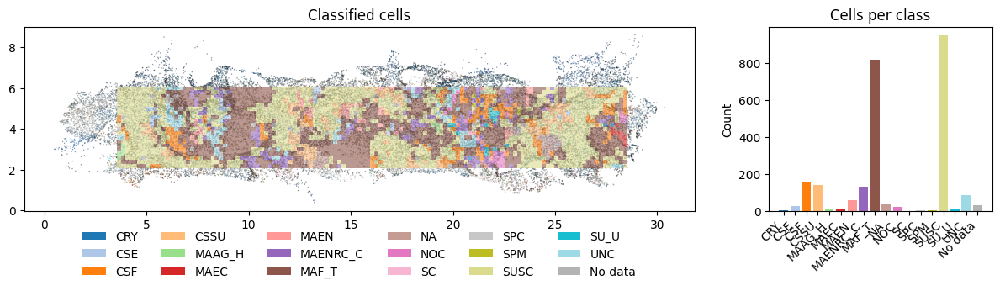

In [19]:
from substrata.visualizations import show_classified_grid_cells
plt = show_classified_grid_cells(pcd, bboxes, intercepts, show_points=True, point_size=1, title="Classified cells")
plt.show()

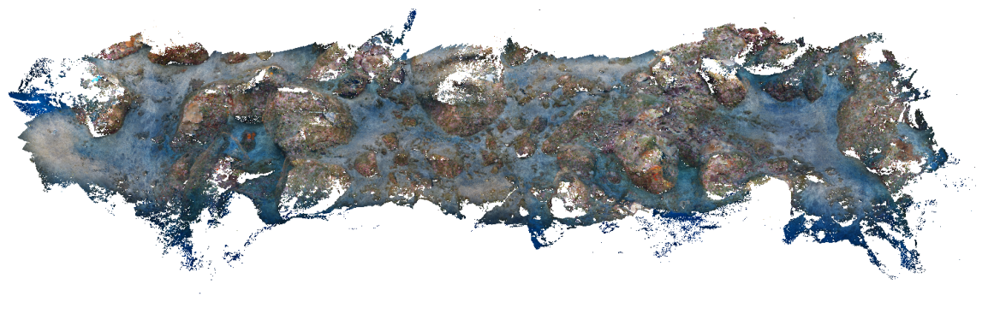

(array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
  

In [20]:
plot_2d_ortho(pcd)

In [14]:
cams.get_cam_dists(pcd,15)

Calculating camera distances...:  14%|█▍        | 100/710 [00:04<00:25, 24.40it/s]


KeyboardInterrupt: 